In [1]:
#关闭警告信息
import warnings  
warnings.filterwarnings("ignore")

In [2]:
#测试GPU可用性
import tensorflow as tf
print('GPU可用性:',tf.test.is_gpu_available())

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
GPU可用性: True


2025-05-31 18:12:45.081025: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-31 18:12:46.052509: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /device:GPU:0 with 30987 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:67:02.0, compute capability: 7.0


读取数据

In [2]:
#加载预处理后的数据
import pandas as pd
trainmap = pd.read_csv('/mnt/workspace/DNA_methylation_Data/trainmap.csv')
traindata = pd.read_pickle('/mnt/workspace/DNA_methylation_Data/Analysis_Data_pkl/DNA_Methylation_Data.pkl')
dna_methylation_cg=pd.read_excel('/mnt/workspace/DNA_methylation_Data/Analysis_Data_pkl/DNA_Methylation_CG.xlsx')

In [3]:
#拼接CG编号
CG_ID_str=['sample_id']+list(dna_methylation_cg.loc[:,'cpgsite'])
traindata.columns=CG_ID_str
traindata.head(10)

,sample_id,cg00050873,cg00212031,cg00213748,cg00214611,cg00455876,cg01707559,cg02004872,cg02011394,cg02050847,...,cg12735498,cg12737588,cg12738347,cg12758090,cg12766407,cg12789522,cg12793879,cg12794168,cg12799119,cg12848808
0,train10001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.096055,4.051632,-0.355631,1.157883,-9.210440,-2.921730,-3.472874,1.202370,-5.773449,-0.164336
1,train10002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.451424,4.178048,-0.144221,0.944243,-3.938986,-2.732410,-3.406479,0.866223,-4.489850,-0.285874
2,train10003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.241113,4.402578,-0.562248,0.924494,-5.773449,-2.767818,-3.619579,1.098346,-4.585271,-0.326813
3,train10004,NaN,NaN,NaN,NaN,NaN,-1.398461,NaN,NaN,NaN,...,-0.184485,3.744756,-1.087711,1.515914,-5.273603,-3.580953,-3.284902,1.179996,-4.489850,-0.570906
4,train10005,1.136022,-4.489850,NaN,-3.993781,1.312567,-2.901295,-4.585271,2.804368,2.985388,...,-0.160310,3.744756,-0.866223,1.529517,-5.273603,-2.823096,-3.406479,1.294708,-4.690541,-0.132166
5,train10006,1.423834,-9.210440,1.035353,-3.837361,1.288795,-3.100385,-5.093549,2.767818,1.848299,...,0.003999,4.178048,-1.536363,1.130596,-9.210440,-2.804368,-3.619579,1.157883,-4.807960,-0.885489
6,train10007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.092047,4.247583,-0.200630,1.613763,-5.093549,-2.861514,-3.543689,1.109037,-5.773449,-0.164336
7,train10008,1.475799,-3.993781,NaN,-4.051632,1.475799,-3.314031,-4.807960,2.785946,2.196336,...,-0.241113,4.402578,-0.532105,1.550147,-5.093549,-3.100385,-3.374769,1.125184,-4.489850,0.220849
8,train10009,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.212757,3.938986,-1.342748,1.423834,-4.585271,-3.007447,-3.472874,1.208006,-4.247583,-0.502197
9,train10010,1.515914,-4.051632,NaN,-4.585271,1.174443,-2.681278,-4.112908,3.406479,2.069693,...,-0.372163,4.807960,-0.570906,1.423834,-6.811545,-2.804368,-3.472874,1.136022,-4.247583,-0.703513


数据预处理：处理空缺数据、数据拼接、转化数据类型

In [4]:
#统计数据空缺值
traindata_null=traindata.isnull().sum().sum()    #统计前10万个特征缺失值
data_sum=traindata.shape[0]*traindata.shape[1]
traindata_null_rate=traindata_null/data_sum    #计算特征缺失率
print('训练数据缺失数据量为:{0},数据总量为:{1}'.format(traindata_null,data_sum))
print('训练数据缺失率为:{0}%'.format(round(traindata_null_rate*100,4)))

训练数据缺失数据量为:46058632,数据总量为:823308233
训练数据缺失率为:5.5943%


In [5]:
#缺失数据处理
traindata.fillna(0,inplace=True)    #训练集预处理

In [6]:
# 拼接数据集
traindata=traindata.merge(trainmap[['sample_id', 'age', 'gender', 'sample_type', 'disease']],on='sample_id',how='left')

In [8]:
pd.isnull(traindata).sum()

sample_id       0
cg00050873      0
cg00212031      0
cg00213748      0
cg00214611      0
               ..
cg12848808      0
age             0
gender         69
sample_type     0
disease         0
Length: 100005, dtype: int64

In [10]:
traindata['gender'].value_counts()

gender
F    4409
M    3755
Name: count, dtype: int64

In [11]:
traindata.shape

(8233, 100005)

In [9]:
#统计数据中患病数据和患病数据汇总
sample_type_sum=traindata['sample_type'].value_counts()    #统计患病数据总量
print('-----------------患病数据总量----------------')
print(sample_type_sum)
disease_sum=traindata['disease'].value_counts()    #汇总患病数据
print('-----------------患病数据汇总----------------')
print(disease_sum)

-----------------患病数据总量----------------
sample_type
control           6266
disease tissue    1967
Name: count, dtype: int64
-----------------患病数据汇总----------------
disease
control                 6266
Alzheimer's disease      737
schizophrenia            381
Parkinson's disease      266
rheumatoid arthritis     159
stroke                   147
Huntington's disease     135
Graves' disease           58
type 2 diabetes           46
Sjogren's syndrome        38
Name: count, dtype: int64


In [9]:
#读取卒中DNA甲基化数据
Stroke_Data=traindata.loc[traindata.loc[:,'disease']=='stroke',:]
Stroke_Data.shape

(147, 100005)

In [10]:
#读取卒中DNA甲基化数据
Normal_Data=traindata.loc[traindata.loc[:,'disease']=='control',:]
Normal_Data.shape

(6266, 100005)

In [11]:
#整合数据
Analysis_Data=pd.concat([Stroke_Data,Normal_Data],axis=0)
Analysis_Data.shape

(6413, 100005)

In [12]:
#数据类型转化
disease_mapping = {
    'control': 0,
    'stroke': 1,
}    #构建数据对应关系
sample_type_mapping = {'control': 0, 'disease tissue': 1}
gender_mapping = {'F': 0, 'M': 1}
#训练集转化
Analysis_Data['disease_encode']=Analysis_Data['disease'].map(disease_mapping)
Analysis_Data['sample_type_encode']=Analysis_Data['sample_type'].map(sample_type_mapping)
Analysis_Data['gender_encode']=Analysis_Data['gender'].map(gender_mapping)

In [18]:
#输出仅包含卒中和正常组的数据
Analysis_Data.to_pickle('/mnt/workspace/DNA_methylation_Data/Stroke_Data/Stroke_Data.pkl')
Analysis_Data.to_csv('/mnt/workspace/DNA_methylation_Data/Stroke_Data/Stroke_Data.csv')

读取数据

In [1]:
import pandas as pd
Data=pd.read_pickle('/mnt/workspace/DNA_methylation_Data/Stroke_Data/Stroke_Data.pkl')
Data.head(10)

,sample_id,cg00050873,cg00212031,cg00213748,cg00214611,cg00455876,cg01707559,cg02004872,cg02011394,cg02050847,...,cg12794168,cg12799119,cg12848808,age,gender,sample_type,disease,disease_encode,sample_type_encode,gender_encode
8040,train18041,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.804620,-3.406479,-1.991711,78.0,F,disease tissue,stroke,1,1,0.0
8041,train18042,2.049755,-3.472874,0.000000,-3.837361,0.974195,-2.375206,-3.659672,3.790034,4.690541,...,0.871025,-3.993781,-1.642924,52.0,M,disease tissue,stroke,1,1,1.0
8042,train18043,2.196336,-2.985388,0.000000,-2.963760,0.984269,-2.324893,-3.790034,3.790034,4.247583,...,0.994389,-4.051632,-2.059685,92.0,M,disease tissue,stroke,1,1,1.0
8043,train18044,0.000000,0.000000,0.000000,0.000000,0.000000,-1.242189,0.000000,0.000000,0.000000,...,1.392179,-3.886935,-2.648415,87.0,F,disease tissue,stroke,1,1,0.0
8044,train18045,2.632328,-3.284902,2.120936,-3.938986,1.628272,-2.616463,-3.886935,2.942546,4.247583,...,1.621000,-3.701353,-2.681278,87.0,M,disease tissue,stroke,1,1,1.0
8045,train18046,2.264792,-2.942546,0.000000,-3.052934,0.979226,-1.972920,-3.659672,3.543689,4.489850,...,1.191150,-3.619579,-1.991711,41.0,M,disease tissue,stroke,1,1,1.0
8046,train18047,0.000000,0.000000,0.000000,0.000000,0.000000,-1.098346,0.000000,0.000000,0.000000,...,1.436670,-3.744756,-2.120936,78.0,F,disease tissue,stroke,1,1,0.0
8047,train18048,1.963624,-4.178048,0.000000,-4.178048,0.124134,-2.324893,-5.492861,3.076403,4.940737,...,1.635580,-3.837361,-1.954393,80.0,M,disease tissue,stroke,1,1,1.0
8048,train18049,1.874054,0.000000,0.000000,0.000000,-0.298130,-1.798190,-4.112908,3.993781,4.585271,...,1.703036,-3.406479,-2.131436,69.0,M,disease tissue,stroke,1,1,1.0
8049,train18050,1.462650,-3.256540,0.000000,-4.051632,0.000000,-2.163468,-5.273603,2.921730,4.402578,...,1.489058,-2.785946,-1.963624,75.0,M,disease tissue,stroke,1,1,1.0


数据预处理和数据类型转化已经完成，随后进行特征选择。首先使用PCA算法计算保留95%和99%信息的维度，并将数据降维至3维可视化数据分布。对甲基化位点采用方差过滤，高相关过滤和lasso回归.

In [2]:
#采用PCA算法计算保留95%和99%信息的weidu
Methylation=Data.iloc[:,1:-7]
Methylation.shape

(6413, 100000)

In [ ]:
#执行PCA算法-计算保留99%信息时的维度
from sklearn.decomposition import PCA
Methylaion_PCA=PCA(n_components=0.99)
PCA_Methylation_99=Methylaion_PCA.fit_transform(Methylation)    #数据降维
PCA_Methylation_99.shape

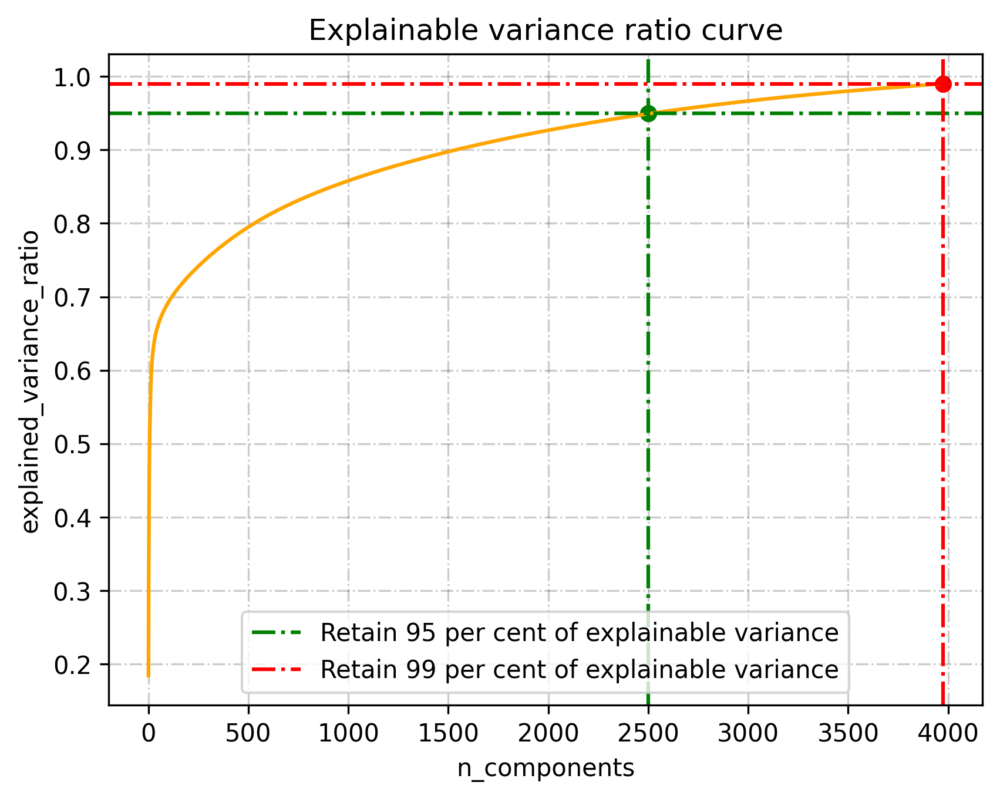

In [4]:
#计算可解释方差比
import numpy as np
import matplotlib.pyplot as plt
Explain_variance=np.cumsum(Methylaion_PCA.explained_variance_ratio_)
#绘图
Explain_variance_plt=plt.figure(dpi=300)
Epl_variance=Explain_variance_plt.add_subplot(111)
Epl_variance.set_title('Explainable variance ratio curve')
Epl_variance.grid(color='black',linestyle='-.',alpha=0.2)
Epl_variance.plot(np.arange(1,len(Explain_variance)+1,1,dtype=int),Explain_variance,color='orange',linestyle='-')
#添加95%可解释方差曲线
Epl_variance.scatter(x=2500,y=0.95,color='green',marker='o')
Epl_variance.axhline(y=0.95, color='green', linestyle='-.')
Epl_variance.axvline(x=2500, color='green', linestyle='-.', label='Retain 95 per cent of explainable variance')
#添加99%可解释方差曲线
Epl_variance.scatter(3973,0.99,color='red',marker='o')
Epl_variance.axhline(y=0.99, color='red', linestyle='-.')
Epl_variance.axvline(x=3973, color='red', linestyle='-.', label='Retain 99 per cent of explainable variance')
Epl_variance.set_xlabel('n_components')
Epl_variance.set_ylabel('explained_variance_ratio')
plt.legend()
plt.show()

In [5]:
#使用PCA将数据降维至3维
from sklearn.decomposition import PCA
from pandas import DataFrame
PCADisplay3D=PCA(n_components=3)
Methylation3D_PCA=PCADisplay3D.fit_transform(Methylation)    #PCA3D降维
Methylation3D_PCA=DataFrame(Methylation)
Methylation3D_PCA['Disease_Encoder']=Data.loc[:,'disease_encode']

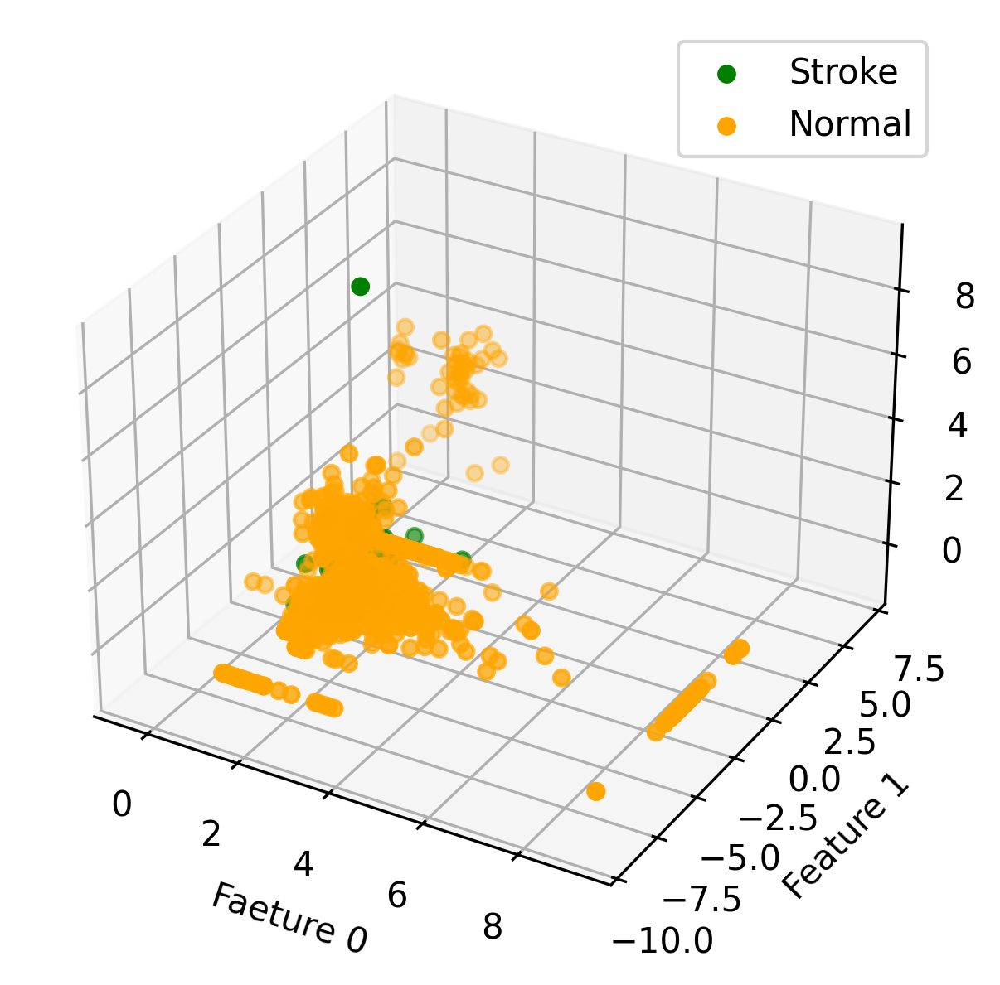

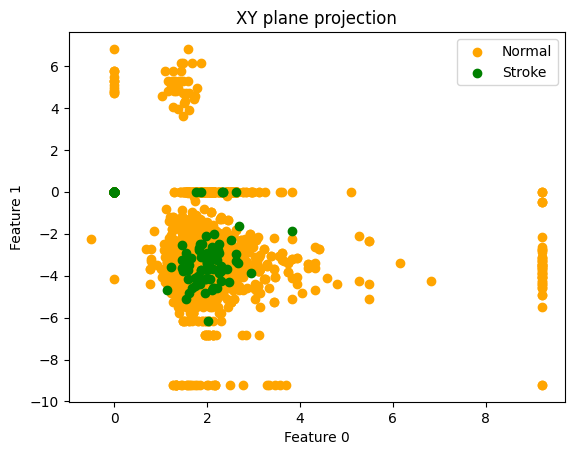

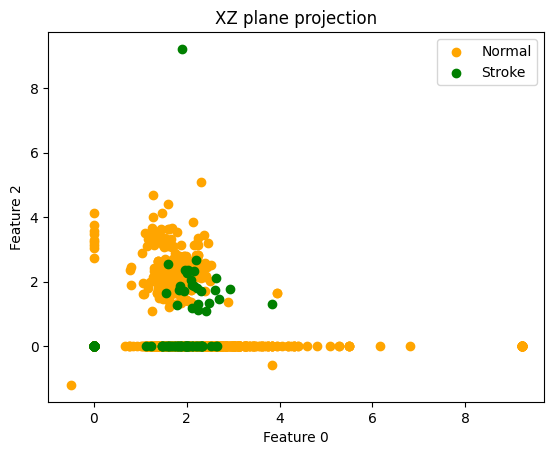

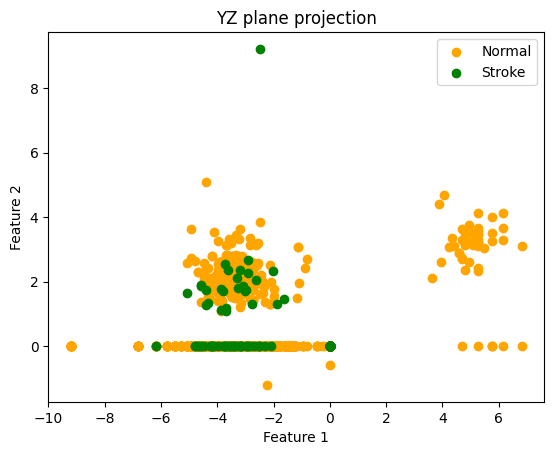

In [6]:
#绘制3D散点图
import matplotlib.pyplot as plt  
from mpl_toolkits.mplot3d import Axes3D
NormalData=Methylation3D_PCA.loc[Methylation3D_PCA.loc[:,'Disease_Encoder']==0,:]
Stroke_Data=Methylation3D_PCA.loc[Methylation3D_PCA.loc[:,'Disease_Encoder']==1,:]
OA_X,OA_Y,OA_Z=NormalData.iloc[:,0],NormalData.iloc[:,1],NormalData.iloc[:,2]
CON_X,CON_Y,CON_Z=Stroke_Data.iloc[:,0],Stroke_Data.iloc[:,1],Stroke_Data.iloc[:,2]
# 创建3D图形对象
fig=plt.figure(dpi=300)  
ax=fig.add_subplot(111, projection='3d')
ax.scatter(CON_X,CON_Y,CON_Z,color='green',label='Stroke')
ax.scatter(OA_X,OA_Y,OA_Z,color='orange',label='Normal')
# 设置标签  
ax.set_xlabel('Faeture 0')  
ax.set_ylabel('Feature 1')  
ax.set_zlabel('Feature 2')
plt.legend()
# 绘制投影到XY平面  
plt.figure() 
plt.title('XY plane projection')
plt.scatter(OA_X,OA_Y,color='orange',label='Normal')  
plt.scatter(CON_X,CON_Y,color='green',label='Stroke')  
plt.xlabel('Feature 0')  
plt.ylabel('Feature 1') 
plt.legend()
# 绘制投影到XZ平面  
plt.figure() 
plt.title('XZ plane projection')
plt.scatter(OA_X,OA_Z,color='orange',label='Normal')  
plt.scatter(CON_X,CON_Z,color='green',label='Stroke')  
plt.xlabel('Feature 0')  
plt.ylabel('Feature 2')
plt.legend()
# 绘制投影到YZ平面  
plt.figure() 
plt.title('YZ plane projection')
plt.scatter(OA_Y,OA_Z,color='orange',label='Normal')  
plt.scatter(CON_Y,CON_Z,color='green',label='Stroke')  
plt.xlabel('Feature 1')  
plt.ylabel('Feature 2')
plt.legend()
plt.show()

In [3]:
#对数据采取低方差过滤算法
from pandas import DataFrame
from sklearn.feature_selection import VarianceThreshold
Variance_Selector=VarianceThreshold(threshold=0.5)
VarSele_Data=Variance_Selector.fit_transform(Methylation)    #执行低方差过滤
VarSele_Data=DataFrame(VarSele_Data)
VarSele_Data.columns=Variance_Selector.get_feature_names_out()
VarSele_Data.head(10)

,cg00050873,cg00212031,cg00214611,cg01707559,cg02004872,cg02011394,cg02050847,cg02233190,cg02494853,cg02839557,...,cg12700439,cg12711755,cg12712409,cg12719753,cg12725420,cg12727528,cg12732791,cg12737588,cg12766407,cg12848808
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-6.163916,0.000000,...,2.715111,2.921730,1.417454,2.804368,-4.112908,-5.773449,1.152395,5.773449,-5.492861,-1.991711
1,2.049755,-3.472874,-3.837361,-2.375206,-3.659672,3.790034,4.690541,-3.701353,-3.406479,-3.886935,...,2.375206,3.619579,2.241551,2.600812,-2.349789,-4.051632,0.909791,4.489850,-4.690541,-1.642924
2,2.196336,-2.985388,-2.963760,-2.324893,-3.790034,3.790034,4.247583,-3.701353,-3.790034,-2.901295,...,2.985388,2.324893,2.049755,2.100192,-1.848299,-4.178048,1.045719,4.690541,-5.273603,-2.059685
3,0.000000,0.000000,0.000000,-1.242189,0.000000,0.000000,0.000000,0.000000,-4.322159,0.000000,...,2.570129,2.388119,2.010774,2.300497,-2.264792,-3.993781,1.423834,4.402578,-5.093549,-2.648415
4,2.632328,-3.284902,-3.938986,-2.616463,-3.886935,2.942546,4.247583,-4.585271,-3.837361,-2.525567,...,2.388119,3.659672,1.695385,2.585369,-2.059685,-4.322159,1.848299,5.492861,-4.585271,-2.681278
5,2.264792,-2.942546,-3.052934,-1.972920,-3.659672,3.543689,4.489850,-2.540233,-2.823096,-2.985388,...,3.029956,3.507691,2.349789,2.230092,-2.069693,-4.690541,1.152395,4.807960,-5.773449,-1.991711
6,0.000000,0.000000,0.000000,-1.098346,0.000000,0.000000,0.000000,0.000000,-4.178048,0.000000,...,2.732410,3.284902,1.814692,2.264792,-2.230092,-4.402578,1.823018,4.690541,-5.273603,-2.120936
7,1.963624,-4.178048,-4.178048,-2.324893,-5.492861,3.076403,4.940737,-2.401172,-3.619579,-3.149987,...,2.555085,3.619579,1.790011,2.555085,-1.848299,-4.402578,1.300641,5.273603,-5.093549,-1.954393
8,1.874054,0.000000,0.000000,-1.798190,-4.112908,3.993781,4.585271,-3.659672,-3.314031,-3.149987,...,2.767818,3.472874,1.522701,2.570129,-1.781880,-4.489850,0.949208,4.940737,-5.273603,-2.131436
9,1.462650,-3.256540,-4.051632,-2.163468,-5.273603,2.921730,4.402578,-2.511081,-2.921730,-2.942546,...,2.767818,2.555085,1.945225,3.149987,-1.404768,-6.163916,0.000000,4.489850,-5.773449,-1.963624


In [6]:
#构建特征方差数据表
VarianseData=DataFrame()
VarianseData['MetaBolite']=Variance_Selector.feature_names_in_
VarianseData['Variances']=Variance_Selector.variances_
VarianseData.shape

(100000, 2)

In [9]:
#输出甲基化位点方差值
VarianseData.to_excel('/mnt/workspace/Run_Result/Vraince_result.xlsx')

In [4]:
#执行基于F分布的方差分析进行高相关过滤
from sklearn.feature_selection import SelectKBest, f_classif
Selectk=SelectKBest(score_func=f_classif,k=3973)
FselectorData=Selectk.fit_transform(VarSele_Data,Data.loc[:,'disease_encode'])
FselectorData=pd.DataFrame(FselectorData)
feature_nameindex=Selectk.get_support(indices=True)    #获取特征索引
feature_names=VarSele_Data.columns    #获取特征名
Kfeature_names=[feature_names[i] for i in feature_nameindex]
FselectorData.columns=Kfeature_names
FselectorData.head(10)

,cg01404988,cg02393514,cg03315431,cg04065558,cg04294190,cg04490290,cg04630982,cg04667267,cg04931939,cg05032098,...,cg11183227,cg11353598,cg11540553,cg12031275,cg12160578,cg12309653,cg12368188,cg12379383,cg12414181,cg12627870
0,-1.536363,-1.557086,1.146922,-4.807960,1.695385,-1.141464,-0.132166,-0.934347,-2.785946,-0.540693,...,0.739857,-1.179996,4.112908,-0.566575,-2.142023,-4.112908,-3.938986,-2.388119,-2.664729,-3.100385
1,-2.496772,-2.241551,2.152700,-4.489850,0.000000,0.000000,0.000000,0.000000,0.000000,-1.790011,...,1.354970,-2.218738,3.701353,-1.522701,-1.954393,-3.076403,-3.886935,-1.749816,-2.362431,-2.749976
2,-2.482634,-1.628272,2.288480,-3.993781,0.204671,-2.468664,-1.680203,-2.152700,-2.901295,-2.001208,...,1.536363,-2.163468,3.790034,0.188519,-2.120936,-2.901295,-3.374769,-1.710727,-3.701353,-2.616463
3,-3.149987,-1.954393,1.114405,-4.112908,2.089945,-0.188519,-0.949208,-1.174443,-3.256540,-0.851873,...,2.100192,-2.454856,3.406479,-1.430239,-2.881228,-3.543689,-3.886935,-2.362431,-3.938986,-2.454856
4,-2.921730,-2.511081,2.525567,-3.993781,1.592260,-2.337277,-1.856830,-1.672671,-3.228904,-2.767818,...,1.404768,-2.010774,3.886935,0.823416,-2.253116,-3.007447,-3.439160,-1.814692,-3.343970,-2.414368
5,-2.600812,-1.650305,2.616463,-4.051632,1.765757,-3.201956,-1.657722,-1.650305,-2.823096,-1.991711,...,2.441207,-1.219330,4.489850,-0.216802,-2.648415,-2.732410,-3.314031,-1.564056,-1.991711,-2.732410
6,-2.861514,-0.823416,0.989323,-3.507691,2.030118,-0.347383,-0.100063,0.472506,-2.881228,-1.185564,...,1.798190,-2.349789,3.837361,3.580953,-2.842141,-4.112908,-3.837361,-2.496772,-2.312634,-2.648415
7,-3.052934,-2.454856,2.230092,-3.439160,-1.294708,0.000000,-2.100192,0.000000,-1.578093,-2.362431,...,1.430239,-2.585369,3.374769,4.178048,-1.814692,-2.414368,-3.886935,-2.767818,-2.312634,-2.482634
8,-2.496772,-2.427712,2.276579,-3.175661,-0.964166,0.000000,-1.695385,0.000000,-2.375206,-2.648415,...,1.449607,-2.375206,3.659672,-1.806416,-2.079779,-2.414368,-3.580953,-2.441207,-2.842141,-2.715111
9,-2.525567,-2.600812,2.616463,-3.284902,-1.271175,0.000000,0.000000,0.000000,0.000000,-1.918093,...,1.152395,-1.635580,3.507691,0.000000,-1.606561,-2.100192,-3.029956,-2.100192,-2.069693,-2.616463


In [8]:
#获取相关信息
KBestF_info=DataFrame()
KBestF_info['Feature']=Kfeature_names    #载入特征
KBestF_info['scores']=Selectk.scores_[:3973]
KBestF_info['P value']=Selectk.pvalues_[:3973]
KBestF_info.shape

(3973, 3)

In [9]:
#输出相关计算结果
KBestF_info.to_excel('/mnt/workspace/Run_Result/FCorr_With_Methylation.xlsx')

In [5]:
#采用Lasso算法进行特征选择
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
Target=Data.loc[:,'disease_encode']
# 数据标准化  
scaler=StandardScaler()  
X_scaled=scaler.fit_transform(FselectorData)
# 拆分数据集  
X_train,X_test,y_train,y_test=train_test_split(X_scaled,Target, test_size=0.3, random_state=2024)
lasso_model = LogisticRegression(penalty='l1',solver='liblinear',C=0.1,random_state=2024,max_iter=10000)    # 设置Lasso模型 
lasso_model.fit(X_train,y_train)    # 训练模型  

LogisticRegression(C=0.1, max_iter=10000, penalty='l1', random_state=2024,
                   solver='liblinear')

In [6]:
#评估Lasso模型性能
print('Lasso模型训练集Accuracy为:',accuracy_score(y_train,lasso_model.predict(X_train)))
print('Lasso模型测试集Accuracy为:',accuracy_score(y_test,lasso_model.predict(X_test)))

Lasso模型训练集Accuracy为: 1.0
Lasso模型测试集Accuracy为: 0.9994802494802495


In [10]:
#查看模型混淆矩阵
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
def Display_ConfusionMatrix(model,data,target):
    ConfusionMatrix_result=confusion_matrix(target,model.predict(data),labels=[0,1])    #计算混淆举证
    Display_ConfusionMatrix=ConfusionMatrixDisplay(ConfusionMatrix_result,display_labels=['control','Stroke'])
    Display_ConfusionMatrix.plot(include_values=True, cmap='viridis', xticks_rotation='horizontal', values_format='d', ax=None)
    plt.title('Confusion Matrix')
    plt.show()

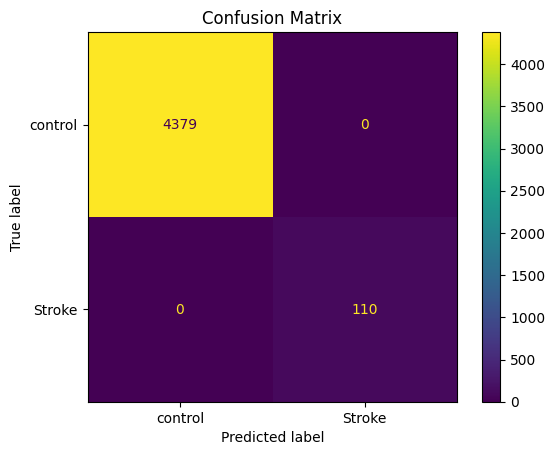

In [11]:
#查看训练集混淆举证
Display_ConfusionMatrix(model=lasso_model,data=X_train,target=y_train)

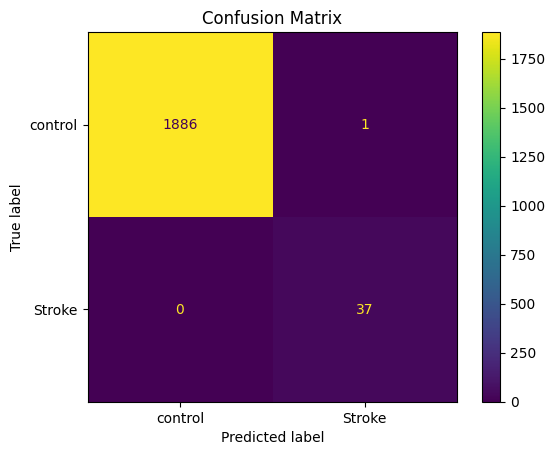

In [12]:
#查看测试集混淆举证
Display_ConfusionMatrix(model=lasso_model,data=X_test,target=y_test)

In [13]:
import joblib
joblib.dump(lasso_model,'/mnt/workspace/Models/Lasso.pkl')

['/mnt/workspace/Models/Lasso.pkl']

In [15]:
#提取特征并进行特征选择
import numpy as np
LassoFeature_Index=np.where(lasso_model.coef_!=0)[1]
LassoFeature=FselectorData.iloc[:,LassoFeature_Index]
LassoFeature.shape

(6413, 70)

/tmp/ipykernel_10044/197567409.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  Coef_ax.set_xticklabels(LassoFeature_Index)


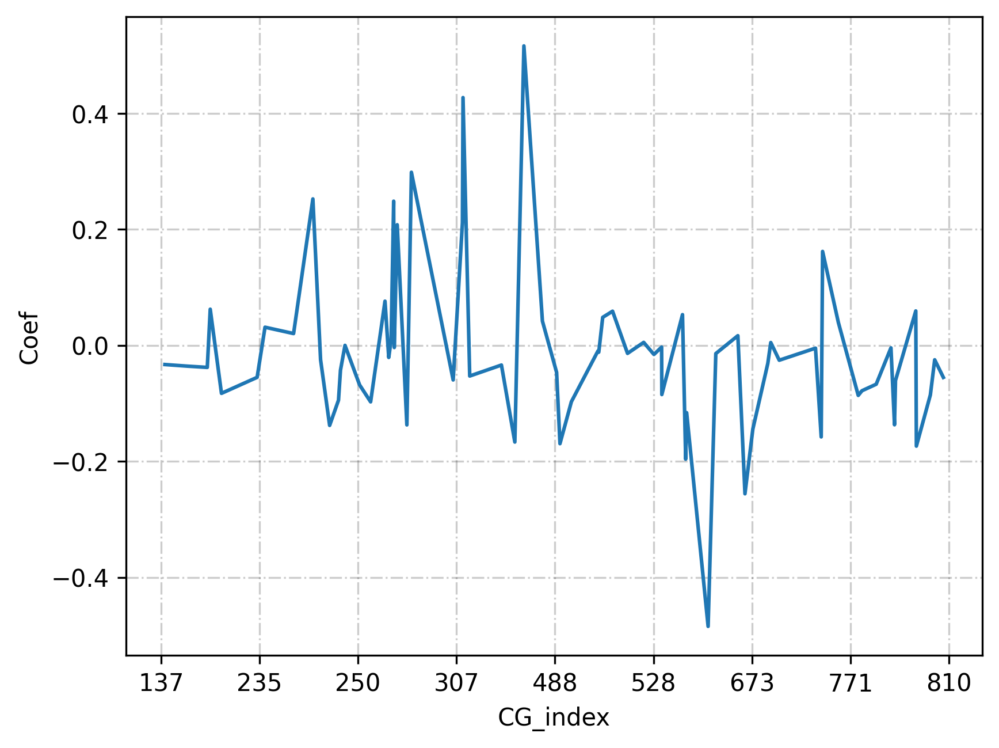

In [16]:
import matplotlib.pyplot as plt
Coef=plt.figure(dpi=300)
Coef_ax=Coef.add_subplot(111)
Coef_ax.grid(color='black',linestyle='-.',alpha=0.2)
Coef_ax.plot(LassoFeature_Index,pd.DataFrame(lasso_model.coef_[0][LassoFeature_Index]))
Coef_ax.set_xlabel('CG_index')
Coef_ax.set_ylabel('Coef')
Coef_ax.set_xticklabels(LassoFeature_Index)
plt.show()

使用Lasso验证DNA甲基化位点特征选择后的结果

In [17]:
#使用特征选择后的模型验证模型精度-输入[batchs,70],输出[batch,1]
X_TrainEv,X_testEv,y_trainEv,y_testEv=train_test_split(LassoFeature,Target, test_size=0.3, random_state=2024)
lasso_modelEvaluateD=LogisticRegression(penalty='l1',solver='liblinear',C=0.1,random_state=2024,max_iter=10000)
lasso_modelEvaluateD.fit(X_TrainEv,y_trainEv)

LogisticRegression(C=0.1, max_iter=10000, penalty='l1', random_state=2024,
                   solver='liblinear')

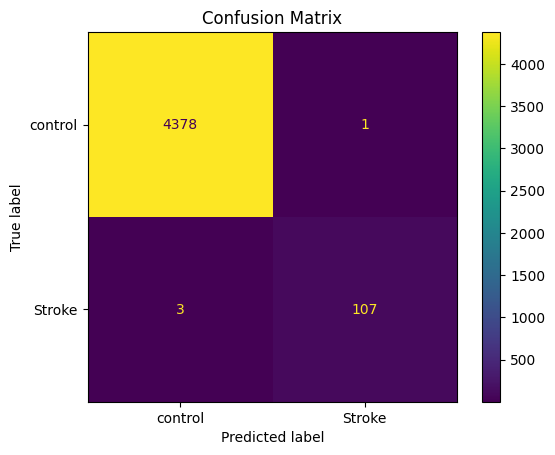

In [18]:
#训练集混淆举证
Display_ConfusionMatrix(lasso_modelEvaluateD,X_TrainEv,y_trainEv)

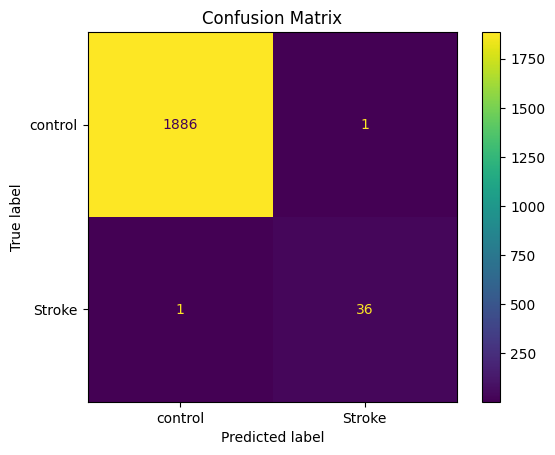

In [19]:
#测试集混淆举证
Display_ConfusionMatrix(lasso_modelEvaluateD,X_testEv,y_testEv)

In [20]:
#使用特征选择后的数据集再次训练模型评估特征选择效果-10折交叉验证
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold,cross_val_score
from sklearn.model_selection import cross_validate
def Model_Evelate_CV(Model,Data,Target):
    cv=KFold(n_splits=10, shuffle=True, random_state=2024)
    kv_scores =cross_validate(Model,Data,Target,cv=cv,scoring='accuracy',
                          return_train_score=True)
    print('Fit_time:',kv_scores['fit_time'])
    print('Mean Fit_time:',kv_scores['fit_time'].mean())
    print('score_time:',kv_scores['score_time'])
    print('Mean score_time:',kv_scores['score_time'].mean())
    print('train_score:',kv_scores['train_score'])
    print('Mean train_score:',kv_scores['train_score'].mean())
    print('test_score:',kv_scores['test_score'])
    print('Mean test_score:',kv_scores['test_score'].mean())
#用特征选择后的数据集再次训练模型评估特征选择效果-10折交叉验证
lasso_modelEvaluate=LogisticRegression(penalty='l1',solver='liblinear',C=0.1,random_state=2024,max_iter=10000)    # 设置Lasso模型
Model_Evelate_CV(Model=lasso_modelEvaluate,Data=LassoFeature,Target=Target)

Fit_time: [0.15090775 0.20123768 0.1979394  0.19683361 0.19801974 0.19604516
 0.19239807 0.17037344 0.16579437 0.18889141]
Mean Fit_time: 0.1858440637588501
score_time: [0.00298166 0.01086545 0.00288725 0.00284386 0.00290656 0.00284505
 0.00278687 0.00281239 0.00273204 0.00283217]
Mean score_time: 0.003649330139160156
train_score: [0.99930688 0.9991336  0.99930688 0.9989605  0.99948025 0.999307
 0.99948025 0.99913375 0.99948025 0.99913375]
Mean train_score: 0.9992723102452785
test_score: [0.99844237 0.99844237 1.         0.99843994 0.99687988 0.99843994
 1.         0.99687988 0.99843994 0.99687988]
Mean test_score: 0.9982844173580029


In [21]:
#整合并输出特征选择结果
CG_Feature=Data.iloc[:,LassoFeature_Index]
DNA_Methylstion_Feature=pd.concat([CG_Feature,Data.iloc[:,-7:]],axis=1)
DNA_Methylstion_Feature.shape

(6413, 77)

In [22]:
DNA_Methylstion_Feature.to_excel('/mnt/workspace/Run_Result/DNA_Methylstion_Feature.xlsx','UTF-8')

In [23]:
DNA_Methylstion_Feature.to_csv('/mnt/workspace/Run_Result/DNA_Methylstion_Feature.csv')

In [24]:
joblib.dump(lasso_modelEvaluateD,'/mnt/workspace/Models/lasso_modelEvaluate.pkl')

['/mnt/workspace/Models/lasso_modelEvaluate.pkl']

经过低方差过滤，基于F分布的相关分析和Lasso回归，获得了70个甲基化位点作为特征子集。

In [3]:
#读取DNA甲基化位点数据
import pandas as pd
MethylationData=pd.read_excel('Data/DNA_Methylstion_Feature.xlsx')
MethylationData.head(10)

,Unnamed: 0,cg03706273,cg00412368,cg01370179,cg01522249,cg01999212,cg03718079,cg03977822,cg05100261,cg05876899,...,cg01446576,cg01550055,cg01717973,age,gender,sample_type,disease,disease_encode,sample_type_encode,gender_encode
0,8040,-4.112908,-0.015997,-1.557086,0.372163,-2.525567,-0.851873,-0.124134,-0.832866,2.921730,...,-2.570129,-1.585160,-3.052934,78.0,F,disease tissue,stroke,1,1,0.0
1,8041,-2.767818,-1.417454,-1.417454,0.000000,-4.585271,-2.648415,-0.489446,-3.938986,3.228904,...,-3.744756,-1.247949,-3.886935,52.0,M,disease tissue,stroke,1,1,1.0
2,8042,-3.374769,-2.020410,-1.529517,1.650305,-4.112908,-2.362431,-0.430440,-4.940737,3.076403,...,-4.051632,-1.536363,-5.273603,92.0,M,disease tissue,stroke,1,1,1.0
3,8043,-4.807960,-0.339147,-1.814692,-0.744433,-2.985388,-1.798190,0.298130,-0.372163,3.374769,...,-4.585271,-1.757764,-4.178048,87.0,F,disease tissue,stroke,1,1,0.0
4,8044,-4.402578,-2.555085,-1.665178,1.734052,-3.507691,-3.149987,-0.128149,-4.247583,3.228904,...,-4.247583,-1.726235,-3.993781,87.0,M,disease tissue,stroke,1,1,1.0
5,8045,-3.149987,-1.831393,-1.599394,1.443126,-2.732410,-3.175661,-0.076021,-4.112908,3.314031,...,-4.112908,-1.253727,-4.112908,41.0,M,disease tissue,stroke,1,1,1.0
6,8046,-3.619579,-0.112095,-1.119787,-0.076021,-2.823096,-1.982282,0.164336,-0.019997,3.124904,...,-4.585271,-1.271175,-3.837361,78.0,F,disease tissue,stroke,1,1,0.0
7,8047,-4.051632,-2.079779,-1.550147,0.000000,-4.402578,-3.837361,-0.343263,-4.807960,3.284902,...,-4.322159,-1.324576,-4.051632,80.0,M,disease tissue,stroke,1,1,1.0
8,8048,-3.076403,-1.781880,-1.456115,2.241551,-3.837361,-2.441207,-0.285874,-5.492861,3.201956,...,-4.247583,-1.157883,-4.322159,69.0,M,disease tissue,stroke,1,1,1.0
9,8049,-2.664729,-1.718460,-1.392179,2.131436,-3.701353,-2.414368,-0.056003,-5.492861,3.543689,...,-3.659672,-0.974195,-3.886935,75.0,M,disease tissue,stroke,1,1,1.0


统计和处理空缺数据

In [4]:
#统计甲基化数据
pd.isnull(MethylationData.iloc[:,:-7]).sum().sum()

0

In [5]:
#统计其他附加数据
pd.isnull(MethylationData.iloc[:,-7:]).sum()

age                    0
gender                68
sample_type            0
disease                0
disease_encode         0
sample_type_encode     0
gender_encode         68
dtype: int64

In [6]:
from collections import Counter
print(Counter(MethylationData['gender']))

Counter({'F': 3387, 'M': 2958, nan: 68})


In [7]:
MethylationData['gender'].fillna('M',inplace=True)
MethylationData['gender_encode'].fillna('1',inplace=True)

<AxesSubplot:>

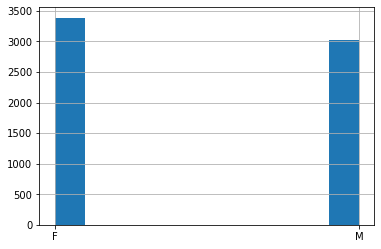

In [8]:
MethylationData['gender'].hist()

In [9]:
print(Counter(MethylationData['gender']))

Counter({'F': 3387, 'M': 3026})


In [10]:
pd.isnull(MethylationData).sum().sum()

0

提取算法可处理的数据进行机器学习分析，筛选特征甲基化位点

In [11]:
Methylation=MethylationData.iloc[:,1:-7]    #甲基化数据
MapData=MethylationData.loc[:,['age','gender_encode','disease_encode']]    #其他附加数据
MLData=pd.concat([Methylation,MapData],axis=1)    #数据合并
MLData.shape

(6413, 73)

由于正常样本与卒中样本总量差异较大，因此使用数据重采样算法解决数据类别分布不均衡问题。
数据重采样策略针对训练集进行，外部测试集不使用数据重采样。同时，数据重采样后的训练集采用10-折交叉验证训练，独立外部测试集测试。

Counter({'control': 6266, 'stroke': 147})


<AxesSubplot:>

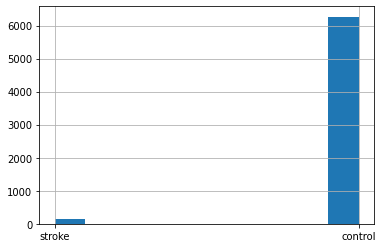

In [12]:
#统计和汇总疾病数据分布
print(Counter(MethylationData['disease']))
MethylationData['disease'].hist()

编写模型训练函数——常规训练

In [13]:
#查看模型混淆矩阵
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
def Display_ConfusionMatrix(model,data,target):
    ConfusionMatrix_result=confusion_matrix(target,model.predict(data),labels=[0,1])    #计算混淆举证
    Display_ConfusionMatrix=ConfusionMatrixDisplay(ConfusionMatrix_result,display_labels=['control','Stroke'])
    Display_ConfusionMatrix.plot(include_values=True, cmap='viridis', xticks_rotation='horizontal', values_format='d', ax=None)
    plt.title('Confusion Matrix')
    plt.show()

In [14]:
#计算PR曲线数据
from pandas import DataFrame
from sklearn.metrics import precision_recall_curve,accuracy_score
def PR_Curve(Model,Data,Label):
    X_train,X_test,y_train,y_test=train_test_split(Data,Label,train_size=0.7,random_state=2024)    #划分数据集
    predict_score=Model.predict_proba(X_test)[:, 1]    #获取概率值
    predict=Model.predict(X_test)     #获取预测标签
    accuracy=accuracy_score(y_test,predict)
    precision, recall, thresholds = precision_recall_curve(y_test, predict_score)    #计算PR曲线
    PR=DataFrame()    #将PR曲线数据合并到DataFrame
    #PR['thresholds']=thresholds
    PR['recall']=recall
    PR['precision']=precision
    return PR,accuracy

In [15]:
#计算ROC曲线数据
from sklearn.metrics import roc_curve, auc
def ROC_Curve(Model,Data,Label):
    X_train,X_test,y_train,y_test=train_test_split(Data,Label,train_size=0.7,random_state=2024)    #划分数据集
    predict_score=Model.predict_proba(X_test)[:, 1]    #获取概率值
    fpr, tpr, thresholds = roc_curve(y_test, predict_score)
    roc_auc = auc(fpr, tpr)    #计算AUC
    ROC=DataFrame()    #将PR曲线数据合并到DataFrame
    #ROC['thresholds']=thresholds
    ROC['tpr']=tpr
    ROC['fpr']=fpr
    return ROC,roc_auc

In [16]:
#编写模型训练评估函数
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score,recall_score,f1_score,accuracy_score
def RunTestModel(Model,Data,Label):
    X_train,X_test,y_train,y_test=train_test_split(Data,Label,stratify=Label,train_size=0.7,random_state=2024)    #划分数据集
    Model.fit(X_train,y_train)    #训练模型
    TrainPredict=Model.predict(X_train)    #计算训练集指标
    TrainPrecision=precision_score(y_train,TrainPredict)
    TrainRecall=recall_score(y_train,TrainPredict)
    TrainF1=f1_score(y_train,TrainPredict)
    TrainAcuracy=accuracy_score(y_train,TrainPredict)
    print('模型训练集Precision:{0},Recall:{1},F1_Score:{2},Accuracy:{3}'.format(TrainPrecision,TrainRecall,TrainF1,TrainAcuracy))
    TestPredict=Model.predict(X_test)    #测试集预测结果
    TestPrecision=precision_score(y_test,TestPredict)
    TestRecall=recall_score(y_test,TestPredict)
    TestF1=f1_score(y_test,TestPredict)
    TestAccuracy=accuracy_score(y_test,TestPredict)
    print('模型测试集Precision:{0},Recall:{1},F1_score:{2},Accuracy:{3}'.format(TestPrecision,TestRecall,TestF1,TestAccuracy))
    print('-------------------测试集混淆举证-------------------')
    Display_ConfusionMatrix(model=Model,data=X_test,target=y_test)

编写模型训练函数——数据重采样

In [17]:
#绘制模型混淆矩阵
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
def Computer_ConfusionMatrix(model,data,target):
    ConfusionMatrix_result=confusion_matrix(target,model.predict(data),labels=[0,1])    #计算混淆举证
    Display_ConfusionMatrix=ConfusionMatrixDisplay(ConfusionMatrix_result,display_labels=['control','Stroke'])
    Display_ConfusionMatrix.plot(include_values=True, cmap='viridis', xticks_rotation='horizontal', values_format='d', ax=None)
    plt.title('Confusion Matrix')
    plt.show()

In [18]:
#计算PR曲线数据
from pandas import DataFrame
from sklearn.metrics import precision_recall_curve,accuracy_score
def Computer_PRCurve(Model,Data,Label):
    predict_score=Model.predict_proba(Data)[:, 1]    #获取概率值
    predict=Model.predict(Data)     #获取预测标签
    accuracy=accuracy_score(Label,predict)
    precision, recall, thresholds = precision_recall_curve(Label, predict_score)    #计算PR曲线
    PR=DataFrame()    #将PR曲线数据合并到DataFrame
    PR['recall']=recall
    PR['precision']=precision
    return PR,accuracy

In [19]:
#计算ROC曲线数据
from sklearn.metrics import roc_curve, auc
def Computer_ROCCurve(Model,Data,Label):
    predict_score=Model.predict_proba(Data)[:, 1]    #获取概率值
    fpr, tpr, thresholds = roc_curve(Label, predict_score)
    roc_auc = auc(fpr, tpr)    #计算AUC
    ROC=DataFrame()    #将PR曲线数据合并到DataFrame
    ROC['tpr']=tpr
    ROC['fpr']=fpr
    return ROC,roc_auc

In [20]:
#模型训练-评估函数
import numpy as np
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split,KFold
from sklearn.metrics import precision_score,recall_score,f1_score,accuracy_score
def RunTrainModelCV(Resmaple,Model,Data,Label,cv):
    X_train,X_test,y_train,y_test=train_test_split(Data,Label,stratify=Label,train_size=0.7,random_state=2024)    #划分数据集
    X_train_Re,y_train_Re=Resmaple.fit_resample(X_train,y_train)
    print('resample shape:',Counter(y_train_Re))
    kf=KFold(n_splits=cv, shuffle=True, random_state=2025)
    Precision_fold,Recall_fold,F1Score_fold,Accuracy_fold=[],[],[],[]
    ValidPrecision_fold,ValidRecall_fold,ValidF1Score_fold,ValidAccuracy_fold=[],[],[],[]
    for train_index,valid_index in kf.split(X_train_Re):
        # 划分出当前折的训练和验证数据
        X_fold_train, X_fold_val = X_train_Re.iloc[train_index,:], X_train_Re.iloc[valid_index,:]
        y_fold_train, y_fold_val = y_train_Re.iloc[train_index], y_train_Re.iloc[valid_index]
        Model.fit(X_fold_train,y_fold_train)    #训练模型
        # Train Score
        TrainPredict_fold=Model.predict(X_fold_train)    #计算训练集指标
        TrainPrecision=precision_score(y_fold_train,TrainPredict_fold)
        Precision_fold.append(TrainPrecision)
        TrainRecall=recall_score(y_fold_train,TrainPredict_fold)
        Recall_fold.append(TrainRecall)
        TrainF1=f1_score(y_fold_train,TrainPredict_fold)
        F1Score_fold.append(TrainF1)
        TrainAcuracy=accuracy_score(y_fold_train,TrainPredict_fold)
        Accuracy_fold.append(TrainAcuracy)
        # Valid Score
        ValidPredict_fold=Model.predict(X_fold_val)    #计算训练集指标
        ValidPrecision=precision_score(y_fold_val,ValidPredict_fold)
        ValidPrecision_fold.append(ValidPrecision)
        ValidRecall=recall_score(y_fold_val,ValidPredict_fold)
        ValidRecall_fold.append(ValidRecall)
        ValidF1=f1_score(y_fold_val,ValidPredict_fold)
        ValidF1Score_fold.append(ValidF1)
        ValidAcuracy=accuracy_score(y_fold_val,ValidPredict_fold)
        ValidAccuracy_fold.append(ValidAcuracy)
    print('Model train Precision of flod:',Precision_fold)
    print('Model train Recall of flod:',Recall_fold)
    print('Model train F1 Score of flod:',F1Score_fold)
    print('Model train Accuracy of flod:',Accuracy_fold)
    print('模型训练集Precision:{0},Recall:{1},F1_Score:{2},Accuracy:{3}'.format(np.mean(Precision_fold),np.mean(Recall_fold),
                                                                           np.mean(F1Score_fold),np.mean(Accuracy_fold)))
    print('Model valid Precision of flod:',ValidPrecision_fold)
    print('Model valid train Recall of flod:',ValidRecall_fold)
    print('Model valid train F1 Score of flod:',ValidF1Score_fold)
    print('Model valid train Accuracy of flod:',ValidAccuracy_fold)
    print('模型Valid集Precision:{0},Recall:{1},F1_Score:{2},Accuracy:{3}'.format(np.mean(ValidPrecision_fold),np.mean(ValidRecall_fold),
                                                                           np.mean(ValidF1Score_fold),np.mean(ValidAccuracy_fold)))
    Model.fit(X_train_Re,y_train_Re)
    TestPredict=Model.predict(X_test)    #测试集预测结果
    TestPrecision=precision_score(y_test,TestPredict)
    TestRecall=recall_score(y_test,TestPredict)
    TestF1=f1_score(y_test,TestPredict)
    TestAccuracy=accuracy_score(y_test,TestPredict)
    print('模型测试集Precision:{0},Recall:{1},F1_score:{2},Accuracy:{3}'.format(TestPrecision,TestRecall,TestF1,TestAccuracy))
    print('-------------------测试集混淆举证-------------------')
    Computer_ConfusionMatrix(model=Model,data=X_test,target=y_test)
    PR,accuracy=Computer_PRCurve(Model=Model,Data=X_test,Label=y_test)
    ROC,roc_auc=Computer_ROCCurve(Model=Model,Data=X_test,Label=y_test)
    return PR,accuracy,ROC,roc_auc,Model

划分数据集并测试欠采样算法.

In [21]:
#切割数据
MLTestData=MLData.iloc[:,:-1]
MLTestLabel=MLData.iloc[:,-1]

In [22]:
#数据归一化
from pandas import DataFrame
from sklearn.preprocessing import StandardScaler,MinMaxScaler
ColumnsNames=MLTestData.columns
Stand=StandardScaler()
StandData=Stand.fit_transform(MLTestData)
MinMax=MinMaxScaler(feature_range=(0,1))
MinMaxData=MinMax.fit_transform(StandData)
MLTestData=DataFrame(MinMaxData)
MLTestData.columns=ColumnsNames

模型训练集Precision:1.0,Recall:1.0,F1_Score:1.0,Accuracy:1.0
模型测试集Precision:1.0,Recall:0.09090909090909091,F1_score:0.16666666666666669,Accuracy:0.9792099792099792
-------------------测试集混淆举证-------------------


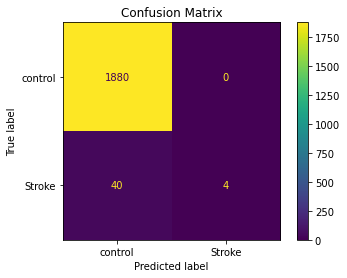

In [23]:
#使用随机森林算法作为衡量基准测试数据重采样算法性能
from sklearn.ensemble import RandomForestClassifier
Forest=RandomForestClassifier(random_state=2024)
RunTestModel(Model=Forest,Data=MLTestData,Label=MLTestLabel)

In [24]:
#计算PR和ROC曲线
Forest_PR,Forest_Accuracy=PR_Curve(Model=Forest,Data=MLTestData,Label=MLTestLabel)
Forest_ROC,Forest_ROC_AUC=ROC_Curve(Model=Forest,Data=MLTestData,Label=MLTestLabel)
Forest_PR.to_excel('Data/PR Curve/Resample/Forest_PR.xlsx')
Forest_ROC.to_excel('Data/ROC Curve/Resample/Forest_ROC.xlsx')

resample shape: Counter({0: 180, 1: 103})
Model train Precision of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train Recall of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train F1 Score of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train Accuracy of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
模型训练集Precision:1.0,Recall:1.0,F1_Score:1.0,Accuracy:1.0
Model valid Precision of flod: [1.0, 1.0, 0.8181818181818182, 0.8888888888888888, 1.0, 1.0, 1.0, 0.8, 1.0, 1.0]
Model valid train Recall of flod: [0.7, 0.875, 1.0, 0.8888888888888888, 0.7272727272727273, 0.6363636363636364, 0.8181818181818182, 0.7272727272727273, 0.5833333333333334, 0.7272727272727273]
Model valid train F1 Score of flod: [0.8235294117647058, 0.9333333333333333, 0.9, 0.8888888888888888, 0.8421052631578948, 0.7777777777777778, 0.9, 0.761904761904762, 0.7368421052631579, 0.8421052631578948]
Model valid train Accuracy of flod: [0.896551724137931, 0.96551724137

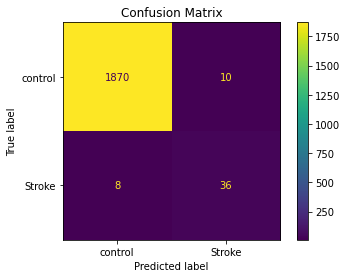

In [25]:
#使用CNN算法进行欠采样
from imblearn.under_sampling import CondensedNearestNeighbour
CNN=CondensedNearestNeighbour(sampling_strategy='not minority',random_state=2024,n_jobs=-1)
ForestCNN=RandomForestClassifier(random_state=2024)
ForestCNN_PR,accuracyCNN,ForestCNN_ROC,roc_auc_CNN,Forestcnn=RunTrainModelCV(Resmaple=CNN,Model=ForestCNN,Data=MLTestData,Label=MLTestLabel,cv=10)

In [26]:
#输出PR和ROC曲线数据
ForestCNN_PR.to_excel('Data/PR Curve/Resample/ForestCNN_PR.xlsx')
ForestCNN_ROC.to_excel('Data/ROC Curve/Resample/ForestCNN_ROC.xlsx')

resample shape: Counter({0: 2265, 1: 103})
Model train Precision of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train Recall of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train F1 Score of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train Accuracy of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
模型训练集Precision:1.0,Recall:1.0,F1_Score:1.0,Accuracy:1.0
Model valid Precision of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model valid train Recall of flod: [0.3333333333333333, 0.7142857142857143, 0.45454545454545453, 0.8333333333333334, 0.5, 0.375, 0.5384615384615384, 0.7142857142857143, 0.38461538461538464, 0.6363636363636364]
Model valid train F1 Score of flod: [0.5, 0.8333333333333333, 0.625, 0.9090909090909091, 0.6666666666666666, 0.5454545454545454, 0.7000000000000001, 0.8333333333333333, 0.5555555555555556, 0.7777777777777778]
Model valid train Accuracy of flod: [0.9831223628691983, 0.9915611814345991, 0

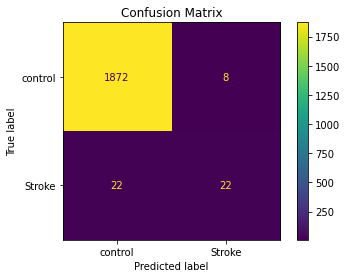

In [27]:
#使用IHT算法进行欠采样
from imblearn.under_sampling import InstanceHardnessThreshold
IHT=InstanceHardnessThreshold(random_state=2024,cv=5,n_jobs=-1)
ForestIHT=RandomForestClassifier(random_state=2024)
ForestIHT_PR,accuracyIHT,ForestIHT_ROC,roc_auc_IHT,ForestIHT=RunTrainModelCV(Resmaple=IHT,Model=ForestIHT,Data=MLTestData,Label=MLTestLabel,cv=10)

In [28]:
#计算PR和ROC曲线
ForestIHT_PR.to_excel('Data/PR Curve/Resample/ForestIHT_PR.xlsx')
ForestIHT_ROC.to_excel('Data/ROC Curve/Resample/ForestIHT_ROC.xlsx')

resample shape: Counter({0: 103, 1: 103})
Model train Precision of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train Recall of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train F1 Score of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train Accuracy of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
模型训练集Precision:1.0,Recall:1.0,F1_Score:1.0,Accuracy:1.0
Model valid Precision of flod: [1.0, 1.0, 1.0, 0.9285714285714286, 1.0, 0.9, 1.0, 1.0, 1.0, 1.0]
Model valid train Recall of flod: [0.8888888888888888, 1.0, 0.9333333333333333, 0.9285714285714286, 0.75, 1.0, 1.0, 1.0, 1.0, 1.0]
Model valid train F1 Score of flod: [0.9411764705882353, 1.0, 0.9655172413793104, 0.9285714285714286, 0.8571428571428571, 0.9473684210526316, 1.0, 1.0, 1.0, 1.0]
Model valid train Accuracy of flod: [0.9523809523809523, 1.0, 0.9523809523809523, 0.9047619047619048, 0.9047619047619048, 0.9523809523809523, 1.0, 1.0, 1.0, 1.0]
模型Valid集Precision:0.9828571

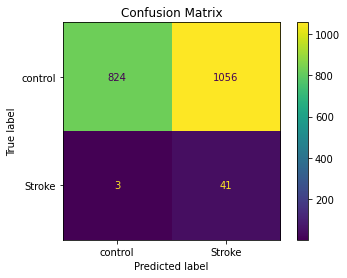

In [29]:
#使用NearMiss进行欠采样
from imblearn.under_sampling import NearMiss
NM=NearMiss(sampling_strategy='not minority',n_jobs=-1)
ForestNM=RandomForestClassifier(random_state=2024)
ForestNM_PR,accuracyNM,ForestNM_ROC,roc_auc_NM,ForestNM=RunTrainModelCV(Resmaple=NM,Model=ForestNM,Data=MLTestData,Label=MLTestLabel,cv=10)

In [30]:
#计算PR和ROC曲线
ForestNM_PR.to_excel('Data/PR Curve/Resample/ForestNM_PR.xlsx')
ForestNM_ROC.to_excel('Data/ROC Curve/Resample/ForestNM_ROC.xlsx')

resample shape: Counter({0: 4325, 1: 103})
Model train Precision of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train Recall of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train F1 Score of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train Accuracy of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
模型训练集Precision:1.0,Recall:1.0,F1_Score:1.0,Accuracy:1.0
Model valid Precision of flod: [0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0]
Model valid train Recall of flod: [0.0, 0.16666666666666666, 0.0, 0.0, 0.2222222222222222, 0.0, 0.0625, 0.09090909090909091, 0.0, 0.0]
Model valid train F1 Score of flod: [0.0, 0.2857142857142857, 0.0, 0.0, 0.3636363636363636, 0.0, 0.11764705882352941, 0.16666666666666669, 0.0, 0.0]
Model valid train Accuracy of flod: [0.9729119638826185, 0.9887133182844243, 0.9661399548532731, 0.981941309255079, 0.9841986455981941, 0.9796839729119639, 0.9661399548532731, 0.9774266365688488, 0.97963800904977

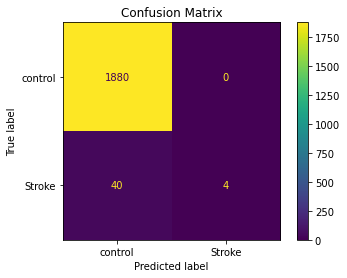

In [31]:
#使用NeighbourhoodCleaningRule进行欠采样
from imblearn.under_sampling import NeighbourhoodCleaningRule
NBC=NeighbourhoodCleaningRule(sampling_strategy='not minority',n_jobs=-1)
ForestNBC=RandomForestClassifier(random_state=2024)
ForestNBC_PR,accuracyNBC,ForestNBC_ROC,roc_auc_NBC,ForestNBC=RunTrainModelCV(Resmaple=NBC,Model=ForestNBC,Data=MLTestData,Label=MLTestLabel,cv=10)

In [32]:
#计算PR和ROC曲线
ForestNBC_PR.to_excel('Data/PR Curve/Resample/ForestNBC_PR.xlsx')
ForestNBC_ROC.to_excel('Data/ROC Curve/Resample/ForestNBC_ROC.xlsx')

resample shape: Counter({0: 4345, 1: 103})
Model train Precision of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train Recall of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train F1 Score of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train Accuracy of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
模型训练集Precision:1.0,Recall:1.0,F1_Score:1.0,Accuracy:1.0
Model valid Precision of flod: [0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Model valid train Recall of flod: [0.0, 0.25, 0.13333333333333333, 0.15384615384615385, 0.15384615384615385, 0.0, 0.0, 0.0, 0.0, 0.0]
Model valid train F1 Score of flod: [0.0, 0.4, 0.23529411764705882, 0.2666666666666667, 0.2666666666666667, 0.0, 0.0, 0.0, 0.0, 0.0]
Model valid train Accuracy of flod: [0.9752808988764045, 0.9865168539325843, 0.9707865168539326, 0.9752808988764045, 0.9752808988764045, 0.9887640449438202, 0.9775280898876404, 0.9730337078651685, 0.9864864864864865, 0.9774774774

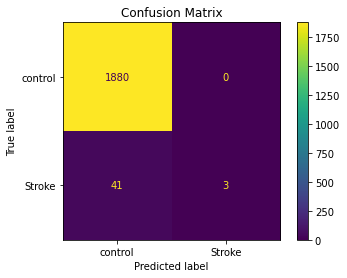

In [33]:
#使用OneSidedSelection进行欠采样
from imblearn.under_sampling import OneSidedSelection
OSS=OneSidedSelection(sampling_strategy='not minority',random_state=2024,n_jobs=-1)
ForestOSS=RandomForestClassifier(random_state=2024)
ForestOSS_PR,accuracyOSS,ForestOSS_ROC,roc_auc_OSS,ForestOSS=RunTrainModelCV(Resmaple=OSS,Model=ForestOSS,Data=MLTestData,Label=MLTestLabel,cv=10)

In [34]:
#计算PR和ROC曲线
ForestOSS_PR.to_excel('Data/PR Curve/Resample/ForestOSS_PR.xlsx')
ForestOSS_ROC.to_excel('Data/ROC Curve/Resample/ForestOSS_ROC.xlsx')

resample shape: Counter({0: 103, 1: 103})
Model train Precision of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train Recall of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train F1 Score of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train Accuracy of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
模型训练集Precision:1.0,Recall:1.0,F1_Score:1.0,Accuracy:1.0
Model valid Precision of flod: [0.9, 0.8181818181818182, 1.0, 1.0, 0.8, 1.0, 1.0, 0.9, 1.0, 1.0]
Model valid train Recall of flod: [1.0, 0.9, 0.9333333333333333, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.8888888888888888]
Model valid train F1 Score of flod: [0.9473684210526316, 0.8571428571428572, 0.9655172413793104, 1.0, 0.888888888888889, 1.0, 1.0, 0.9473684210526316, 1.0, 0.9411764705882353]
Model valid train Accuracy of flod: [0.9523809523809523, 0.8571428571428571, 0.9523809523809523, 1.0, 0.9047619047619048, 1.0, 1.0, 0.95, 1.0, 0.95]
模型Valid集Precision:0.9418181818181818,Recal

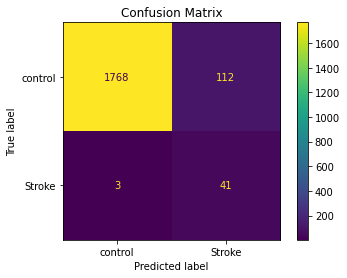

In [35]:
#使用随机欠采样进行数据欠采样
from imblearn.under_sampling import RandomUnderSampler
RUS=RandomUnderSampler(sampling_strategy='not minority',random_state=2024)
ForestRUS=RandomForestClassifier(random_state=2024)
ForestRUS_PR,accuracyRUS,ForestRUS_ROC,roc_auc_RUS,ForestRUS=RunTrainModelCV(Resmaple=RUS,Model=ForestRUS,Data=MLTestData,Label=MLTestLabel,cv=10)

In [36]:
#计算PR和ROC曲线
ForestRUS_PR.to_excel('Data/PR Curve/Resample/ForestRUS_PR.xlsx')
ForestRUS_ROC.to_excel('Data/ROC Curve/Resample/ForestRUS_ROC.xlsx')

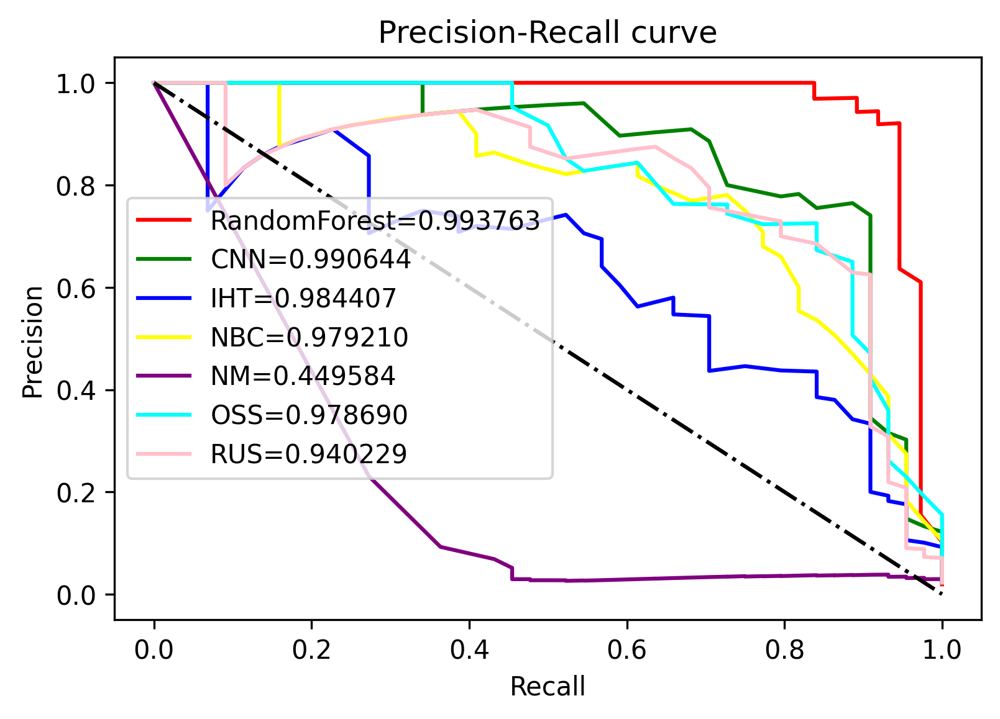

In [37]:
#绘制PR曲线
import matplotlib.pyplot as plt
PR_curve=plt.figure(dpi=300)
PR_ax=PR_curve.add_subplot(111)
PR_ax.set_title('Precision-Recall curve')
PR_ax.plot(Forest_PR['recall'], Forest_PR['precision'],color='red',label='RandomForest=%f'%Forest_Accuracy)
PR_ax.plot(ForestCNN_PR['recall'], ForestCNN_PR['precision'],color='green',label='CNN=%f'%accuracyCNN)
PR_ax.plot(ForestIHT_PR['recall'], ForestIHT_PR['precision'],color='blue',label='IHT=%f'%accuracyIHT)
PR_ax.plot(ForestNBC_PR['recall'], ForestNBC_PR['precision'],color='yellow',label='NBC=%f'%accuracyNBC)
PR_ax.plot(ForestNM_PR['recall'], ForestNM_PR['precision'],color='purple',label='NM=%f'%accuracyNM)
PR_ax.plot(ForestOSS_PR['recall'], ForestOSS_PR['precision'],color='cyan',label='OSS=%f'%accuracyOSS)
PR_ax.plot(ForestRUS_PR['recall'],ForestRUS_PR['precision'],color='pink',label='RUS=%f'%accuracyRUS)
PR_ax.plot([0,1],[1,0],linestyle='-.',color='black')
PR_ax.set_xlabel('Recall')  
PR_ax.set_ylabel('Precision')    
plt.legend(loc="best")  
plt.show()

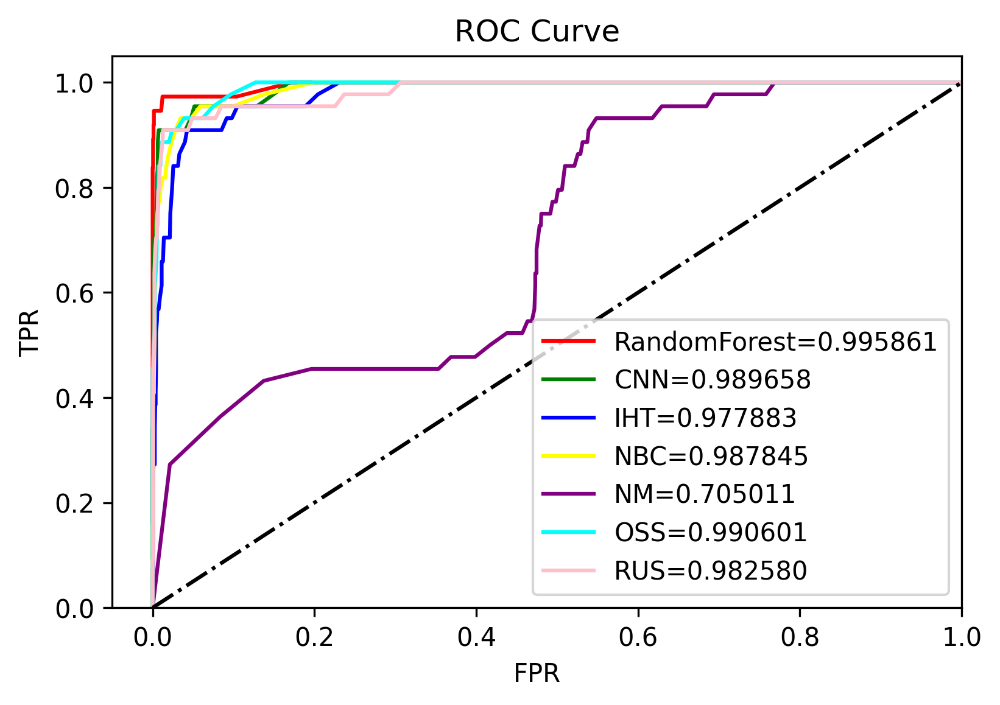

In [38]:
#绘制ROC曲线
import matplotlib.pyplot as plt
ROC_curve=plt.figure(dpi=300)
ROC_ax=ROC_curve.add_subplot(111)
ROC_ax.set_title('ROC Curve')
ROC_ax.plot(Forest_ROC['fpr'], Forest_ROC['tpr'],color='red',label='RandomForest=%f'%Forest_ROC_AUC)
ROC_ax.plot(ForestCNN_ROC['fpr'], ForestCNN_ROC['tpr'],color='green',label='CNN=%f'%roc_auc_CNN)
ROC_ax.plot(ForestIHT_ROC['fpr'], ForestIHT_ROC['tpr'],color='blue',label='IHT=%f'%roc_auc_IHT)
ROC_ax.plot(ForestNBC_ROC['fpr'], ForestNBC_ROC['tpr'],color='yellow',label='NBC=%f'%roc_auc_NBC)
ROC_ax.plot(ForestNM_ROC['fpr'], ForestNM_ROC['tpr'],color='purple',label='NM=%f'%roc_auc_NM)
ROC_ax.plot(ForestOSS_ROC['fpr'], ForestOSS_ROC['tpr'],color='cyan',label='OSS=%f'%roc_auc_OSS)
ROC_ax.plot(ForestRUS_ROC['fpr'],ForestRUS_ROC['tpr'],color='pink',label='RUS=%f'%roc_auc_RUS)
ROC_ax.plot([0,1],[0,1],linestyle='-.',color='black')
ROC_ax.set_xlim([-0.05, 1.0])  
ROC_ax.set_ylim([0, 1.05])  
ROC_ax.set_xlabel('FPR')  
ROC_ax.set_ylabel('TPR')    
plt.legend(loc="best")  
plt.show()

In [39]:
import joblib
Model=[Forest,ForestCNN,ForestIHT,ForestNM,ForestNBC,ForestOSS,ForestRUS]
ModelStr=['Forest.pkl','ForestCNN.pkl','ForestIHT.pkl','ForestNM.pkl','ForestNBC.pkl','ForestOSS.pkl','ForestRUS.pkl']
try:
    for model,modelstr in zip(Model,ModelStr):
        joblib.dump(model,'ML Models/Resample/'+modelstr)
    print('模型保存成功！')
except:
    print('模型保存异常！！！')

模型保存成功！


选择CNN作为数据重采样算法

In [40]:
ReData=MLData.iloc[:,:-1]    #提取数据集
ReLabel=MLData.iloc[:,-1]    #提取数据标签
print(ReData.shape)
print(ReLabel.shape) 

(6413, 72)
(6413,)


预处理数据：数据缩放、描述性统计学

In [41]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler
ReMLData_name=ReData.columns
MLStand=StandardScaler()    #数据标准化
StandData=MLStand.fit_transform(ReData)
MinMaxData=MinMaxScaler(feature_range=(0,1))    #数据缩放
MinMaxdata=MinMaxData.fit_transform(StandData)
MLRunData=pd.DataFrame(MinMaxdata)
MLRunData.columns=ReMLData_name
MLRunData.head(10)

,cg03706273,cg00412368,cg01370179,cg01522249,cg01999212,cg03718079,cg03977822,cg05100261,cg05876899,cg06104510,...,cg00941229,cg00958409,cg00962755,cg01077609,cg01101221,cg01446576,cg01550055,cg01717973,age,gender_encode
0,0.366703,0.699228,0.627539,0.339860,0.725793,0.719028,0.610471,0.692839,0.495571,0.842822,...,0.725793,0.715924,0.372852,0.399866,0.645909,0.720955,0.598192,0.541884,0.684211,0.0
1,0.463465,0.592648,0.638988,0.312063,0.502166,0.564485,0.531935,0.435958,0.520210,0.606743,...,0.583368,0.699491,0.360245,0.375090,0.543283,0.593423,0.671892,0.468489,0.456140,1.0
2,0.419803,0.546794,0.629799,0.435326,0.553452,0.589086,0.544620,0.353111,0.507977,0.627347,...,0.522001,0.742118,0.410469,0.375090,0.603949,0.560104,0.608857,0.346457,0.807018,1.0
3,0.316703,0.674653,0.606416,0.256460,0.675869,0.637623,0.701250,0.730939,0.531910,0.750907,...,0.566385,0.722588,0.310634,0.399866,0.567367,0.502166,0.560468,0.442870,0.763158,0.0
4,0.345865,0.506133,0.618676,0.441581,0.619161,0.521338,0.609608,0.410436,0.520210,0.644800,...,0.583368,0.740716,0.404357,0.349814,0.549814,0.538830,0.567359,0.459086,0.763158,1.0
5,0.435973,0.561169,0.624070,0.419851,0.703336,0.519129,0.620814,0.421574,0.527038,0.624162,...,0.477988,0.757873,0.433043,0.382025,0.543283,0.553452,0.670629,0.448602,0.359649,1.0
6,0.402192,0.691920,0.663395,0.306385,0.693490,0.621787,0.672487,0.760064,0.511868,0.839015,...,0.553452,0.705214,0.350654,0.295393,0.481720,0.502166,0.666816,0.472852,0.684211,0.0
7,0.371111,0.542279,0.628108,0.312063,0.522001,0.462208,0.563362,0.364092,0.524701,0.624162,...,0.619161,0.701428,0.465032,0.359144,0.582520,0.530733,0.655144,0.453995,0.701754,1.0
8,0.441267,0.564934,0.635818,0.479486,0.583368,0.582309,0.575699,0.307450,0.518048,0.590573,...,0.615253,0.712455,0.357063,0.388415,0.595861,0.538830,0.691576,0.430188,0.605263,1.0
9,0.470881,0.569757,0.641060,0.471262,0.598135,0.584618,0.625118,0.307450,0.545459,0.560855,...,0.649430,0.724201,0.348719,0.382025,0.561819,0.602660,0.731723,0.468489,0.657895,1.0


使用CNN算法进行预处理

In [42]:
from imblearn.under_sampling import CondensedNearestNeighbour
CNNML=CondensedNearestNeighbour(sampling_strategy='not minority',random_state=2024,n_jobs=-1)

resample shape: Counter({0: 180, 1: 103})
Model train Precision of flod: [0.9365079365079365, 0.8970588235294118, 0.9130434782608695, 0.9130434782608695, 0.921875, 0.9333333333333333, 0.9508196721311475, 0.9230769230769231, 0.9344262295081968, 0.9142857142857143]
Model train Recall of flod: [0.6344086021505376, 0.6421052631578947, 0.6702127659574468, 0.6702127659574468, 0.6413043478260869, 0.6086956521739131, 0.6304347826086957, 0.6521739130434783, 0.6263736263736264, 0.6956521739130435]
Model train F1 Score of flod: [0.7564102564102564, 0.7484662576687117, 0.7730061349693251, 0.7730061349693251, 0.7564102564102563, 0.7368421052631579, 0.758169934640523, 0.7643312101910829, 0.7500000000000001, 0.7901234567901234]
Model train Accuracy of flod: [0.8503937007874016, 0.8385826771653543, 0.8543307086614174, 0.8549019607843137, 0.8509803921568627, 0.8431372549019608, 0.8549019607843137, 0.8549019607843137, 0.8509803921568627, 0.8666666666666667]
模型训练集Precision:0.9237470588894403,Recall:0.647

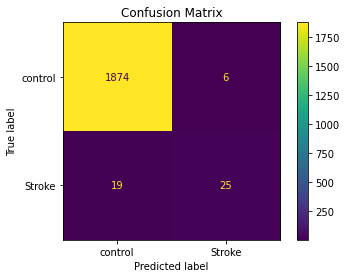

In [43]:
#测试Logistic回归
from sklearn.linear_model import LogisticRegression
Logistic=LogisticRegression(penalty="l2",dual=True,tol=1e-4,C=1.0,fit_intercept=True,random_state=2024,solver='liblinear',
                            max_iter=100,multi_class="auto",verbose=0, warm_start=False,n_jobs=-1,l1_ratio=None)
Logistic_PR,Logistic_Accuracy,Logistic_ROC,Logistic_AUC,Logistic_ML=RunTrainModelCV(Resmaple=CNNML,Model=Logistic,Data=MLRunData,Label=ReLabel,cv=10)

In [44]:
#输出PR曲线和ROC曲线结果
Logistic_PR.to_excel('Data/PR Curve/ML/Logistic_PR.xlsx','UTF-8')
Logistic_ROC.to_excel('Data/ROC Curve/ML/Logistic_ROC.xlsx','UTF-8')

resample shape: Counter({0: 180, 1: 103})
Model train Precision of flod: [0.9473684210526315, 0.9487179487179487, 0.9285714285714286, 0.9302325581395349, 0.927710843373494, 0.935064935064935, 0.9466666666666667, 0.9397590361445783, 0.9333333333333333, 0.9156626506024096]
Model train Recall of flod: [0.7741935483870968, 0.7789473684210526, 0.8297872340425532, 0.851063829787234, 0.8369565217391305, 0.782608695652174, 0.7717391304347826, 0.8478260869565217, 0.7692307692307693, 0.8260869565217391]
Model train F1 Score of flod: [0.8520710059171597, 0.8554913294797688, 0.8764044943820225, 0.888888888888889, 0.8800000000000001, 0.8520710059171598, 0.8502994011976047, 0.8914285714285715, 0.8433734939759036, 0.8685714285714285]
Model train Accuracy of flod: [0.9015748031496063, 0.9015748031496063, 0.9133858267716536, 0.9215686274509803, 0.9176470588235294, 0.9019607843137255, 0.9019607843137255, 0.9254901960784314, 0.8980392156862745, 0.9098039215686274]
模型训练集Precision:0.9353087821666962,Recall

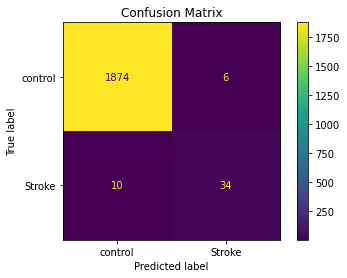

In [45]:
#测试SVM算法
from sklearn.svm import SVC
SVM_Classifier=SVC(C=1.0,kernel="rbf",degree=3,gamma="scale",coef0=0.0,shrinking=True,probability=True,tol=1e-3, 
                   cache_size=200,max_iter=-1, decision_function_shape="ovr",random_state=2024)
SVM_PR,SVM_Accuracy,SVM_ROC,SVM_AUC,SVM_ML=RunTrainModelCV(Resmaple=CNNML,Model=SVM_Classifier,Data=MLRunData,Label=ReLabel,cv=10)

In [46]:
#输出PR曲线和ROC曲线结果
SVM_PR.to_excel('Data/PR Curve/ML/SVM_PR.xlsx','UTF-8')
SVM_ROC.to_excel('Data/ROC Curve/ML/SVM_ROC.xlsx','UTF-8')

resample shape: Counter({0: 180, 1: 103})
Model train Precision of flod: [0.989010989010989, 0.92, 0.9891304347826086, 0.9893617021276596, 0.9578947368421052, 0.9479166666666666, 0.9278350515463918, 0.989247311827957, 0.9574468085106383, 0.9574468085106383]
Model train Recall of flod: [0.967741935483871, 0.968421052631579, 0.9680851063829787, 0.9893617021276596, 0.9891304347826086, 0.9891304347826086, 0.9782608695652174, 1.0, 0.989010989010989, 0.9782608695652174]
Model train F1 Score of flod: [0.9782608695652174, 0.9435897435897437, 0.9784946236559139, 0.9893617021276596, 0.9732620320855614, 0.9680851063829786, 0.9523809523809524, 0.9945945945945946, 0.972972972972973, 0.967741935483871]
Model train Accuracy of flod: [0.984251968503937, 0.9566929133858267, 0.984251968503937, 0.9921568627450981, 0.9803921568627451, 0.9764705882352941, 0.9647058823529412, 0.996078431372549, 0.9803921568627451, 0.9764705882352941]
模型训练集Precision:0.9625290509825655,Recall:0.9817403394332729,F1_Score:0.971

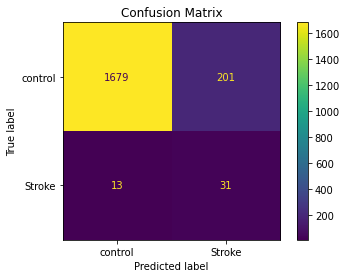

In [47]:
#测试决策树算法
import numpy as np
from sklearn.tree import DecisionTreeClassifier
DecisionTree=DecisionTreeClassifier(criterion='entropy',splitter='best',max_depth=7,min_samples_split=6,random_state=2024)
DTC_PR,DTC_Accuracy,DTC_ROC,DTC_AUC,DTC_ML=RunTrainModelCV(Resmaple=CNNML,Model=DecisionTree,Data=MLRunData,Label=ReLabel,cv=10)

In [48]:
#输出PR曲线和ROC曲线结果
DTC_PR.to_excel('Data/PR Curve/ML/DTC_PR.xlsx','UTF-8')
DTC_ROC.to_excel('Data/ROC Curve/ML/DTC_ROC.xlsx','UTF-8')

resample shape: Counter({0: 180, 1: 103})
Model train Precision of flod: [0.9887640449438202, 1.0, 0.9886363636363636, 1.0, 0.9886363636363636, 1.0, 1.0, 0.967032967032967, 1.0, 0.9882352941176471]
Model train Recall of flod: [0.946236559139785, 0.9368421052631579, 0.925531914893617, 0.9787234042553191, 0.9456521739130435, 0.967391304347826, 0.9347826086956522, 0.9565217391304348, 0.9560439560439561, 0.9130434782608695]
Model train F1 Score of flod: [0.967032967032967, 0.967391304347826, 0.9560439560439561, 0.989247311827957, 0.9666666666666666, 0.9834254143646408, 0.9662921348314606, 0.9617486338797815, 0.9775280898876404, 0.9491525423728814]
Model train Accuracy of flod: [0.9763779527559056, 0.9763779527559056, 0.968503937007874, 0.9921568627450981, 0.9764705882352941, 0.9882352941176471, 0.9764705882352941, 0.9725490196078431, 0.984313725490196, 0.9647058823529412]
模型训练集Precision:0.9921305033367162,Recall:0.9460769243943661,F1_Score:0.9684529021255777,Accuracy:0.9776161803304
Model 

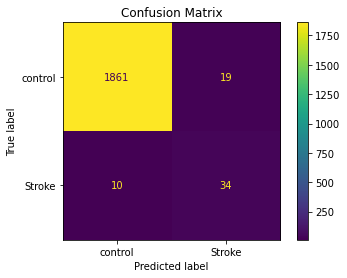

In [49]:
#对随机森林进行网格搜索
from sklearn.ensemble import RandomForestClassifier
RandomForest=RandomForestClassifier(n_estimators=27,criterion='entropy',max_depth=7,min_samples_split=6,
                                    bootstrap=True,min_samples_leaf=9,max_features='sqrt',random_state=2024)
RondomForest_PR,RondomForest_Accuracy,RondomForest_ROC,RondomForest_AUC,Forest_ML=RunTrainModelCV(Resmaple=CNNML,Model=RandomForest,Data=MLRunData,Label=ReLabel,cv=10)

In [50]:
#输出PR曲线和ROC曲线结果
RondomForest_PR.to_excel('Data/PR Curve/ML/RondomForest_PR.xlsx','UTF-8')
RondomForest_ROC.to_excel('Data/ROC Curve/ML/RondomForest_ROC.xlsx','UTF-8')

resample shape: Counter({0: 180, 1: 103})
Model train Precision of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train Recall of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train F1 Score of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Model train Accuracy of flod: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
模型训练集Precision:1.0,Recall:1.0,F1_Score:1.0,Accuracy:1.0
Model valid Precision of flod: [0.8571428571428571, 0.7, 0.75, 0.8, 0.9, 1.0, 1.0, 0.6923076923076923, 0.8888888888888888, 0.8]
Model valid train Recall of flod: [0.6, 0.875, 1.0, 0.8888888888888888, 0.8181818181818182, 0.7272727272727273, 0.7272727272727273, 0.8181818181818182, 0.6666666666666666, 0.7272727272727273]
Model valid train F1 Score of flod: [0.7058823529411764, 0.7777777777777777, 0.8571428571428571, 0.8421052631578948, 0.8571428571428572, 0.8421052631578948, 0.8421052631578948, 0.7500000000000001, 0.761904761904762, 0.761904761904762]
Model valid train Accura

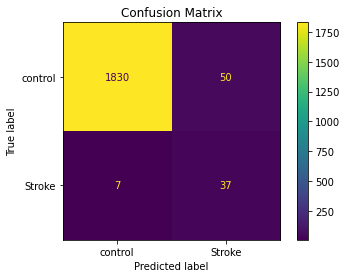

In [51]:
#测试XGBoost模型
from xgboost import XGBClassifier
XGBoost=XGBClassifier(n_jobs=-1,verbosity=1,tree_method='auto',gpu_id=0,random_state=2024)
XGBoost_PR,XGBoost_Accuracy,XGBoost_ROC,XGBoost_AUC,XGBoost_ML=RunTrainModelCV(Resmaple=CNNML,Model=XGBoost,Data=MLRunData,Label=ReLabel,cv=10)

In [52]:
#输出PR曲线和ROC曲线结果
XGBoost_PR.to_excel('Data/PR Curve/ML/XGBoost_PR.xlsx','UTF-8')
XGBoost_ROC.to_excel('Data/ROC Curve/ML/XGBoost_ROC.xlsx','UTF-8')

resample shape: Counter({0: 180, 1: 103})
[LightGBM] [Warning] Unknown parameter: keep_training_booster
[LightGBM] [Warning] Unknown parameter: keep_training_booster
[LightGBM] [Info] Number of positive: 93, number of negative: 161
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4256
[LightGBM] [Info] Number of data points in the train set: 254, number of used features: 72
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.366142 -> initscore=-0.548805
[LightGBM] [Info] Start training from score -0.548805
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

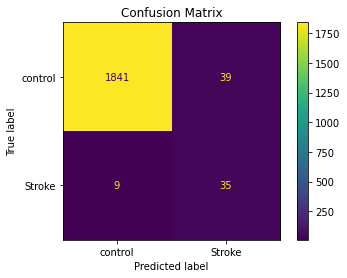

[LightGBM] [Warning] Unknown parameter: keep_training_booster
[LightGBM] [Warning] Unknown parameter: keep_training_booster
[LightGBM] [Warning] Unknown parameter: keep_training_booster


In [53]:
#测试LightGBM算法
from lightgbm import LGBMClassifier
LightGBM=LGBMClassifier(boosting_type='gbdt',num_leaves=31,learning_rate=0.01,n_estimators=200,
                        n_jobs=-1,objective='binary',metric='binary_logloss',keep_training_booster=True,
                       importance_type='gini',random_state=2024)
LightGBM_PR,LightGBM_Accuracy,LightGBM_ROC,LightGBM_AUC,LightGBM_ML=RunTrainModelCV(Resmaple=CNNML,Model=LightGBM,Data=MLRunData,Label=ReLabel,cv=10)

In [54]:
#输出PR曲线和ROC曲线结果
LightGBM_PR.to_excel('Data/PR Curve/ML/LightGBM_PR.xlsx','UTF-8')
LightGBM_ROC.to_excel('Data/ROC Curve/ML/LightGBM_ROC.xlsx','UTF-8')

resample shape: Counter({0: 180, 1: 103})
0:	learn: 0.6890172	total: 49.9ms	remaining: 24.9s
1:	learn: 0.6821106	total: 52.3ms	remaining: 13s
2:	learn: 0.6753477	total: 54.7ms	remaining: 9.06s
3:	learn: 0.6707910	total: 57.1ms	remaining: 7.08s
4:	learn: 0.6652468	total: 59.3ms	remaining: 5.87s
5:	learn: 0.6592446	total: 61.6ms	remaining: 5.07s
6:	learn: 0.6543080	total: 64.1ms	remaining: 4.52s
7:	learn: 0.6488765	total: 66.5ms	remaining: 4.09s
8:	learn: 0.6434927	total: 68.8ms	remaining: 3.75s
9:	learn: 0.6392815	total: 71ms	remaining: 3.48s
10:	learn: 0.6325844	total: 73.2ms	remaining: 3.25s
11:	learn: 0.6274175	total: 75.4ms	remaining: 3.07s
12:	learn: 0.6247561	total: 78.5ms	remaining: 2.94s
13:	learn: 0.6193241	total: 80.9ms	remaining: 2.81s
14:	learn: 0.6149203	total: 83.2ms	remaining: 2.69s
15:	learn: 0.6097759	total: 85.3ms	remaining: 2.58s
16:	learn: 0.6057541	total: 87.5ms	remaining: 2.49s
17:	learn: 0.5991016	total: 89.7ms	remaining: 2.4s
18:	learn: 0.5946312	total: 91.8ms	re

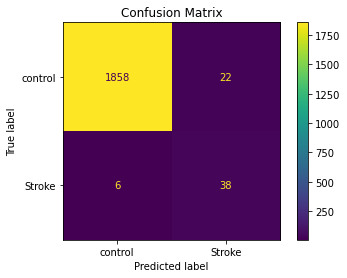

In [55]:
#测试CatBoost算法
from catboost import CatBoostClassifier
CatBoost=CatBoostClassifier(learning_rate=0.01,depth=6,iterations=500,thread_count=-1)
CatBoost_PR,CatBoost_Accuracy,CatBoost_ROC,CatBoost_AUC,CatBoost_ML=RunTrainModelCV(Resmaple=CNNML,Model=CatBoost,Data=MLRunData,Label=ReLabel,cv=10)

In [56]:
#输出PR曲线和ROC曲线结果
CatBoost_PR.to_excel('Data/PR Curve/ML/CatBoost_PR.xlsx','UTF-8')
CatBoost_ROC.to_excel('Data/ROC Curve/ML/CatBoost_ROC.xlsx','UTF-8')

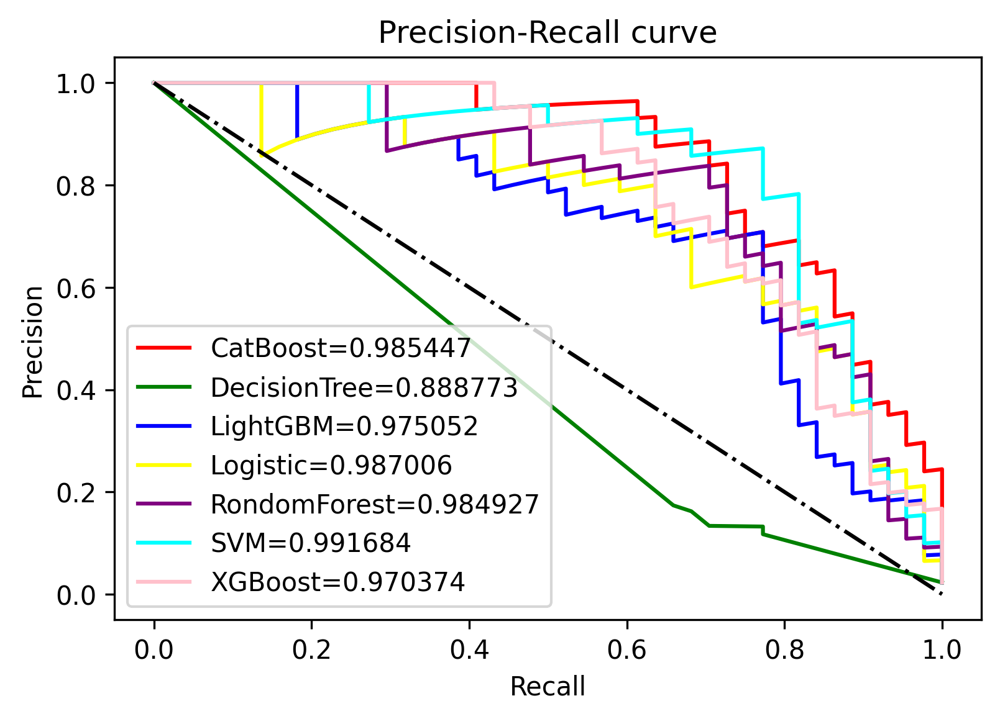

In [57]:
#绘制PR曲线
import matplotlib.pyplot as plt
PR_curve=plt.figure(dpi=300)
PR_ax=PR_curve.add_subplot(111)
PR_ax.set_title('Precision-Recall curve')
PR_ax.plot(CatBoost_PR['recall'], CatBoost_PR['precision'],color='red',label='CatBoost=%f'%CatBoost_Accuracy)
PR_ax.plot(DTC_PR['recall'], DTC_PR['precision'],color='green',label='DecisionTree=%f'%DTC_Accuracy)
PR_ax.plot(LightGBM_PR['recall'], LightGBM_PR['precision'],color='blue',label='LightGBM=%f'%LightGBM_Accuracy)
PR_ax.plot(Logistic_PR['recall'], Logistic_PR['precision'],color='yellow',label='Logistic=%f'%Logistic_Accuracy)
PR_ax.plot(RondomForest_PR['recall'], RondomForest_PR['precision'],color='purple',label='RondomForest=%f'%RondomForest_Accuracy)
PR_ax.plot(SVM_PR['recall'], SVM_PR['precision'],color='cyan',label='SVM=%f'%SVM_Accuracy)
PR_ax.plot(XGBoost_PR['recall'], XGBoost_PR['precision'],color='pink',label='XGBoost=%f'%XGBoost_Accuracy)
PR_ax.plot([0,1],[1,0],linestyle='-.',color='black')
PR_ax.set_xlabel('Recall')  
PR_ax.set_ylabel('Precision')    
plt.legend(loc="best")  
plt.show()

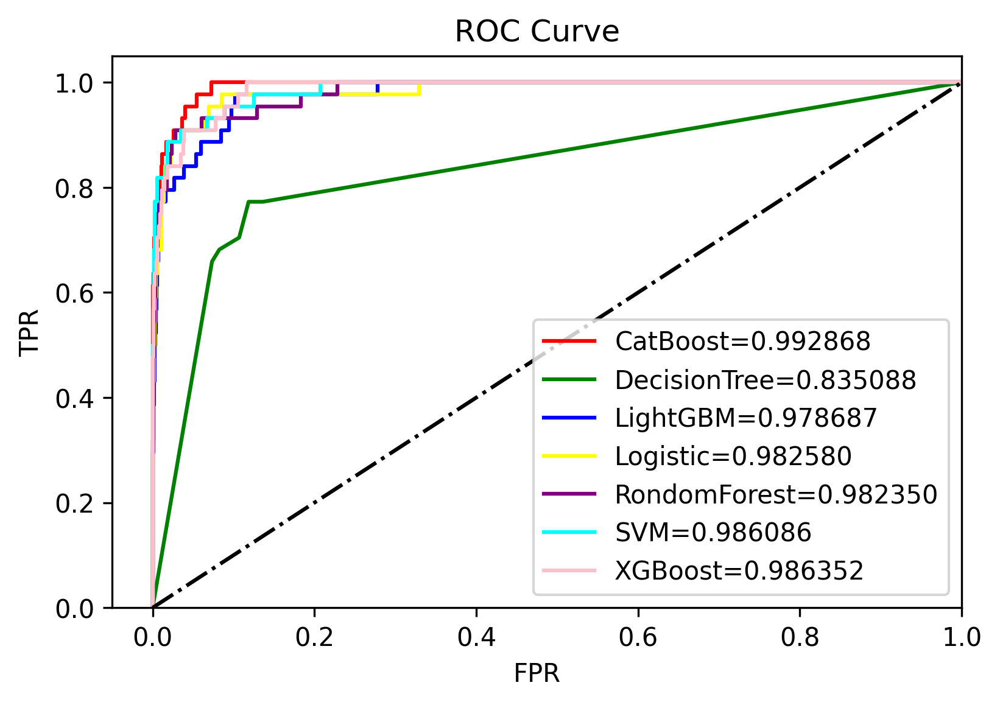

In [58]:
#绘制ROC曲线
import matplotlib.pyplot as plt
ROC_curve=plt.figure(dpi=300)
ROC_ax=ROC_curve.add_subplot(111)
ROC_ax.set_title('ROC Curve')
ROC_ax.plot(CatBoost_ROC['fpr'], CatBoost_ROC['tpr'],color='red',label='CatBoost=%f'%CatBoost_AUC)
ROC_ax.plot(DTC_ROC['fpr'], DTC_ROC['tpr'],color='green',label='DecisionTree=%f'%DTC_AUC)
ROC_ax.plot(LightGBM_ROC['fpr'], LightGBM_ROC['tpr'],color='blue',label='LightGBM=%f'%LightGBM_AUC)
ROC_ax.plot(Logistic_ROC['fpr'], Logistic_ROC['tpr'],color='yellow',label='Logistic=%f'%Logistic_AUC)
ROC_ax.plot(RondomForest_ROC['fpr'], RondomForest_ROC['tpr'],color='purple',label='RondomForest=%f'%RondomForest_AUC)
ROC_ax.plot(SVM_ROC['fpr'], SVM_ROC['tpr'],color='cyan',label='SVM=%f'%SVM_AUC)
ROC_ax.plot(XGBoost_ROC['fpr'], XGBoost_ROC['tpr'],color='pink',label='XGBoost=%f'%XGBoost_AUC)
ROC_ax.plot([0,1],[0,1],linestyle='-.',color='black')
ROC_ax.set_xlim([-0.05, 1.0])  
ROC_ax.set_ylim([0, 1.05])  
ROC_ax.set_xlabel('FPR')  
ROC_ax.set_ylabel('TPR')    
plt.legend(loc="best")  
plt.show()

In [59]:
#保存模型-输入[batchs,70],输出[batch,1]
MLModel=[Logistic_ML,SVM_ML,DTC_ML,Forest_ML,XGBoost_ML,LightGBM_ML,CatBoost_ML]
MLModelStr=['Logistic.pkl','SVM.pkl','DecisionTree.pkl','Forest.pkl','XGBoost.pkl','LightGBM.pkl','CatBoost.pkl']
try:
    for model,modelstr in zip(MLModel,MLModelStr):
        joblib.dump(model,'ML Models/Trainer/'+modelstr)
    print('模型保存成功！')
except:
    print('模型保存异常！！！')

模型保存成功！


载入SHAP库计算特征重要性

In [126]:
#使用PCA算法计算95%可解释方差比维度数
from sklearn.decomposition import PCA
PCA=PCA(n_components=0.95)
Methylation_99=PCA.fit_transform(MLRunData)    #数据降维
Methylation_99.shape

(6413, 33)

使用SHAP库计算获得CatBoost模型特征重要性

In [127]:
#复现CatBoost模型训练额测试数据集
CatBoost_train,CatBoost_test,CatBoost_trainlabel,CatBoost_testlabel=train_test_split(MLRunData,ReLabel,stratify=ReLabel,train_size=0.7,random_state=2024)

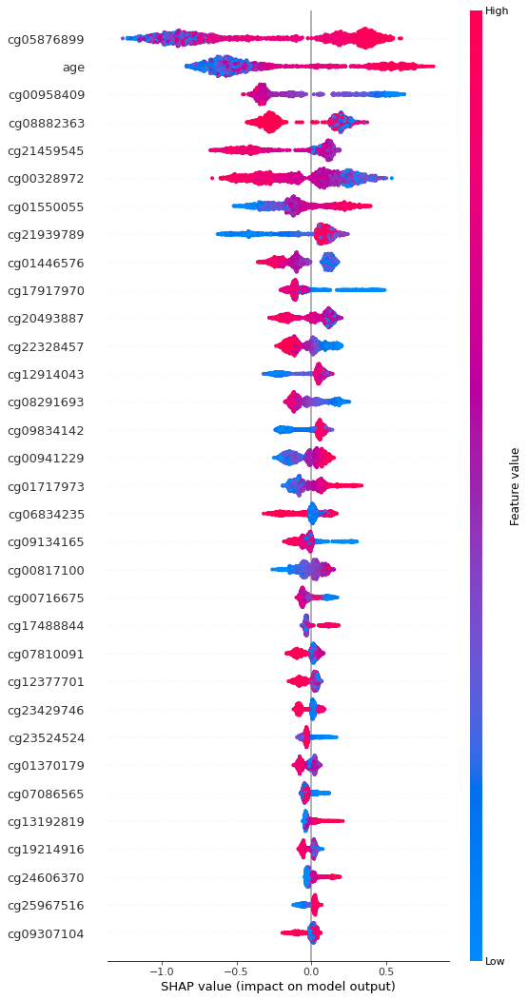

In [135]:
import shap
CatExplainer=shap.TreeExplainer(CatBoost_ML)
CatBoost_shapvalues=CatExplainer.shap_values(CatBoost_test)
shap.summary_plot(CatBoost_shapvalues,CatBoost_test,max_display=33)

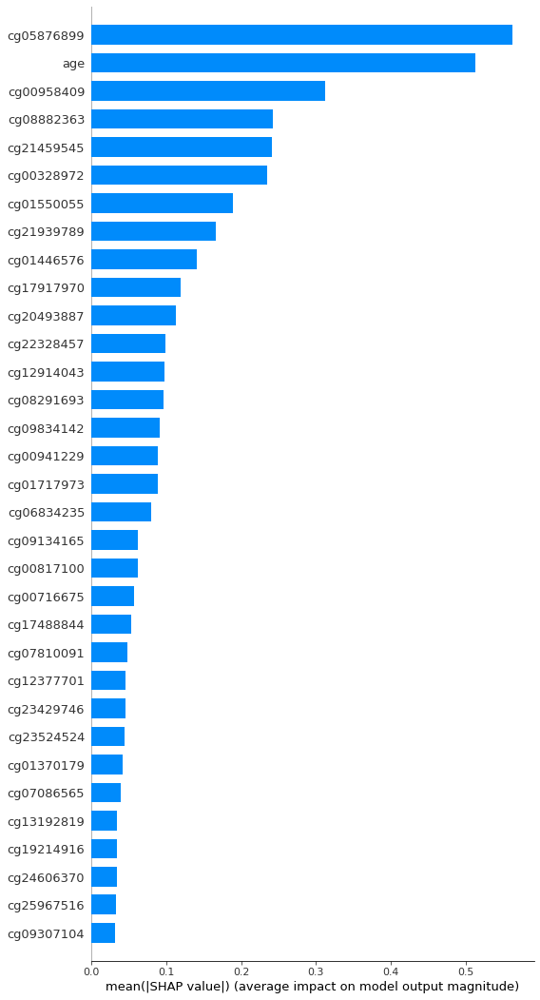

In [136]:
shap.summary_plot(CatBoost_shapvalues,CatBoost_test,max_display=33,plot_type='bar')

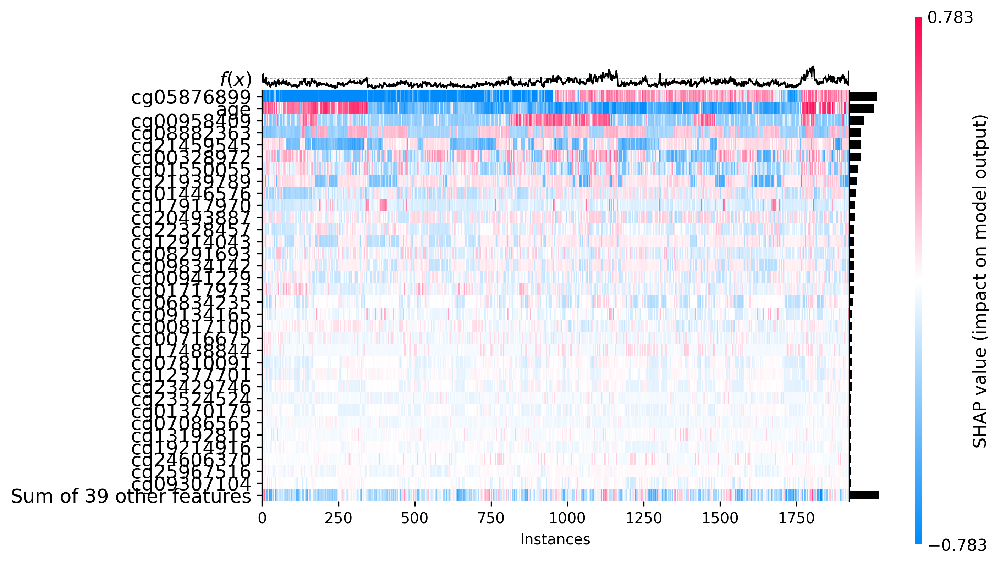

In [138]:
#绘制heatmap图
SHAP_CatBoost=CatExplainer(CatBoost_test)
plt.figure(dpi=300)
shap.plots.heatmap(SHAP_CatBoost,max_display=34)
plt.show()

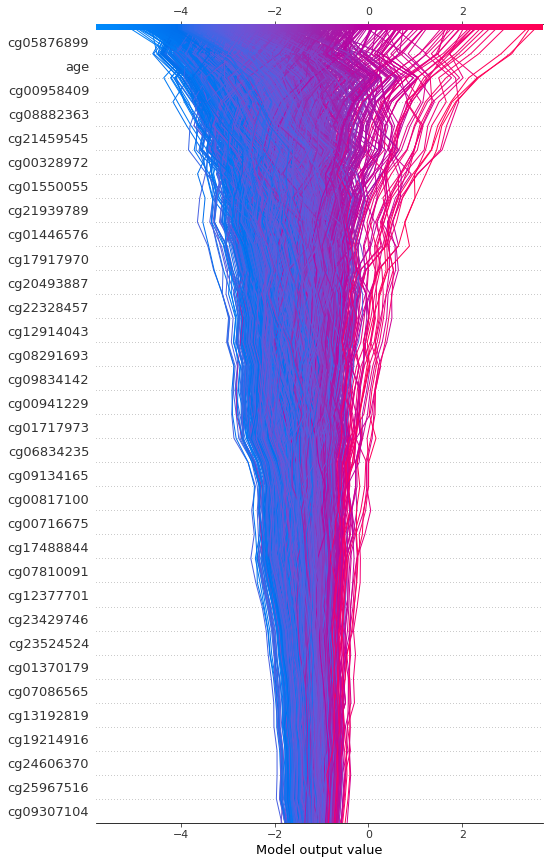

In [139]:
#绘制Decision图
expected_value=CatExplainer.expected_value
shap.decision_plot(expected_value,CatBoost_shapvalues,CatBoost_test.columns,feature_display_range=slice(None, -34, -1))

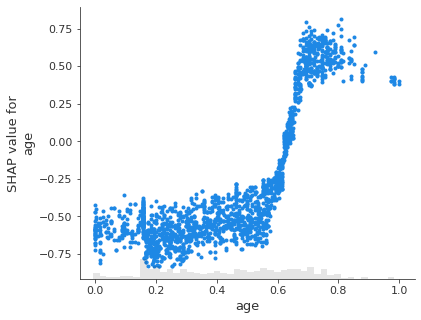

In [144]:
shap.plots.scatter(SHAP_CatBoost[:,'age'])

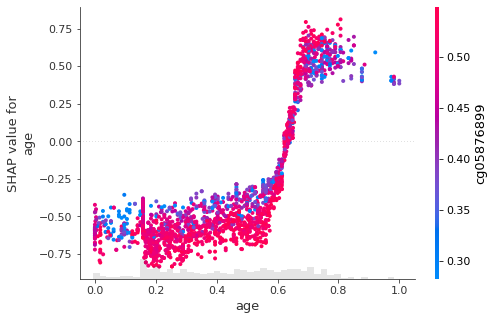

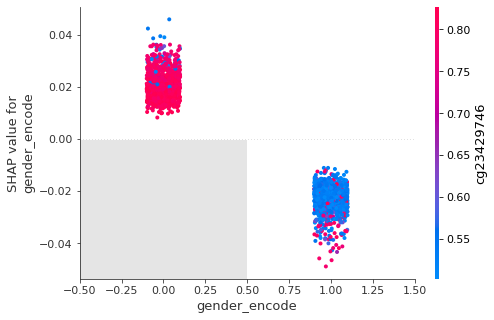

In [165]:
shap.plots.scatter(SHAP_CatBoost[:,'age'],color=SHAP_CatBoost)
shap.plots.scatter(SHAP_CatBoost[:,'gender_encode'],color=SHAP_CatBoost)

In [143]:
#输出SHAP值
SHAPData=DataFrame(CatBoost_shapvalues)
SHAPData.to_excel('Data/SHAP Values/CatBoost_SHAP_Data.xlsx','UFT-8')
SHAPData.to_csv('Data/SHAP Values/CatBoost_SHAP_Data.csv')

使用LIME（Local Interpretable Model-agnostic Explanations）对SVM模型进行模型解释性。

In [145]:
#转化为Numpy数组
import numpy as np
TestDataLIME=np.array(CatBoost_test)
TestDataLIME

array([[0.46083596, 0.72218471, 0.67574463, ..., 0.36230225, 0.66666667,
        0.        ],
       [0.38295897, 0.50947919, 0.61430678, ..., 0.46848894, 0.27192982,
        1.        ],
       [0.33958682, 0.69191957, 0.65616158, ..., 0.40703271, 0.72807018,
        1.        ],
       ...,
       [0.33958682, 0.59925265, 0.61928701, ..., 0.34645684, 0.47368421,
        1.        ],
       [0.42417219, 0.72249519, 0.67450701, ..., 0.44286982, 0.18421053,
        0.        ],
       [0.39630923, 0.69161445, 0.66946837, ..., 0.41543005, 0.27116053,
        0.        ]])

In [148]:
#构建LIME解释器
from lime.lime_tabular import LimeTabularExplainer
CatBoost_LIMEExplainer=LimeTabularExplainer(training_data=TestDataLIME,mode='classification',feature_names=CatBoost_test.columns,class_names=[0,1], discretize_continuous=True)

In [149]:
CatBoost_test.shape

(1924, 72)

In [150]:
#提取卒中患者和健康人数据——为数据生成解释
LIMEData=CatBoost_test
LIMEData['disease_encode']=np.array(CatBoost_testlabel)
#LIMEData=pd.concat([CatBoost_test,CatBoost_testlabel],axis=1,ignore_index=False)    #合并数据
Contral_Data=LIMEData.loc[LIMEData.loc[:,'disease_encode']==0,:]    #正常组数据
Contral_DataSample=Contral_Data.iloc[0,:-1]
Stroke_Data=LIMEData.loc[LIMEData.loc[:,'disease_encode']==1,:]    #正常组数据
Stroke_DataSample=Stroke_Data.iloc[1,:-1]

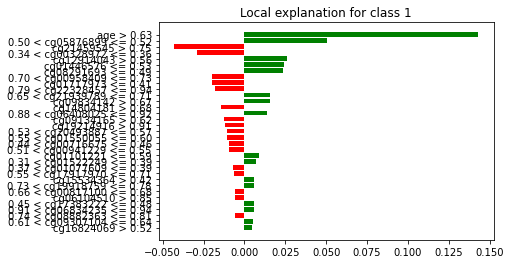

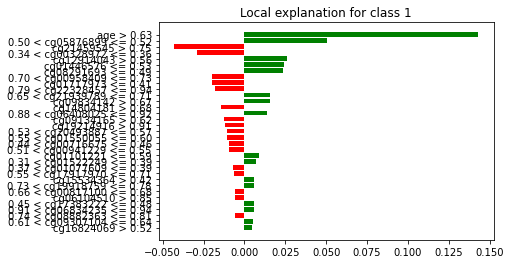

In [163]:
#为健康人生成可解释性
Contral_Explain=CatBoost_LIMEExplainer.explain_instance(Contral_DataSample,CatBoost.predict_proba,num_features=33)
#可视化解释结果
Contral_Explain.show_in_notebook(show_table=True, show_all=False)
Contral_Explain.as_pyplot_figure()

In [160]:
Control_List=Contral_Explain.as_list()
Control_STR=[]
for feature, weight in Control_List:
    print(f"特征名称: {feature}, 权重: {weight}")
    Control_STR.append(feature)

特征名称: age > 0.63, 权重: 0.14865150574161518
特征名称: 0.50 < cg05876899 <= 0.52, 权重: 0.04953711744601425
特征名称: cg21459545 > 0.75, 权重: -0.0452230781670313
特征名称: cg08291693 <= 0.49, 权重: 0.03840864053911709
特征名称: 0.79 < cg22328457 <= 0.94, 权重: -0.024663944916912463
特征名称: cg01446576 <= 0.53, 权重: 0.023327759322679577
特征名称: 0.34 < cg00328972 <= 0.36, 权重: -0.01996306540110008
特征名称: cg01717973 <= 0.41, 权重: -0.01708062697242517
特征名称: 0.70 < cg00958409 <= 0.73, 权重: -0.016727337124053457
特征名称: 0.55 < cg01550055 <= 0.60, 权重: -0.013410851190519256
特征名称: cg09134165 > 0.62, 权重: -0.012931723407679686
特征名称: cg19214916 > 0.91, 权重: -0.011827585792960877
特征名称: 0.53 < cg20493887 <= 0.57, 权重: -0.01106614834013827
特征名称: 0.65 < cg21939789 <= 0.71, 权重: 0.010721621273459702
特征名称: 0.44 < cg00716675 <= 0.46, 权重: -0.01034117860684703
特征名称: cg01101221 <= 0.59, 权重: 0.010208519532552248
特征名称: 0.62 < cg03977822 <= 0.66, 权重: 0.009724454790564338
特征名称: cg12914043 > 0.56, 权重: 0.00939769877317897
特征名称: gender_encode <= 0.00, 权重

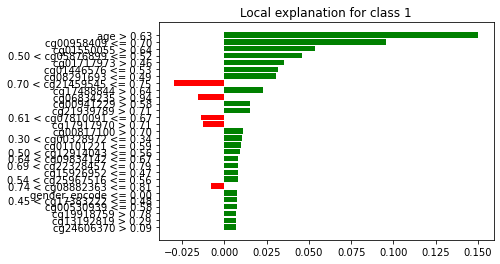

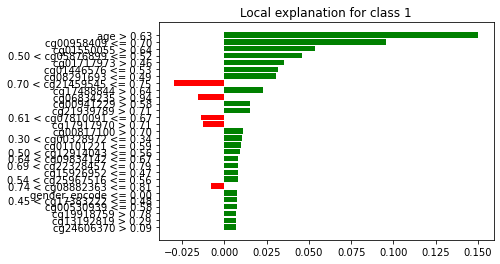

In [161]:
#为卒中患者生成可解释性
Stroke_Explain=CatBoost_LIMEExplainer.explain_instance(Stroke_DataSample,CatBoost.predict_proba,num_features=29)
#可视化解释结果
Stroke_Explain.show_in_notebook(show_table=True, show_all=False)
Stroke_Explain.as_pyplot_figure()

In [162]:
Stroke_List=Stroke_Explain.as_list()
Stroke_STR=[]
for feature, weight in Control_List:
    print(f"特征名称: {feature}, 权重: {weight}")
    Stroke_STR.append(feature)

特征名称: age > 0.63, 权重: 0.14865150574161518
特征名称: 0.50 < cg05876899 <= 0.52, 权重: 0.04953711744601425
特征名称: cg21459545 > 0.75, 权重: -0.0452230781670313
特征名称: cg08291693 <= 0.49, 权重: 0.03840864053911709
特征名称: 0.79 < cg22328457 <= 0.94, 权重: -0.024663944916912463
特征名称: cg01446576 <= 0.53, 权重: 0.023327759322679577
特征名称: 0.34 < cg00328972 <= 0.36, 权重: -0.01996306540110008
特征名称: cg01717973 <= 0.41, 权重: -0.01708062697242517
特征名称: 0.70 < cg00958409 <= 0.73, 权重: -0.016727337124053457
特征名称: 0.55 < cg01550055 <= 0.60, 权重: -0.013410851190519256
特征名称: cg09134165 > 0.62, 权重: -0.012931723407679686
特征名称: cg19214916 > 0.91, 权重: -0.011827585792960877
特征名称: 0.53 < cg20493887 <= 0.57, 权重: -0.01106614834013827
特征名称: 0.65 < cg21939789 <= 0.71, 权重: 0.010721621273459702
特征名称: 0.44 < cg00716675 <= 0.46, 权重: -0.01034117860684703
特征名称: cg01101221 <= 0.59, 权重: 0.010208519532552248
特征名称: 0.62 < cg03977822 <= 0.66, 权重: 0.009724454790564338
特征名称: cg12914043 > 0.56, 权重: 0.00939769877317897
特征名称: gender_encode <= 0.00, 权重

In [164]:
Stroke_STR

['age > 0.63',
 '0.50 < cg05876899 <= 0.52',
 'cg21459545 > 0.75',
 'cg08291693 <= 0.49',
 '0.79 < cg22328457 <= 0.94',
 'cg01446576 <= 0.53',
 '0.34 < cg00328972 <= 0.36',
 'cg01717973 <= 0.41',
 '0.70 < cg00958409 <= 0.73',
 '0.55 < cg01550055 <= 0.60',
 'cg09134165 > 0.62',
 'cg19214916 > 0.91',
 '0.53 < cg20493887 <= 0.57',
 '0.65 < cg21939789 <= 0.71',
 '0.44 < cg00716675 <= 0.46',
 'cg01101221 <= 0.59',
 '0.62 < cg03977822 <= 0.66',
 'cg12914043 > 0.56',
 'gender_encode <= 0.00',
 'cg09834142 > 0.67',
 '0.85 < cg09229960 <= 0.89',
 'cg15534364 > 0.42',
 '0.66 < cg00817100 <= 0.68',
 '0.55 < cg17488844 <= 0.64',
 '0.31 < cg01522249 <= 0.39',
 'cg27260927 > 0.72',
 '0.55 < cg17917970 <= 0.71',
 'cg27353825 > 0.44',
 'cg19267533 > 0.59',
 'cg00962755 > 0.44',
 'cg25967516 > 0.56',
 '0.61 < cg09060772 <= 0.64',
 '0.41 < cg27636290 <= 0.45']

获取LIME核SHAP数据交集

In [9]:
SHAP_CG=["cg05876899","cg00958409","cg08882363","cg21459545","cg00328972","cg01550055","cg21939789","cg01446576","cg17917970","cg20493887",
         "cg22328457","cg12914043","cg08291693","cg09834142","cg00941229","cg01717973","cg06834235","cg09134165","cg00817100","cg00716675",
         "cg17488844","cg07810091","cg12377701","cg23429746","cg32524254","cg01370179","cg07086565","cg13192819","cg19214916","cg24606370",
         "cg25967516","cg09307104","cg05876899"]
LIME_CG=['cg05876899', 'cg21459545', 'cg08291693', 'cg22328457', 'cg01446576','cg00328972', 'cg01717973', 'cg00958409', 'cg01550055', 'cg09134165',
         'cg19214916', 'cg20493887', 'cg21939789', 'cg00716675', 'cg01101221','cg03977822', 'cg12914043', 'cg09834142', 'cg09229960', 'cg15534364',
         'cg00817100', 'cg17488844', 'cg01522249', 'cg27260927', 'cg17917970','cg27353825', 'cg19267533', 'cg00962755', 'cg25967516', 'cg09060772',
         'cg27636290','cg23429746','cg05876899']
Feature_CG=set(SHAP_CG)&set(LIME_CG)    #计算交集
Feature_CG

{'cg00328972',
 'cg00716675',
 'cg00817100',
 'cg00958409',
 'cg01446576',
 'cg01550055',
 'cg01717973',
 'cg05876899',
 'cg08291693',
 'cg09134165',
 'cg09834142',
 'cg12914043',
 'cg17488844',
 'cg17917970',
 'cg19214916',
 'cg20493887',
 'cg21459545',
 'cg21939789',
 'cg22328457',
 'cg23429746',
 'cg25967516'}

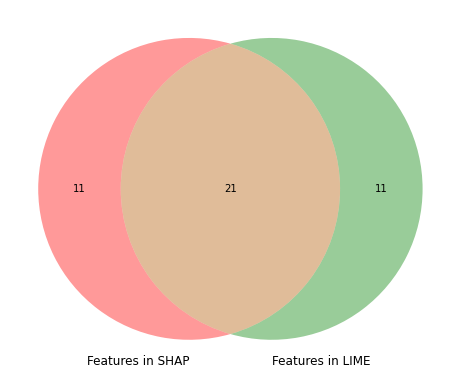

In [173]:
from matplotlib import pyplot as plt
from matplotlib_venn import venn2
plt.figure(figsize=(8, 8))
venn2([set(SHAP_CG),set(LIME_CG)], set_labels=('Features in SHAP', 'Features in LIME'))
plt.show()

对数据进行统计学分析

In [10]:
StatData=MethylationData.loc[:,list(Feature_CG)+['gender','age','disease']]
StatData.head(10)

,cg00716675,cg00958409,cg01550055,cg17488844,cg08291693,cg25967516,cg21459545,cg09834142,cg19214916,cg05876899,...,cg00817100,cg01717973,cg21939789,cg12914043,cg09134165,cg22328457,cg01446576,gender,age,disease
0,-3.837361,-2.616463,-1.585160,-1.909169,2.324893,-0.052001,0.384596,-0.601375,0.200630,2.921730,...,-2.010774,-3.052934,-0.164336,-0.866223,-1.288795,-1.564056,-2.570129,F,78.0,stroke
1,-4.247583,-2.767818,-1.247949,-3.938986,3.100385,-1.657722,-0.645381,-3.938986,-1.557086,3.228904,...,-1.543240,-3.886935,-3.314031,-3.790034,-3.256540,0.000000,-3.744756,M,52.0,stroke
2,-3.993781,-2.375206,-1.536363,-4.489850,2.749976,-1.734052,-0.519260,-4.178048,-1.219330,3.076403,...,-1.710727,-5.273603,-2.698069,-3.201956,-3.744756,-3.580953,-4.051632,M,92.0,stroke
3,-3.790034,-2.555085,-1.757764,-1.695385,3.076403,-1.125184,0.281794,-0.795272,-0.376304,3.374769,...,-2.288480,-4.178048,-0.540693,-2.120936,0.048000,-2.441207,-4.585271,F,87.0,stroke
4,-4.402578,-2.388119,-1.726235,-3.580953,3.007447,-2.079779,-0.397057,-3.580953,-1.848299,3.228904,...,-2.337277,-3.993781,-2.785946,-3.256540,-3.149987,-3.744756,-4.247583,M,87.0,stroke
5,-3.790034,-2.230092,-1.253727,-4.322159,2.881228,-1.856830,0.003999,-2.985388,-1.185564,3.314031,...,-2.020410,-4.112908,-2.648415,-2.804368,-3.100385,-3.701353,-4.112908,M,41.0,stroke
6,-3.790034,-2.715111,-1.271175,-0.772045,2.767818,-0.954183,0.519260,0.019997,-0.924494,3.124904,...,-1.900305,-3.837361,-0.401218,-1.093021,0.156286,-1.114405,-4.585271,F,78.0,stroke
7,-2.749976,-2.749976,-1.324576,-3.790034,3.701353,-2.441207,-0.654254,-3.580953,-2.496772,3.284902,...,-1.330612,-4.051632,-2.482634,-3.837361,-3.076403,-3.314031,-4.322159,M,80.0,stroke
8,-2.427712,-2.648415,-1.157883,-4.690541,3.314031,-2.804368,-0.426255,-4.247583,-1.613763,3.201956,...,-1.146922,-4.322159,-2.401172,-3.406479,-3.406479,0.000000,-4.247583,M,69.0,stroke
9,-2.842141,-2.540233,-0.974195,-5.773449,3.256540,-2.511081,0.084033,-4.112908,-1.373471,3.543689,...,-1.348848,-3.886935,-2.570129,-3.100385,0.000000,0.000000,-3.659672,M,75.0,stroke


In [180]:
#进行正态性检验-基于D’Agostino and Pearson’s test 
from scipy.stats import normaltest
Normal_Name,Normal_stat,Normal_Pvalue=[],[],[]
for normal_name in list(Feature_CG)+['age']:
    stats,p_value=normaltest(StatData.loc[:,normal_name])    #正态检验
    Normal_Name.append(normal_name)
    Normal_stat.append(stats)
    Normal_Pvalue.append(p_value)
NormalResut=DataFrame()
NormalResut['Features']=Normal_Name
NormalResut['Stats']=Normal_stat
NormalResut['P value']=Normal_Pvalue
NormalResut

,Features,Stats,P value
0,cg23429746,128338.014578,0.000000e+00
1,cg19214916,2722.890099,0.000000e+00
2,cg01717973,2679.681287,0.000000e+00
3,cg21459545,3691.925554,0.000000e+00
4,cg20493887,621.263340,1.242739e-135
5,cg01550055,881.708181,3.463389e-192
6,cg01446576,3764.295928,0.000000e+00
7,cg05876899,1797.616451,0.000000e+00
8,cg00817100,5265.657589,0.000000e+00
9,cg09134165,1570.401594,0.000000e+00


In [181]:
NormalResut.to_excel('Data/Analysis Data/NormalTest.xlsx')    #输出正态检验结果



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



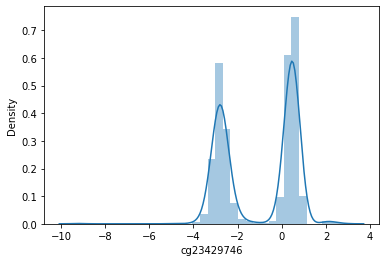



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



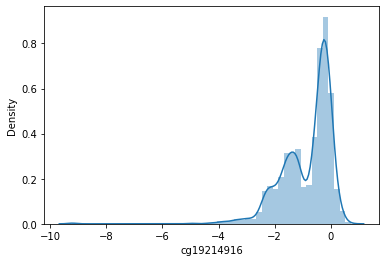



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



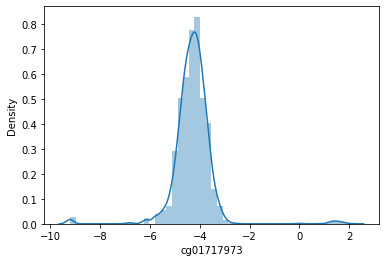



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



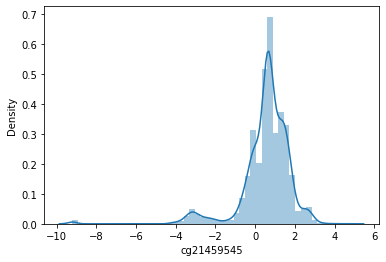



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



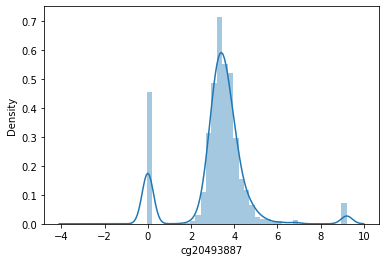



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



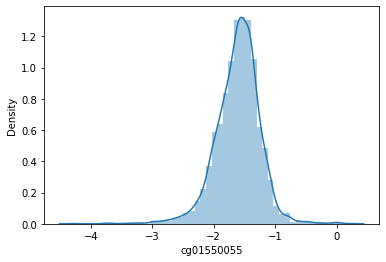



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



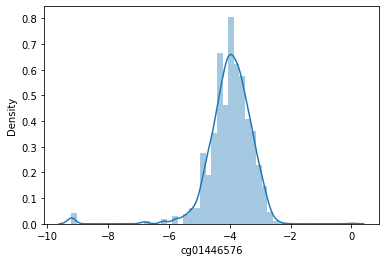



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



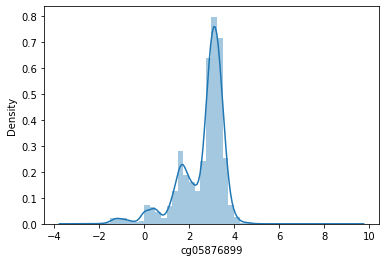



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



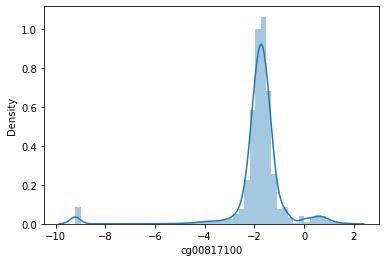



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



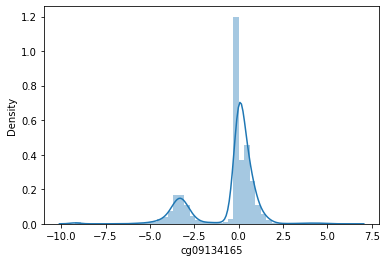



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



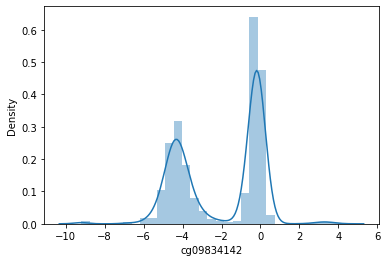



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



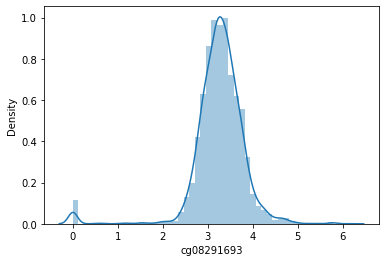



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



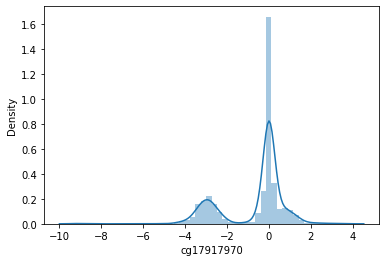



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



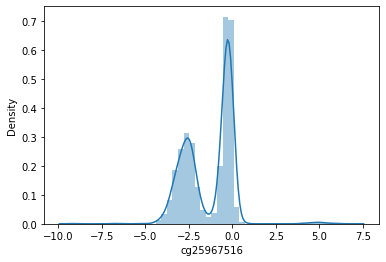



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



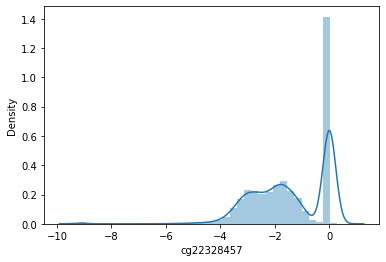



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



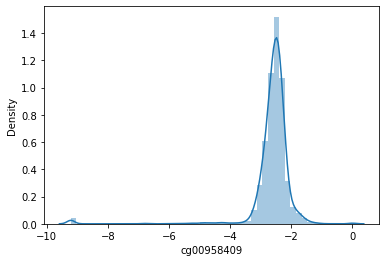



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



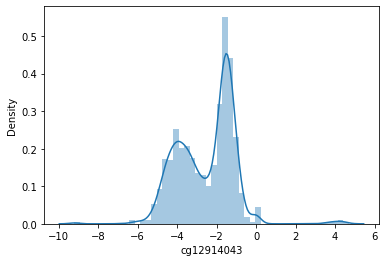



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



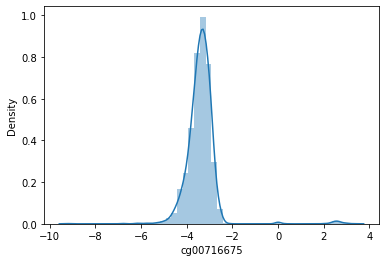



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



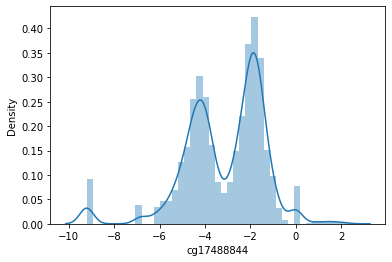



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



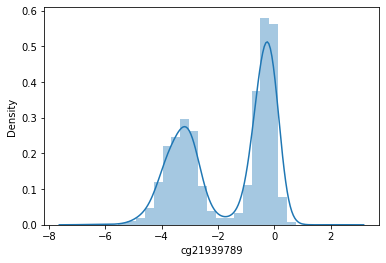



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



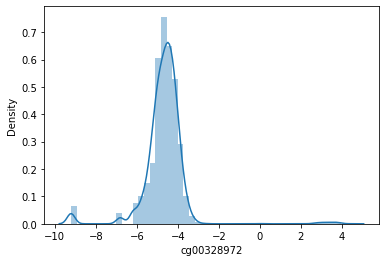



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



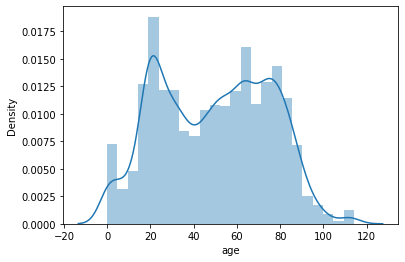

In [185]:
#绘制分布图
import seaborn as sns
for name in list(Feature_CG)+['age']:
    kde=plt.figure()
    sns.distplot(StatData.loc[:,name])
    plt.show()

In [189]:
#使用Mann-Whitney U对卒中患者、对照组进行差异分析
from scipy.stats import mannwhitneyu,kruskal
Diff_name,Mann_W_stats,Mann_W_pvalue=[],[],[]
Stroke=StatData.loc[StatData.loc[:,'disease']=='stroke',:]
Control=StatData.loc[StatData.loc[:,'disease']=='control',:]
for name in list(Feature_CG)+['age']:
    mann_stats,mann_pvalue=mannwhitneyu(Stroke.loc[:,name],Control.loc[:,name],alternative='two-sided')
    Diff_name.append(name)
    Mann_W_stats.append(mann_stats)
    Mann_W_pvalue.append(mann_pvalue)
DiffResult=DataFrame()
DiffResult['Features']=Diff_name
DiffResult['Mann-Whitney U Stats']=Mann_W_stats
DiffResult['Mann-Whitney U Pvalue']=Mann_W_pvalue
DiffResult=DiffResult.sort_values('Mann-Whitney U Pvalue',ascending=True)
DiffResult

,Features,Mann-Whitney U Stats,Mann-Whitney U Pvalue
7,cg05876899,757768.0,6.339030e-41
21,age,746114.5,6.539961e-38
15,cg00958409,212382.0,4.768737e-29
3,cg21459545,223154.5,1.027115e-26
5,cg01550055,683678.0,8.623696e-24
14,cg22328457,267557.0,4.269751e-19
6,cg01446576,283942.5,1.678612e-15
12,cg17917970,300048.5,2.240491e-13
9,cg09134165,309546.0,4.232856e-12
20,cg00328972,315722.5,6.231854e-11


In [190]:
DiffResult.to_excel('Data/Analysis Data/StrokeVSControl.xlsx')

In [216]:
#数据标准化和缩放
CorrData=StatData.loc[:,['age','cg05876899']]
Corr_name=CorrData.columns
CorrStand=StandardScaler()    #数据标准化
CorrStand=CorrStand.fit_transform(CorrData)
MinMaxCorr=MinMaxScaler(feature_range=(0,1))    #数据缩放
MinMax=MinMaxCorr.fit_transform(CorrStand)
CorrDataST=DataFrame(MinMax)
CorrDataST.columns=Corr_name
CorrDataST

,age,cg05876899
0,0.684211,0.495571
1,0.456140,0.520210
2,0.807018,0.507977
3,0.763158,0.531910
4,0.763158,0.520210
...,...,...
6408,0.000000,0.430502
6409,0.652632,0.511868
6410,0.605263,0.502446
6411,0.298246,0.534453


Spearman相关系数为:-0.09646944046883249,P值为:9.790722731741588e-15


<Figure size 1800x1200 with 0 Axes>

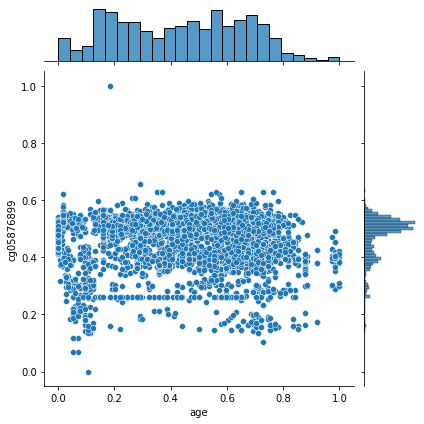

In [218]:
#绘制age与cg05876899散点图
from scipy.stats import spearmanr
corr,p_value=spearmanr(CorrDataST.loc[:,'age'],CorrDataST.loc[:,'cg05876899'])
print('Spearman相关系数为:{0},P值为:{1}'.format(corr,p_value))
plt.figure(dpi=300)
sns.jointplot(data=CorrDataST,x='age',y='cg05876899')
plt.show()

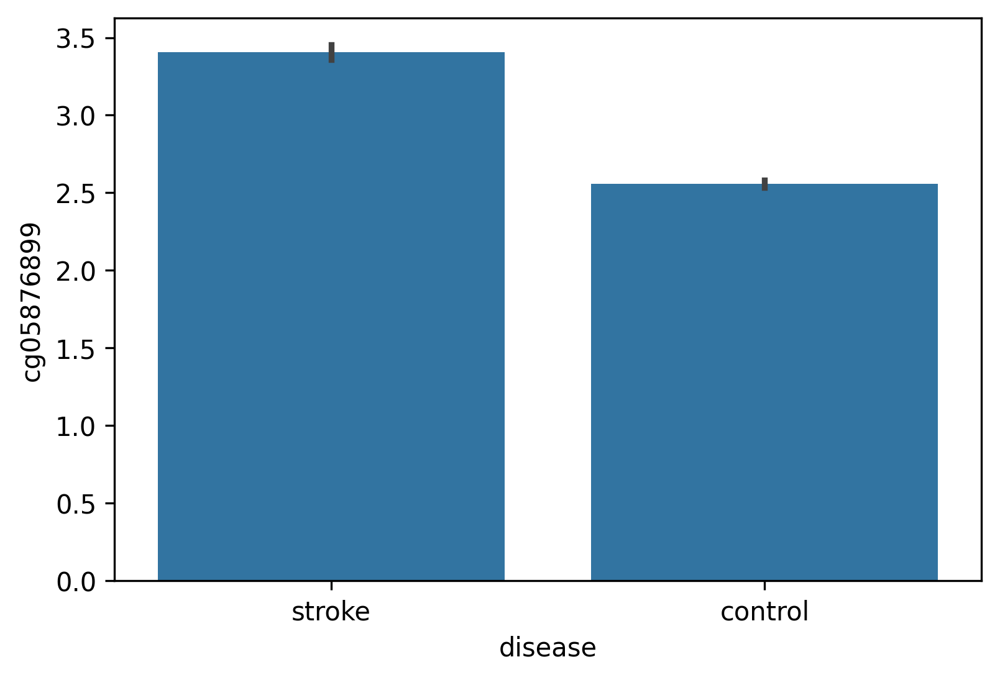

In [209]:
plt.figure(dpi=300)
sns.barplot(StatData,x='disease',y='cg05876899',errorbar="ci")
plt.show()

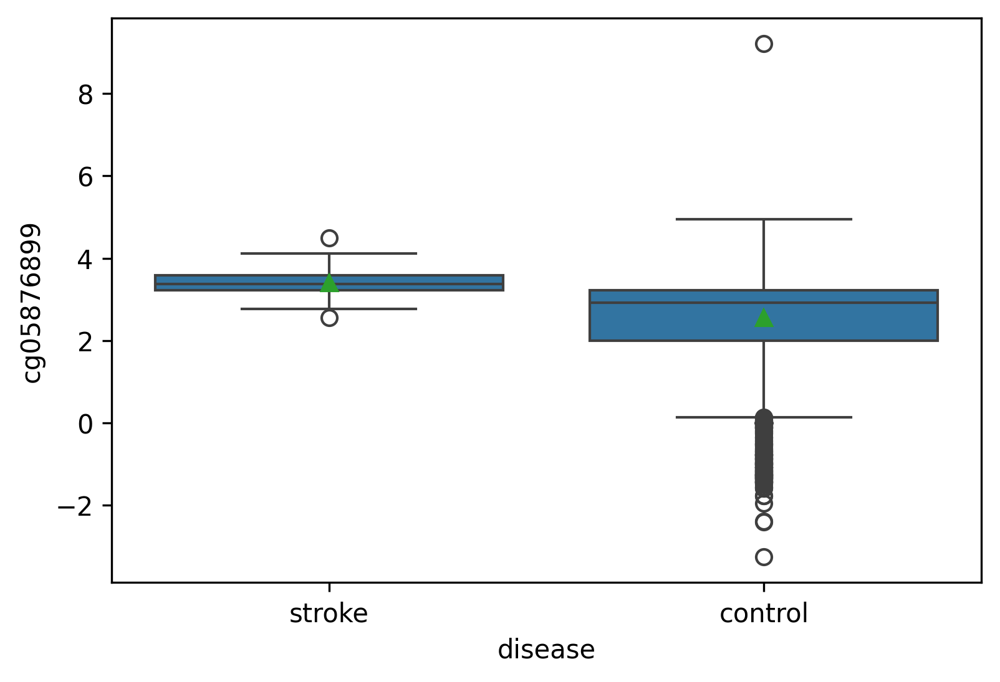

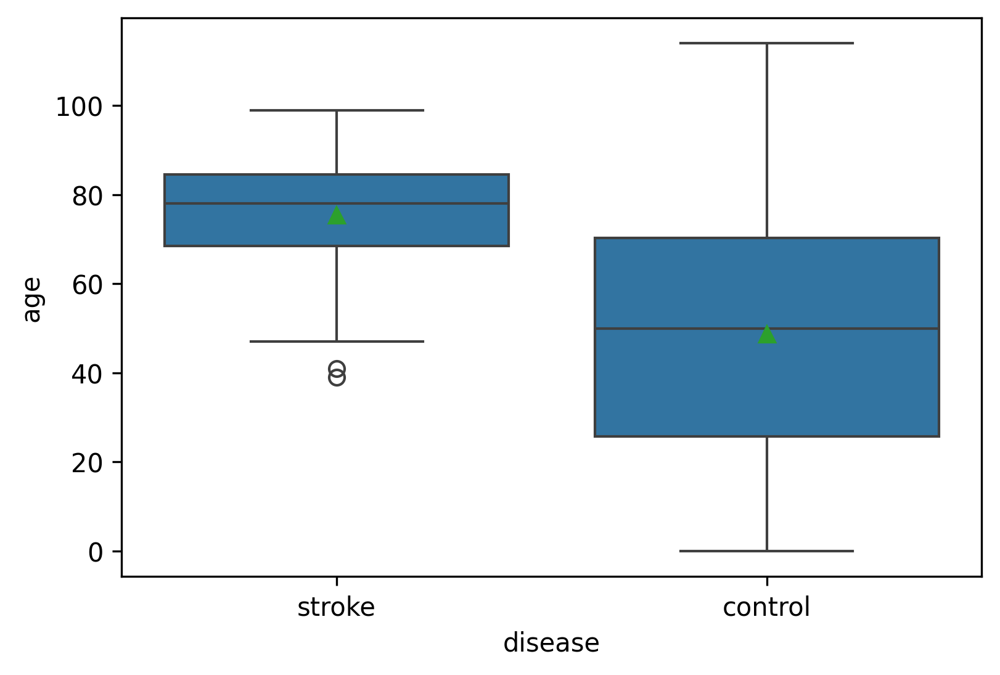

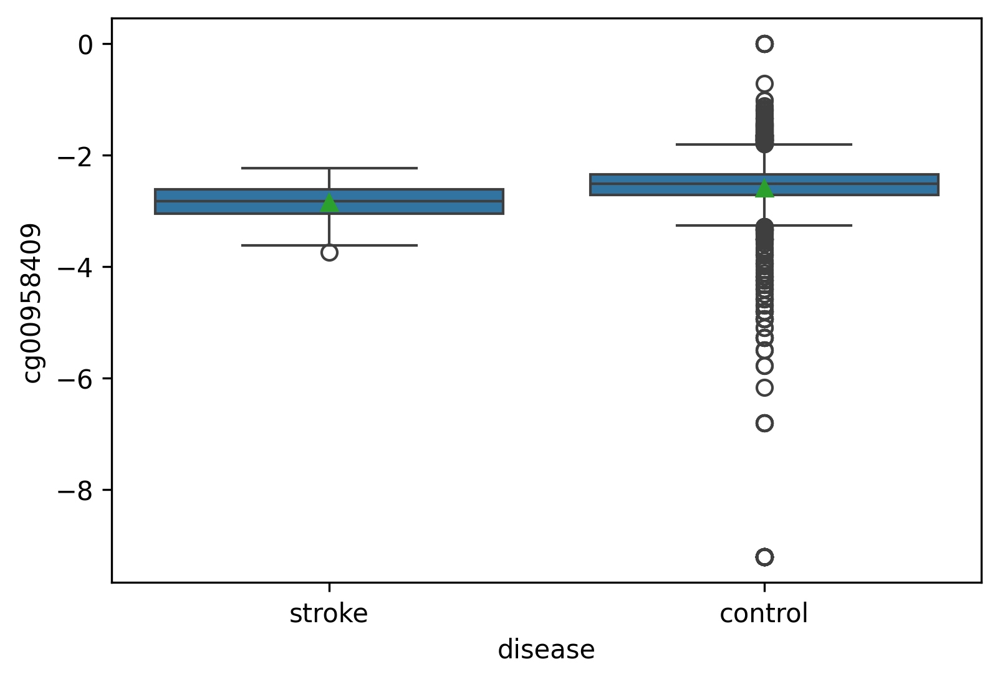

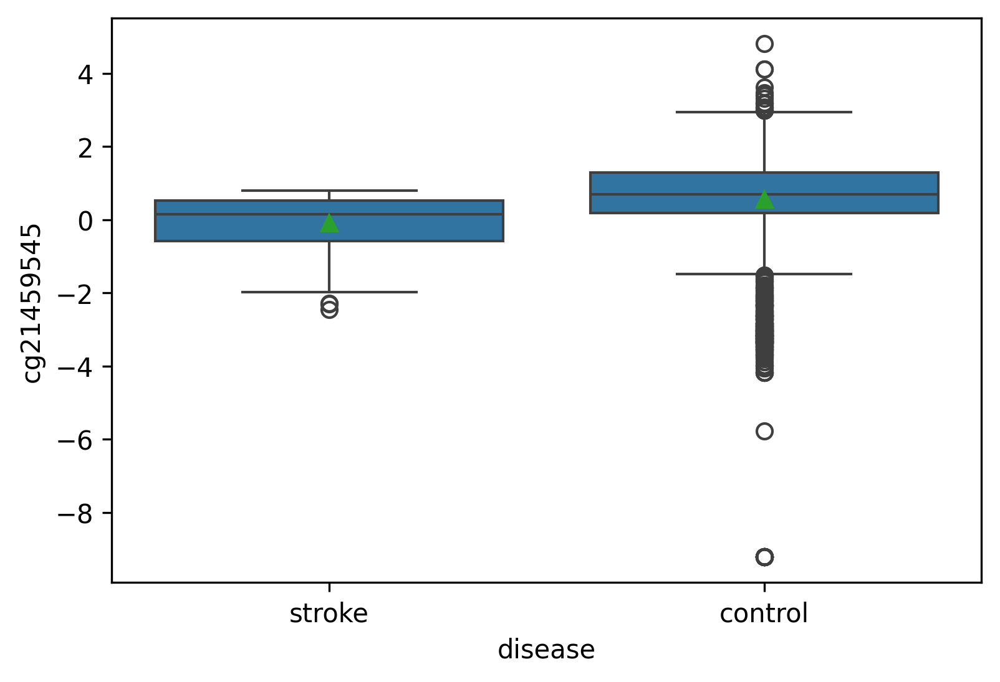

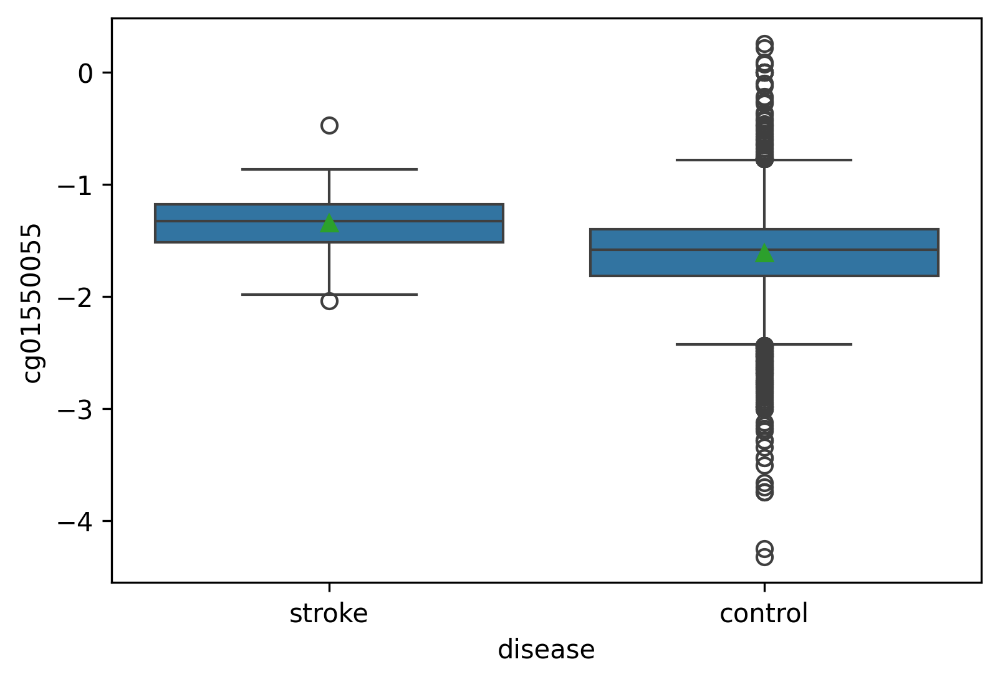

...

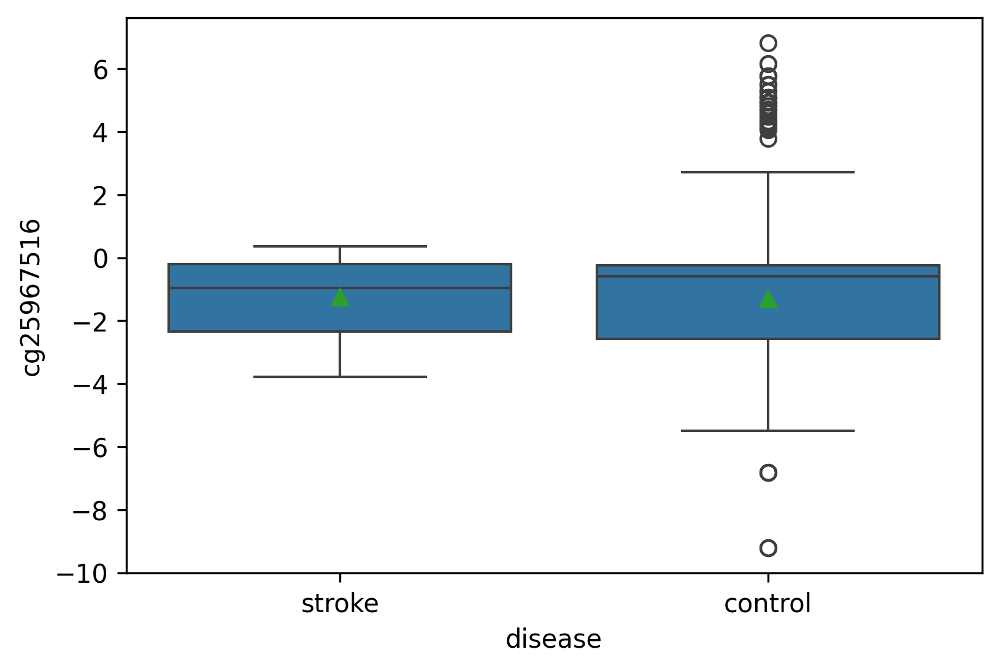

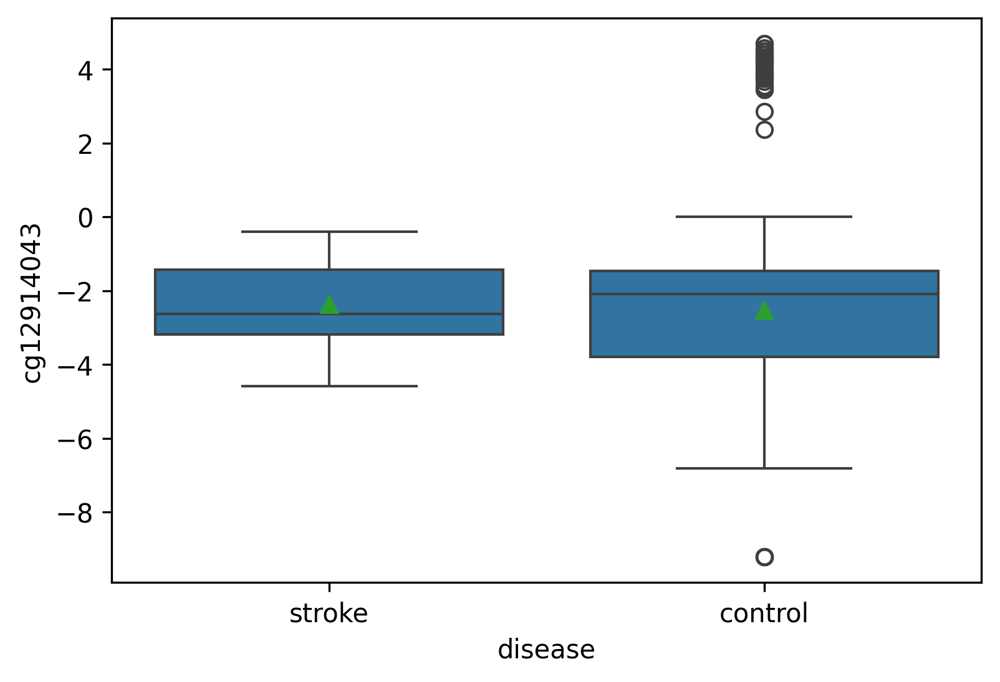

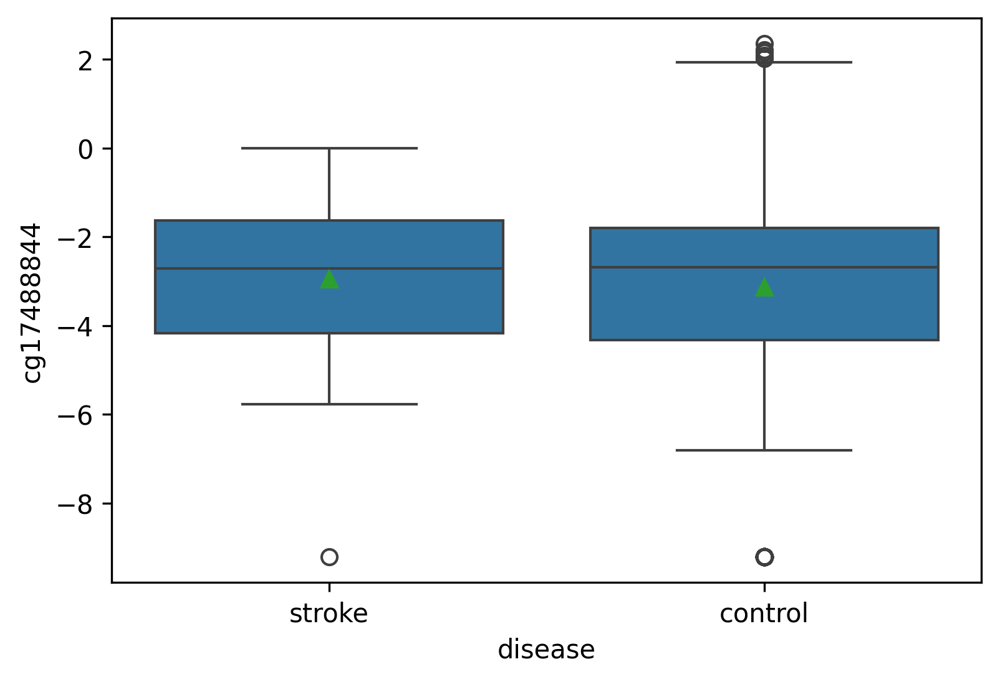

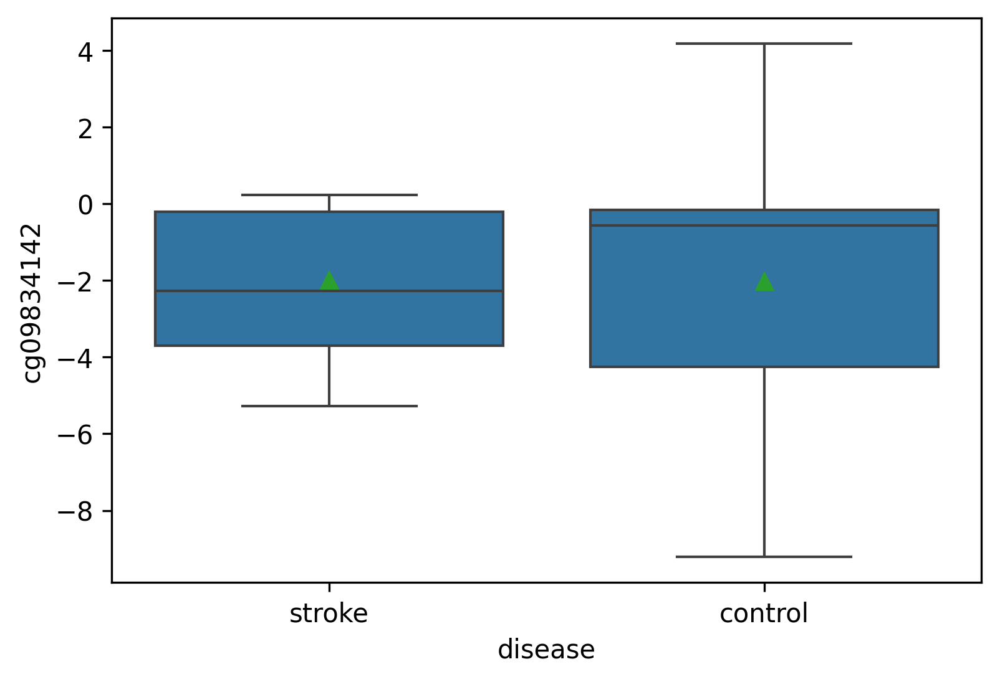

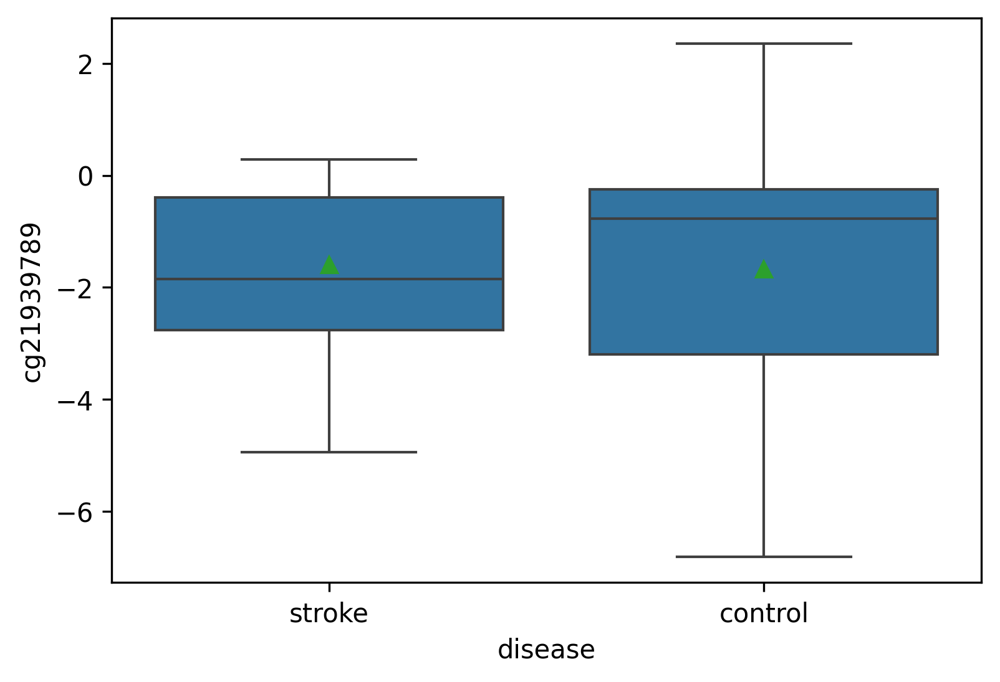

In [191]:
#绘制箱型图
for name in list(DiffResult['Features']):
    Box=plt.figure(dpi=300)
    sns.boxplot(StatData,x='disease',y=name,showmeans=True)
    plt.show()

In [195]:
#使用Mann-Whitney U对男性患者和女性患者进行差异分析
from scipy.stats import mannwhitneyu,kruskal
SexDiff_name,SexMann_W_stats,SexMann_W_pvalue=[],[],[]
Stroke=StatData.loc[StatData.loc[:,'disease']=='stroke',:]
Man=Stroke.loc[Stroke.loc[:,'gender']=='M',:]
Feman=Stroke.loc[Stroke.loc[:,'gender']=='F',:]
for name in list(Feature_CG)+['age']:
    mann_stats,mann_pvalue=mannwhitneyu(Man.loc[:,name],Feman.loc[:,name],alternative='two-sided')
    SexDiff_name.append(name)
    SexMann_W_stats.append(mann_stats)
    SexMann_W_pvalue.append(mann_pvalue)
SexDiffResult=DataFrame()
SexDiffResult['Features']=SexDiff_name
SexDiffResult['Mann-Whitney U Stats']=SexMann_W_stats
SexDiffResult['Mann-Whitney U Pvalue']=SexMann_W_pvalue
SexDiffResult=SexDiffResult.sort_values('Mann-Whitney U Pvalue',ascending=True)
SexDiffResult

,Features,Mann-Whitney U Stats,Mann-Whitney U Pvalue
0,cg23429746,55.0,1.184262e-24
10,cg09834142,57.0,1.280125e-24
18,cg17488844,57.5,1.295483e-24
19,cg21939789,71.0,2.245348e-24
3,cg21459545,72.5,2.394466e-24
16,cg12914043,91.0,4.948103e-24
13,cg25967516,129.5,2.259475e-23
1,cg19214916,156.5,6.443147e-23
9,cg09134165,202.0,3.474110e-22
12,cg17917970,310.0,1.973555e-20


In [196]:
SexDiffResult.to_excel('Data/Analysis Data/SexDiffResult.xlsx')

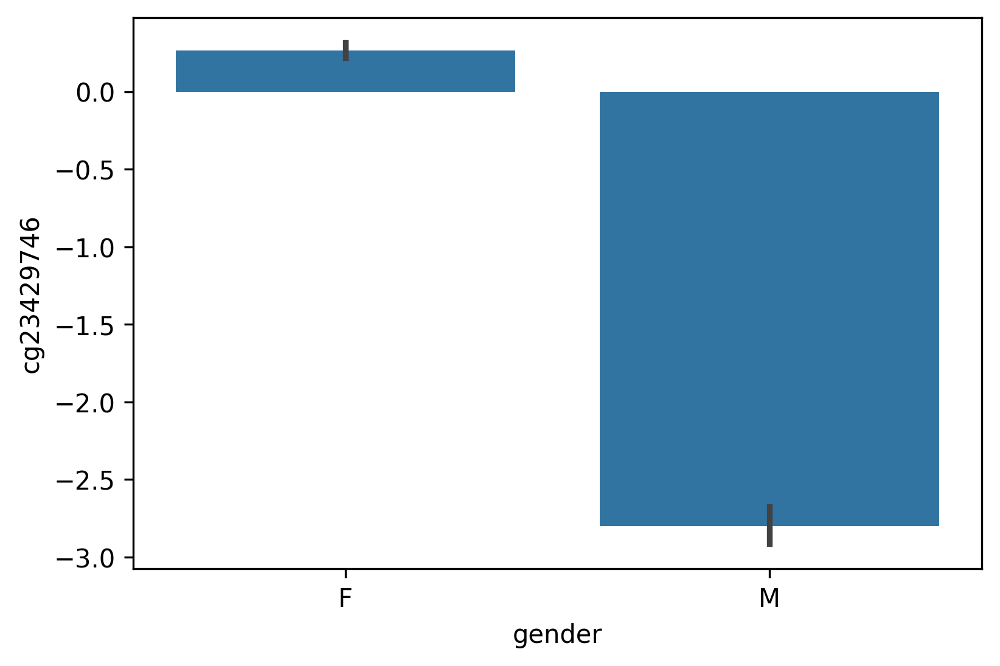

In [210]:
plt.figure(dpi=300)
sns.barplot(Stroke,x='gender',y='cg23429746',errorbar="ci")
plt.show()

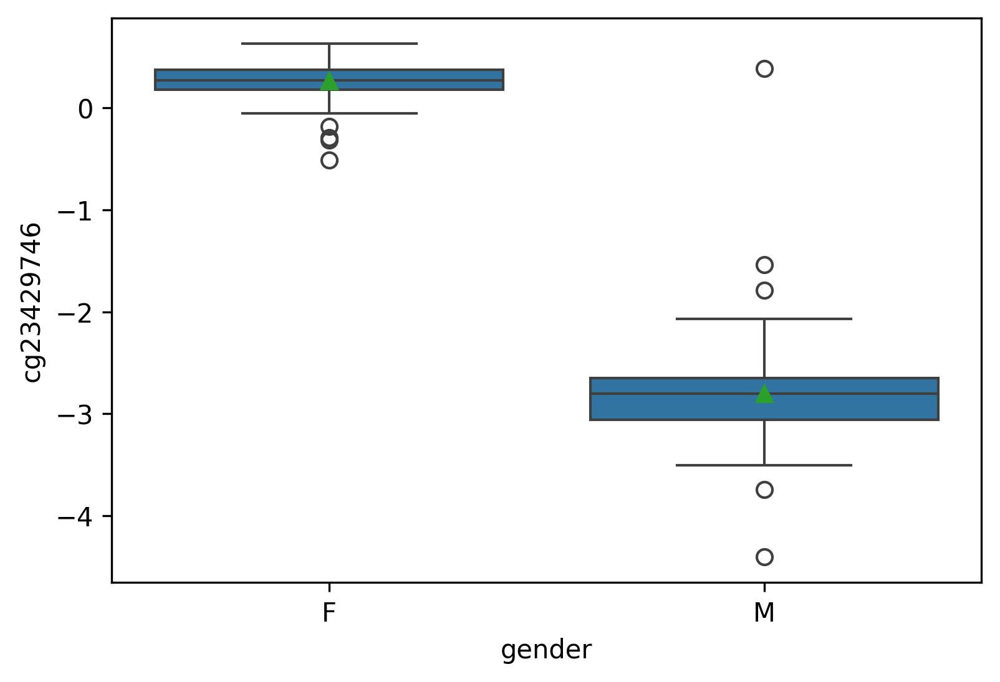

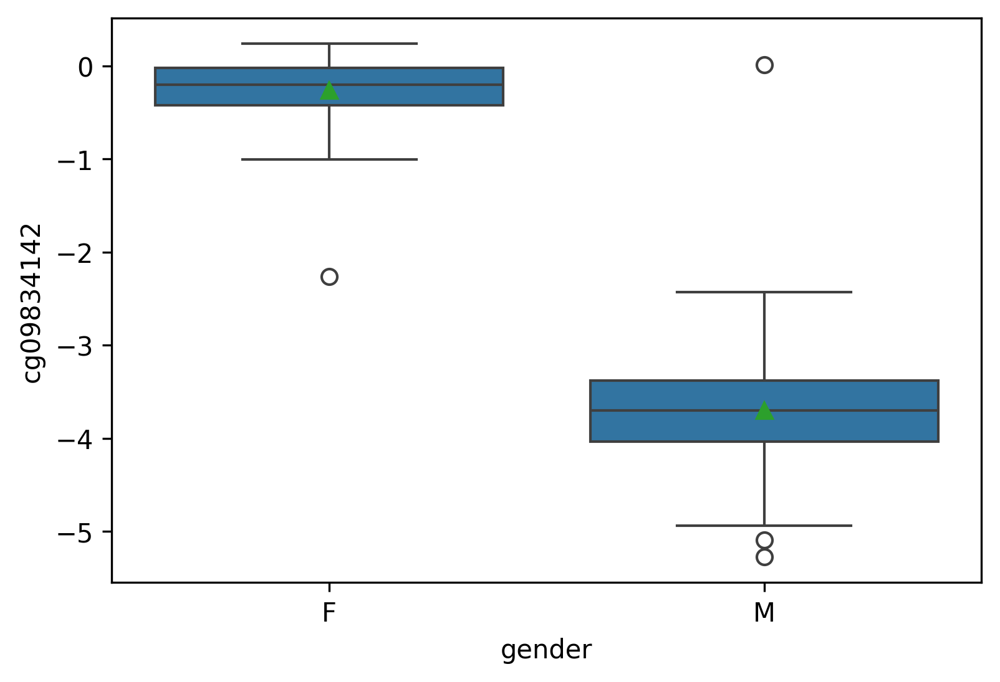

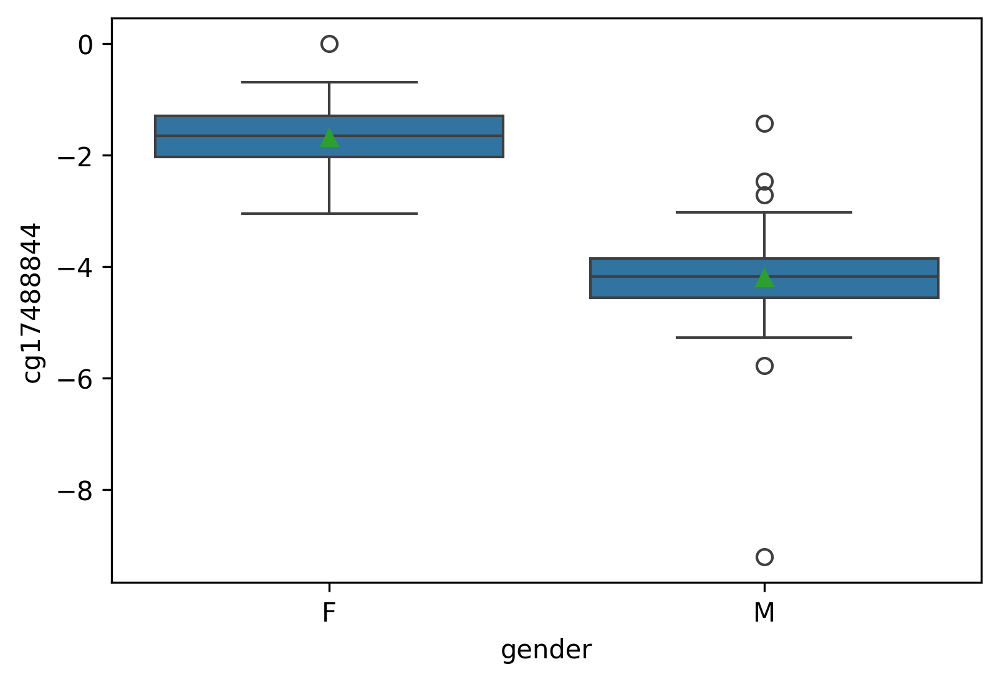

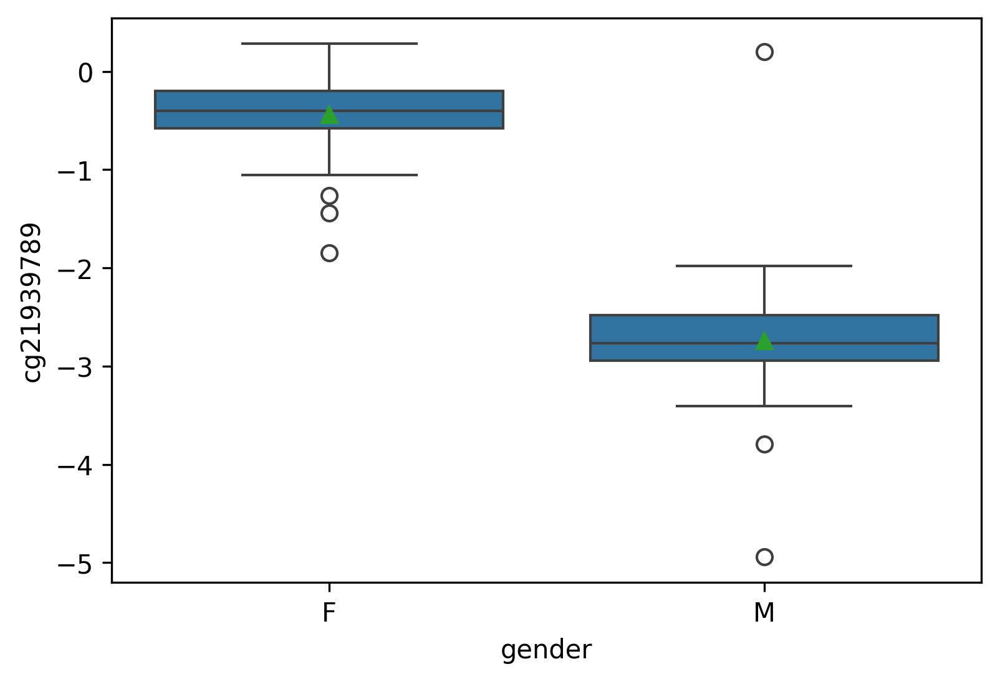

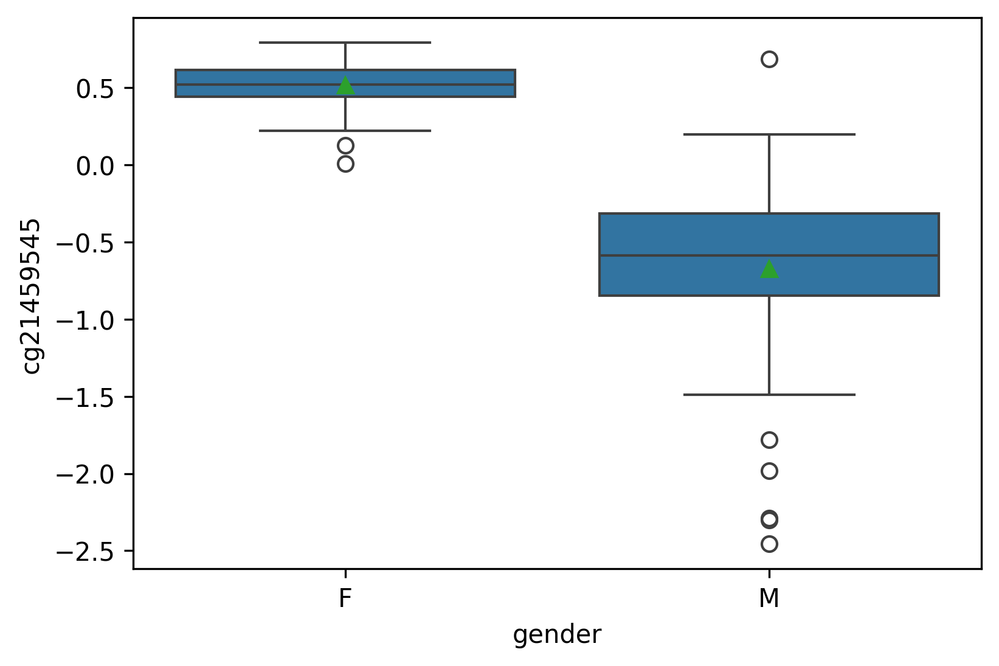

...

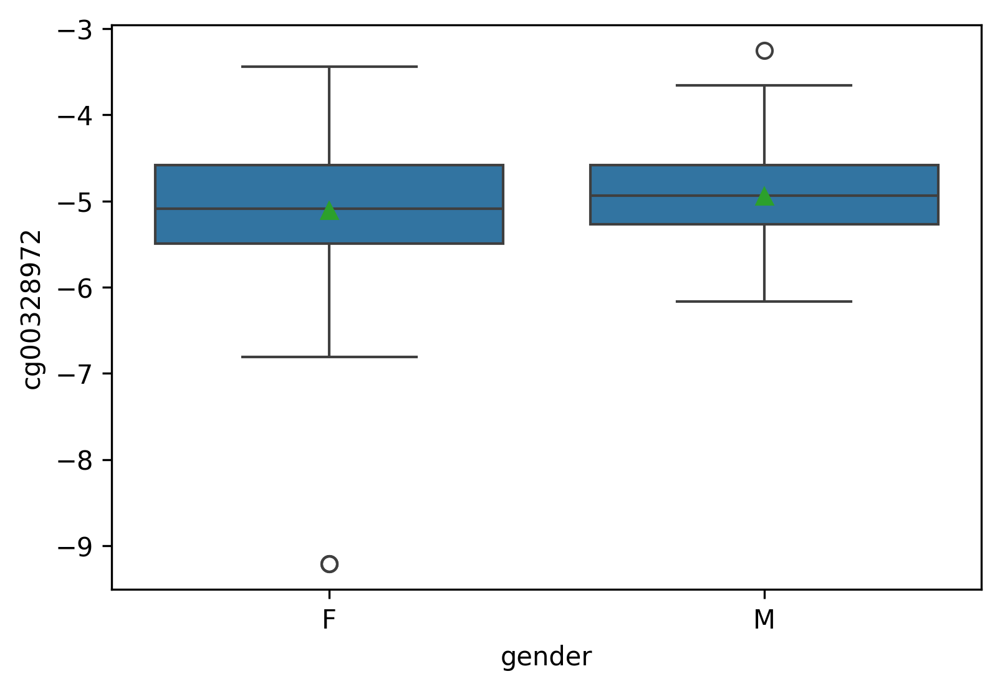

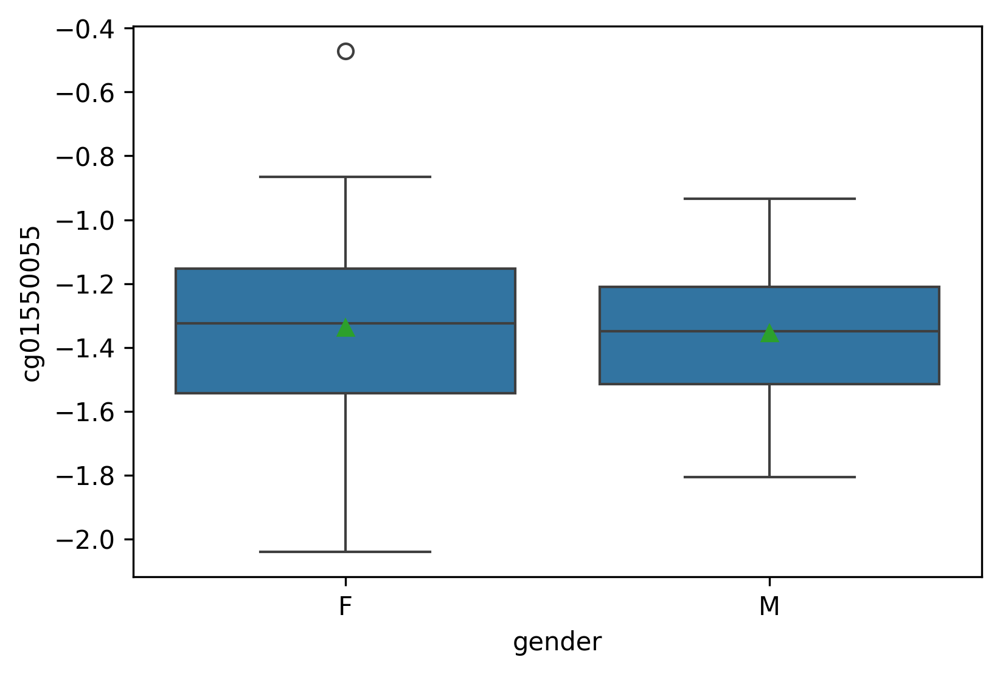

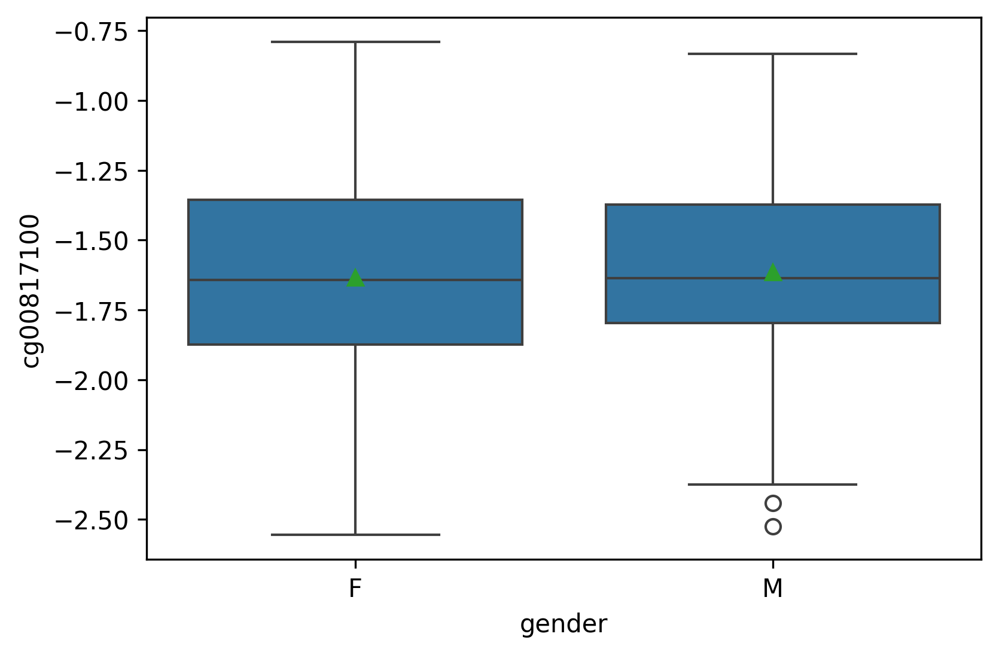

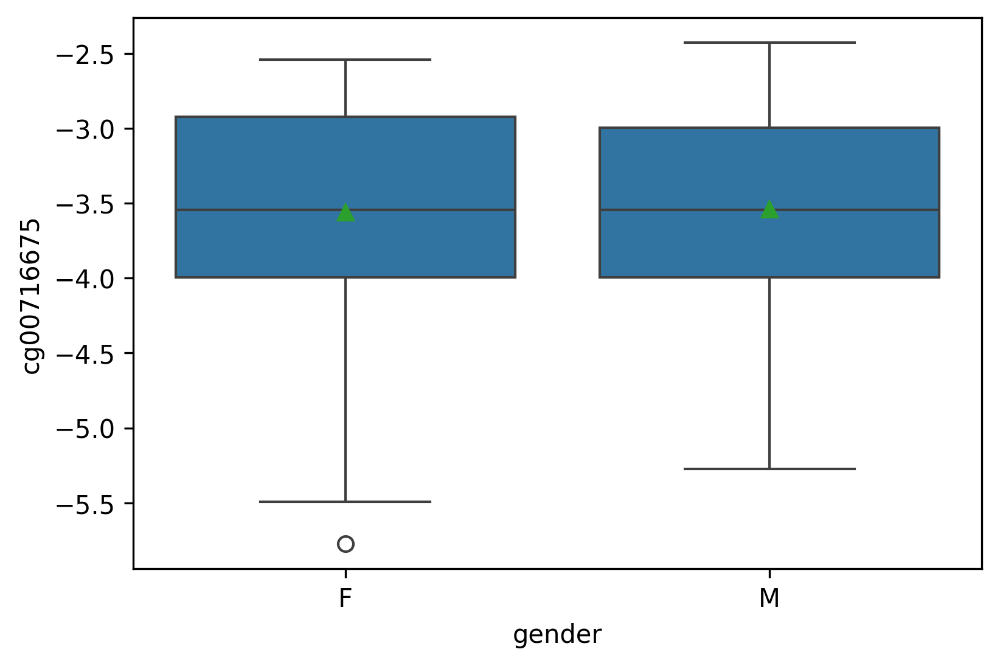

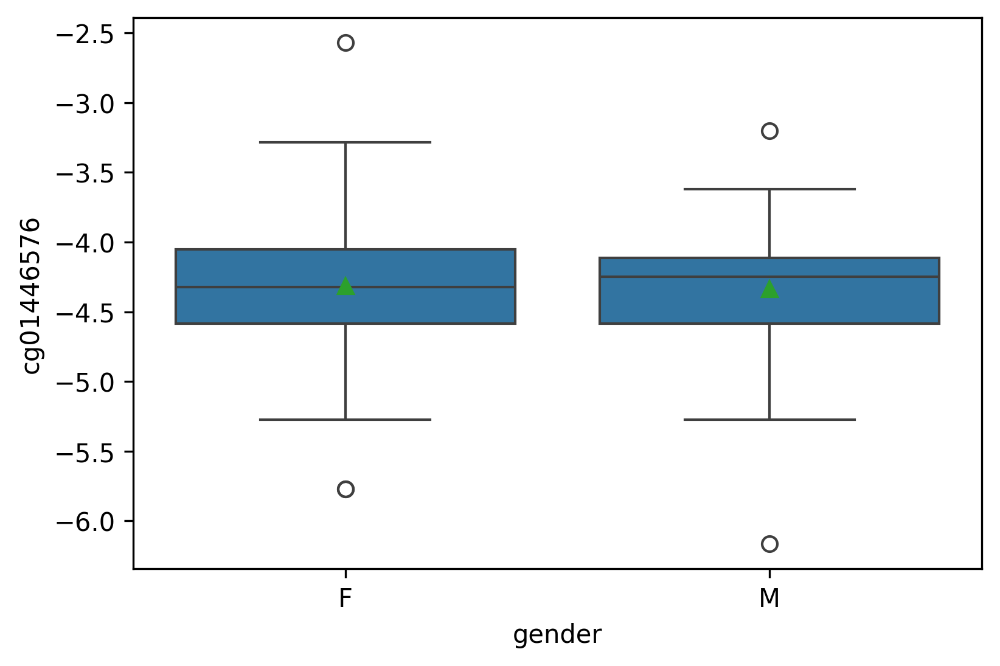

In [197]:
#绘制箱型图
for name in SexDiffResult['Features']:
    Box=plt.figure(dpi=300)
    sns.boxplot(Stroke,x='gender',y=name,showmeans=True)
    plt.show()

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

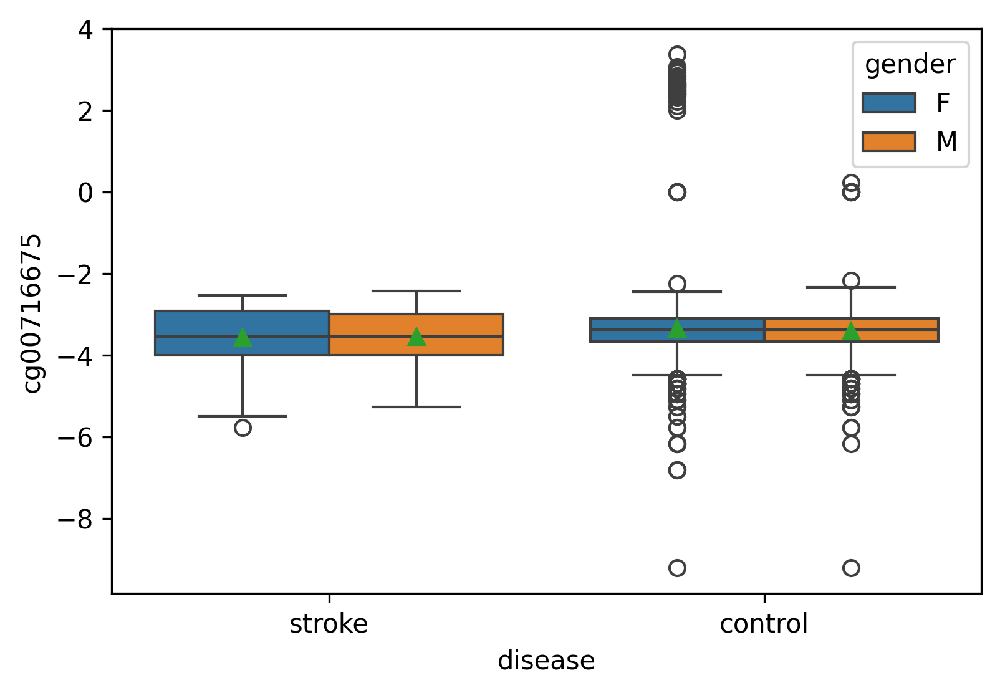

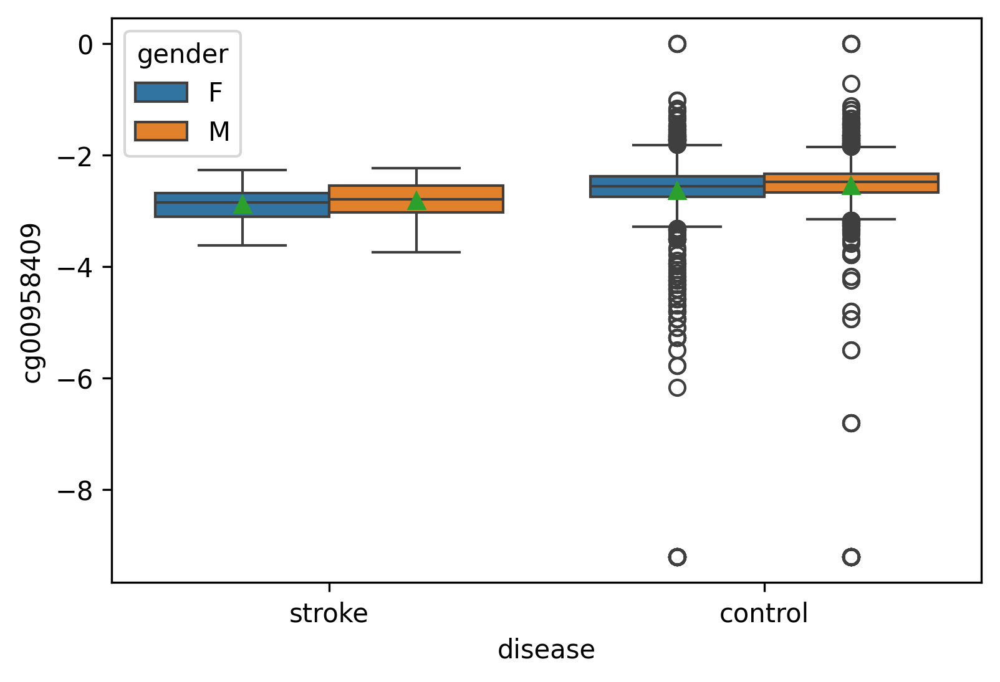

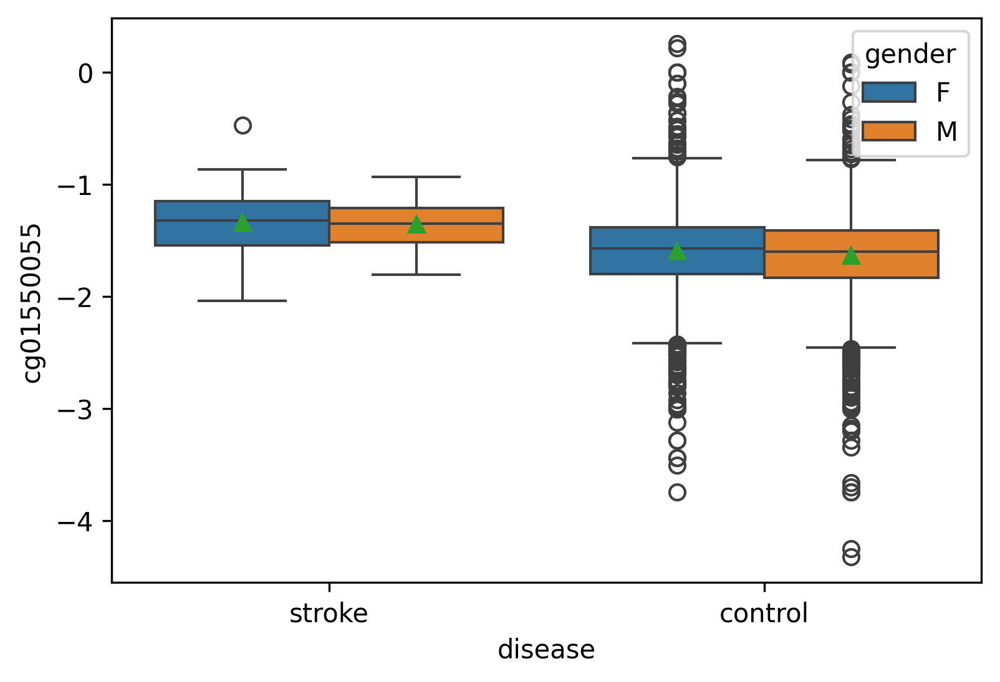

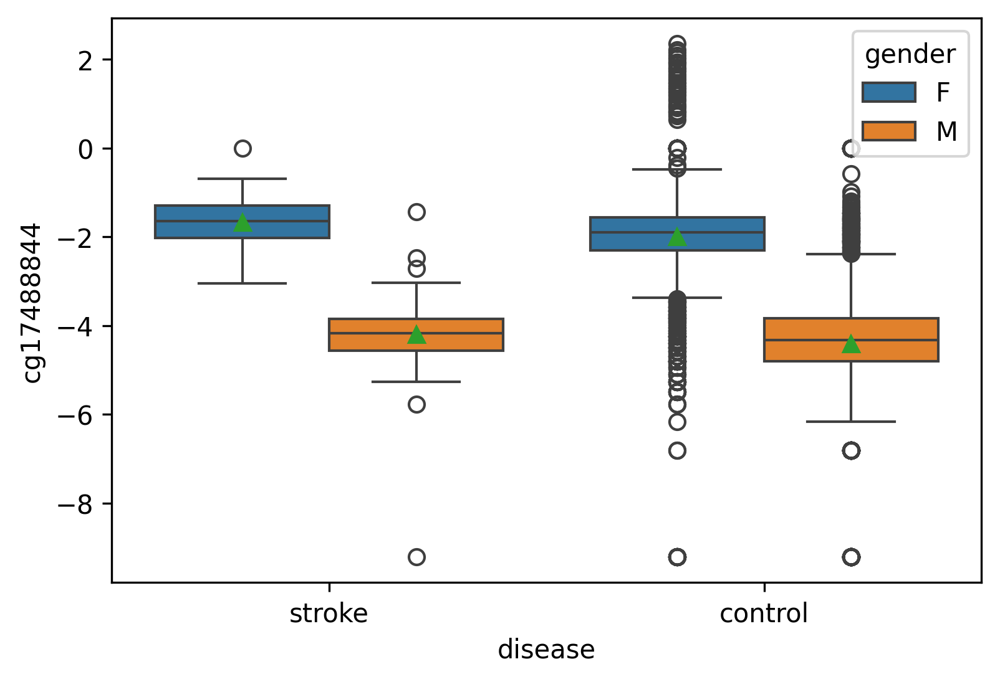

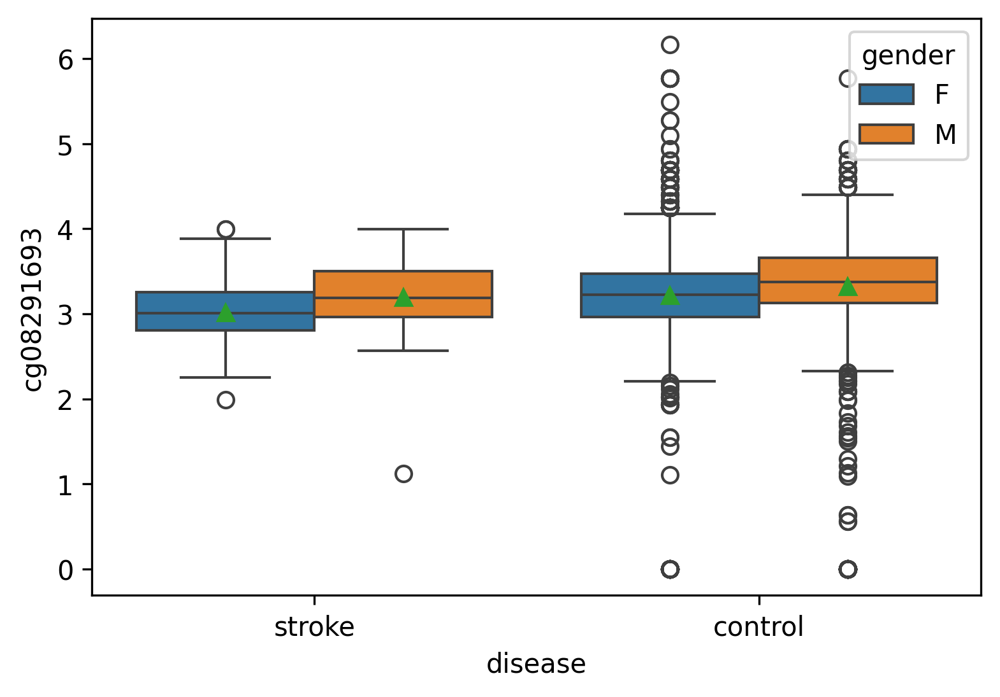

...

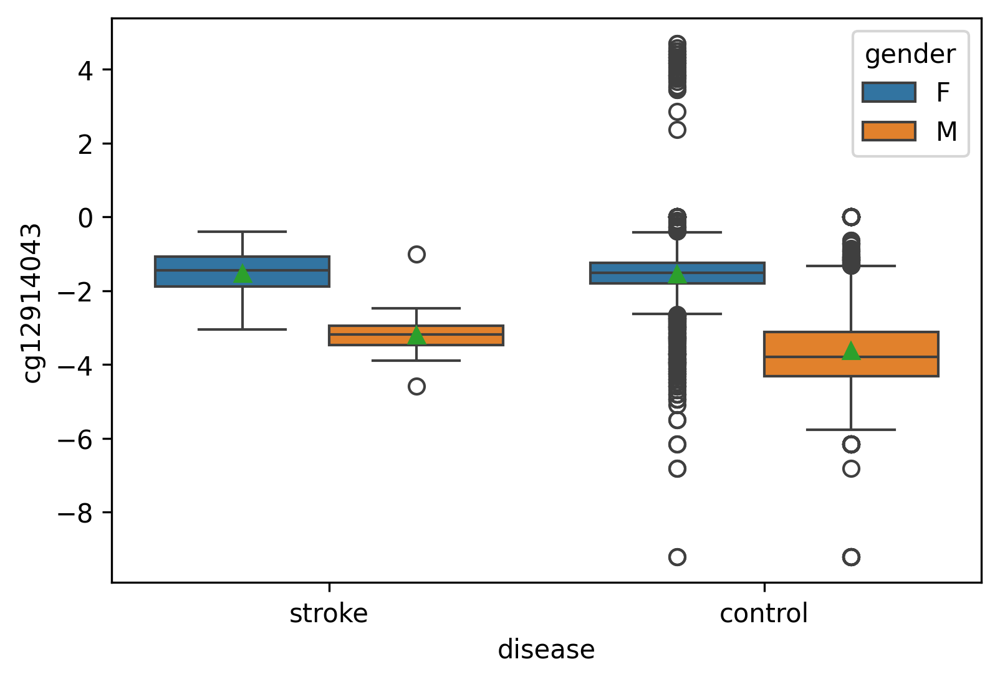

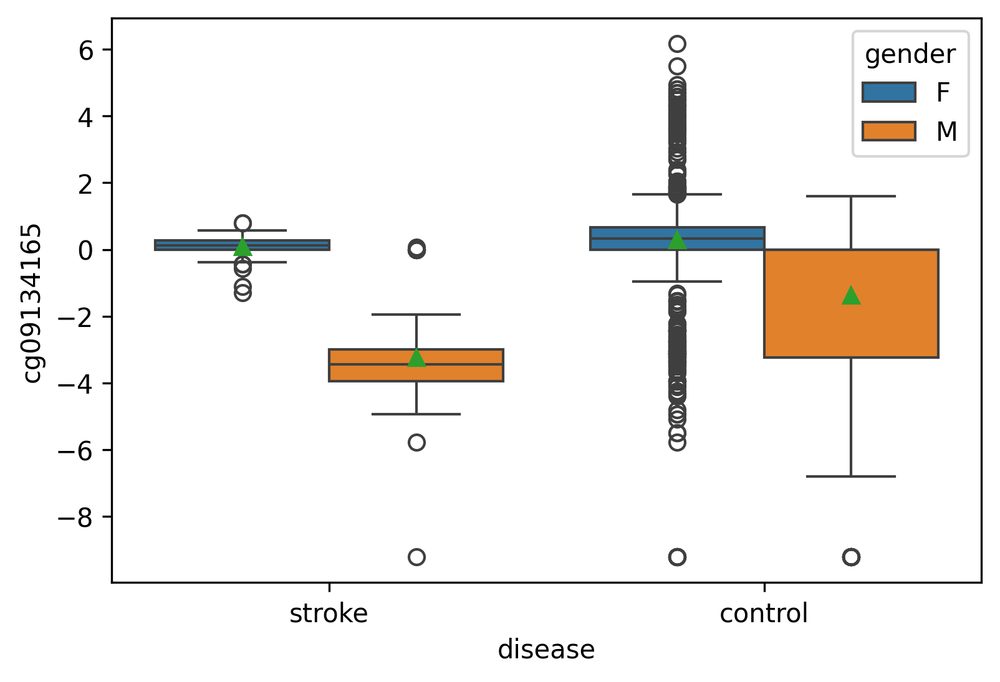

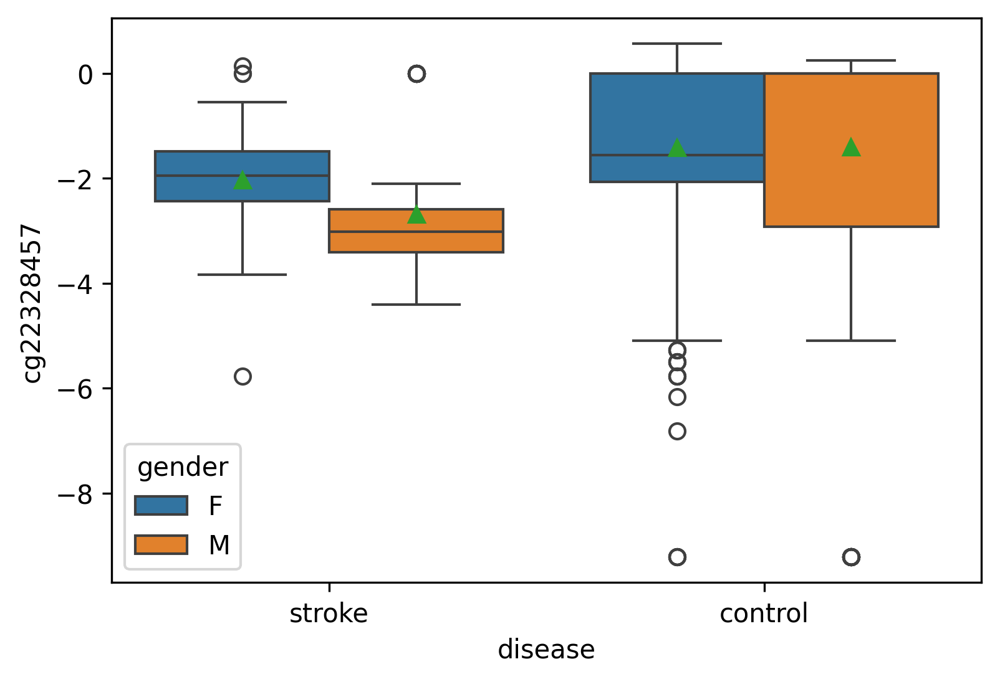

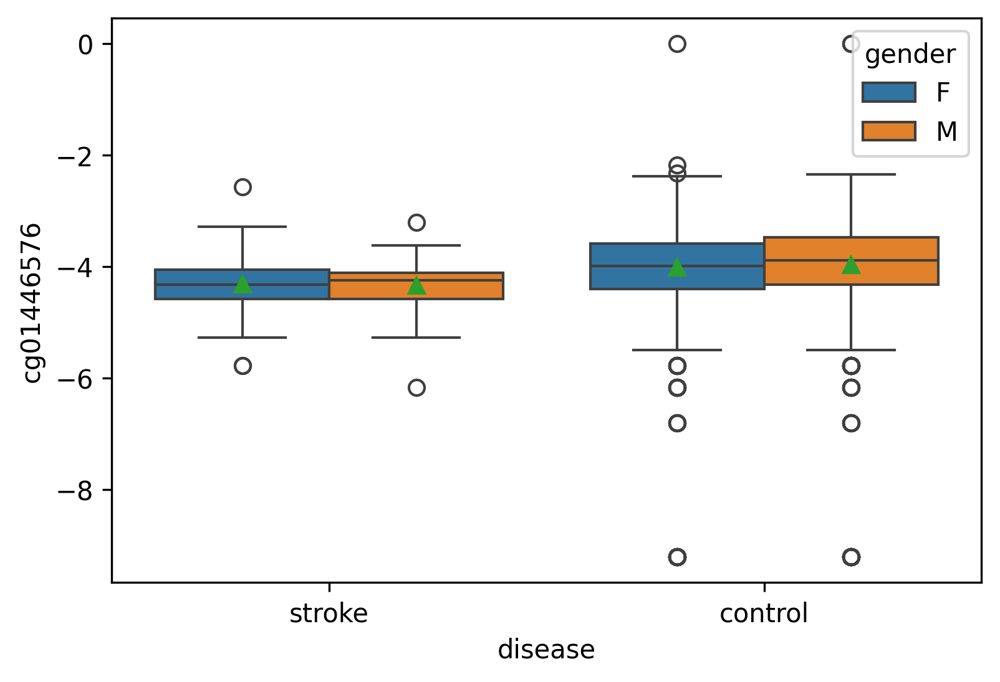

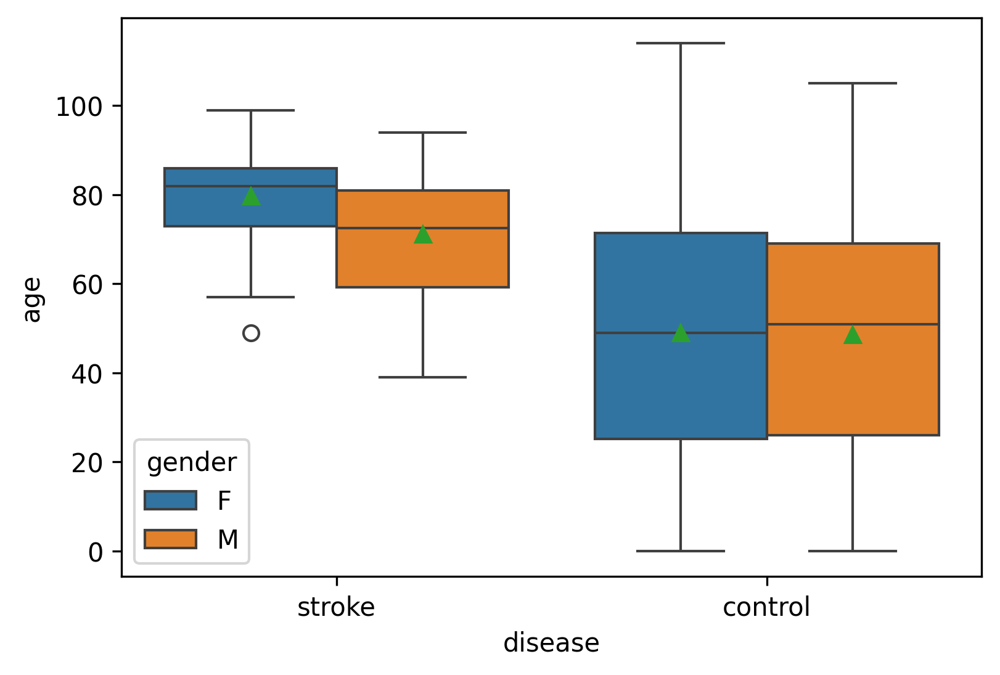

In [14]:
for cg_name in list(Feature_CG)+['age']:
    box=plt.figure(dpi=300)
    sns.boxplot(StatData,x='disease',y=cg_name,hue='gender',showmeans=True)
    plt.show()

In [16]:
#提取卒中患者VS对照组与男性患者与女性患者甲基化数据取交集_[Top 10]
CG_StrokeVSControl=['cg05876899', 'cg00958409', 'cg21459545', 'cg01550055', 'cg22328457', 'cg01446576', 'cg17917970', 
                    'cg09134165', 'cg00328972','cg01717973']
CG_StrokeManVSFeman=['cg23429746', 'cg09834142', 'cg17488844', 'cg21939789', 'cg21459545', 'cg12914043', 'cg25967516', 
                     'cg19214916', 'cg09134165', 'cg17917970']
Get_DiffCG=set(CG_StrokeVSControl)&set(CG_StrokeManVSFeman)
print(Get_DiffCG)

{'cg09134165', 'cg21459545', 'cg17917970'}


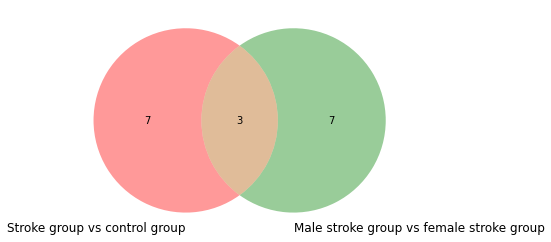

In [199]:
#绘制韦恩图
plt.figure(figsize=(6,8))
venn2([set(CG_StrokeVSControl),set(CG_StrokeManVSFeman)],set_labels=('Stroke group vs control group','Male stroke group vs female stroke group'))
plt.show()

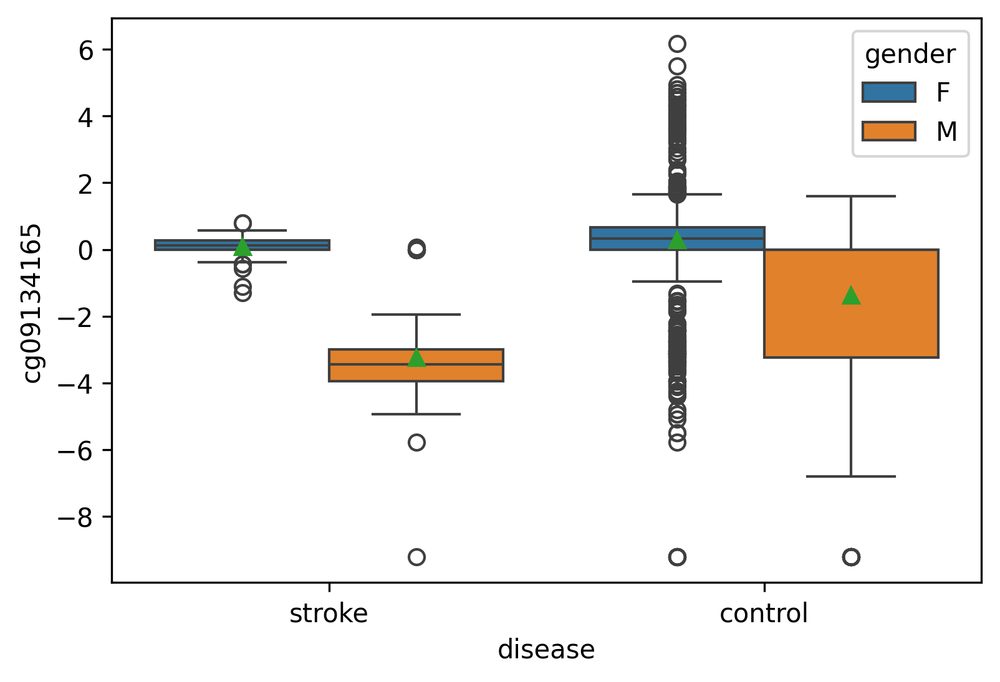

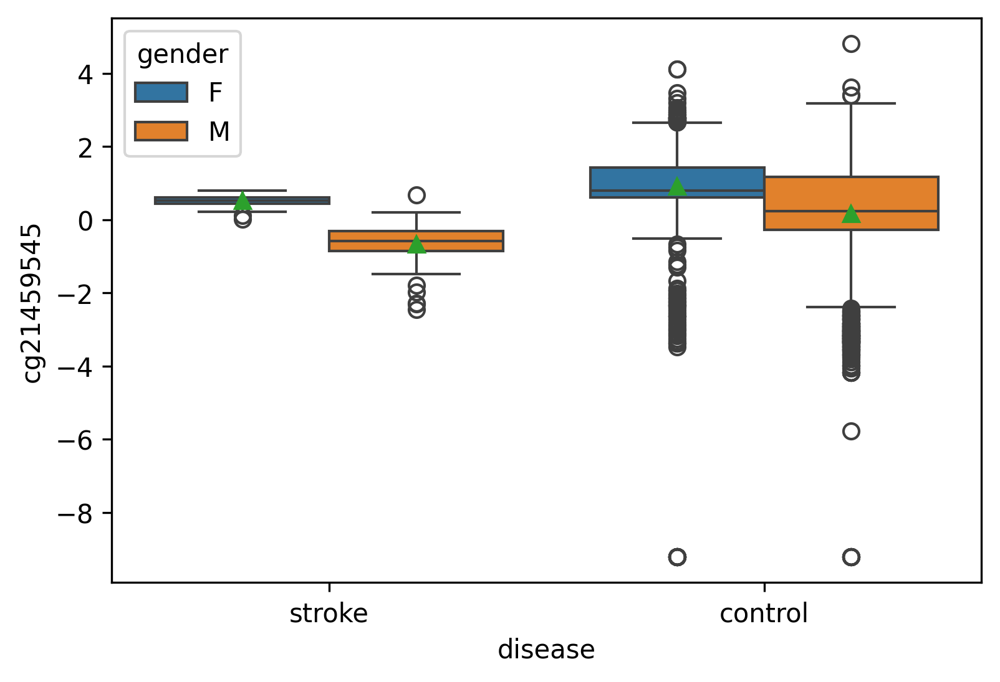

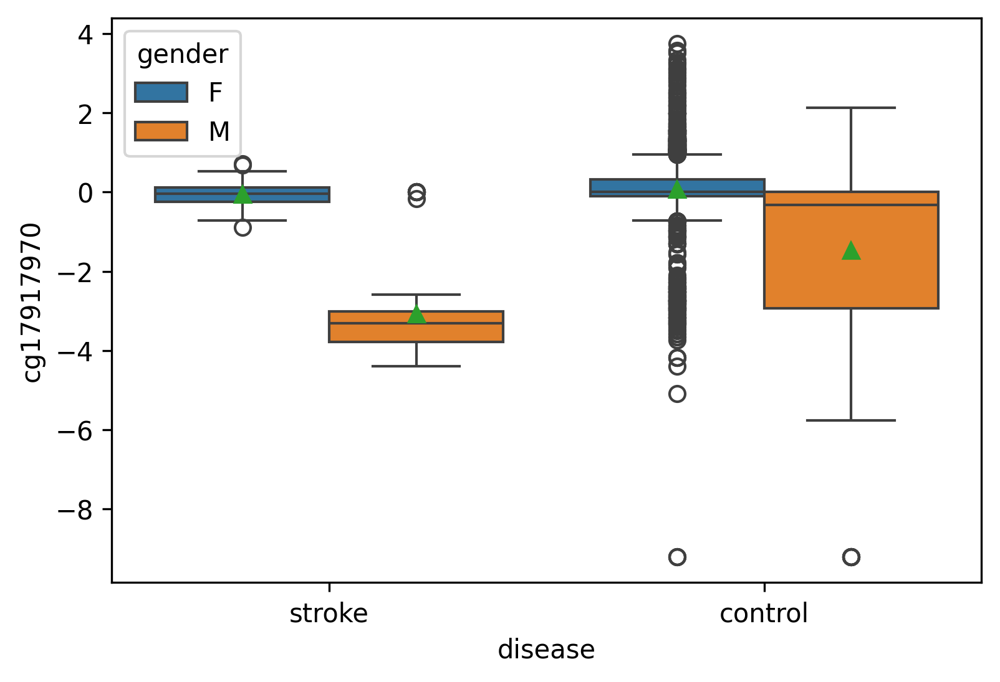

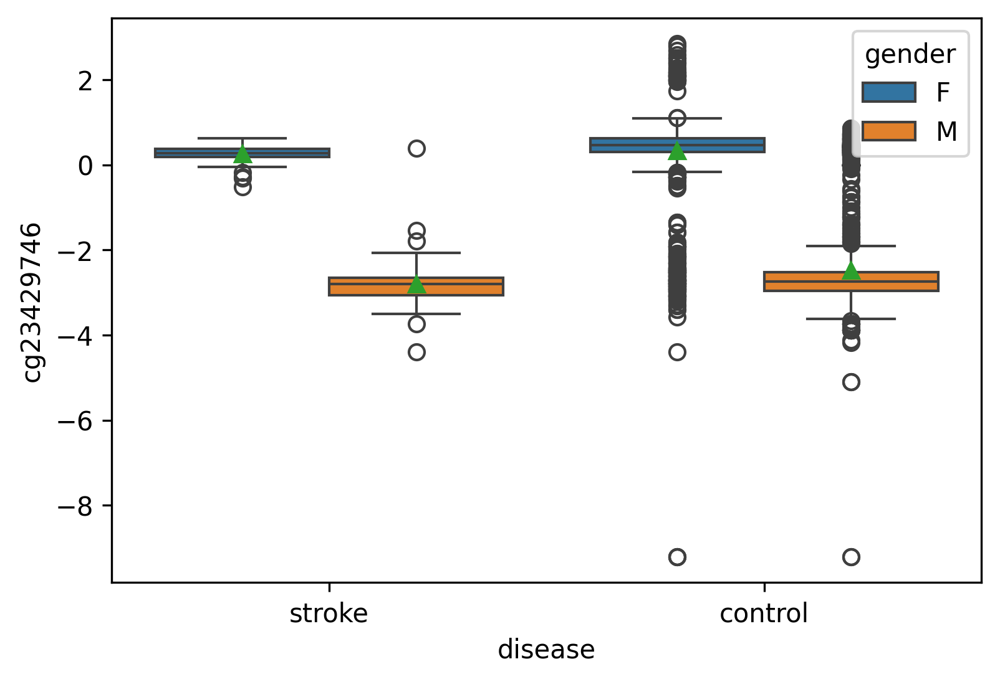

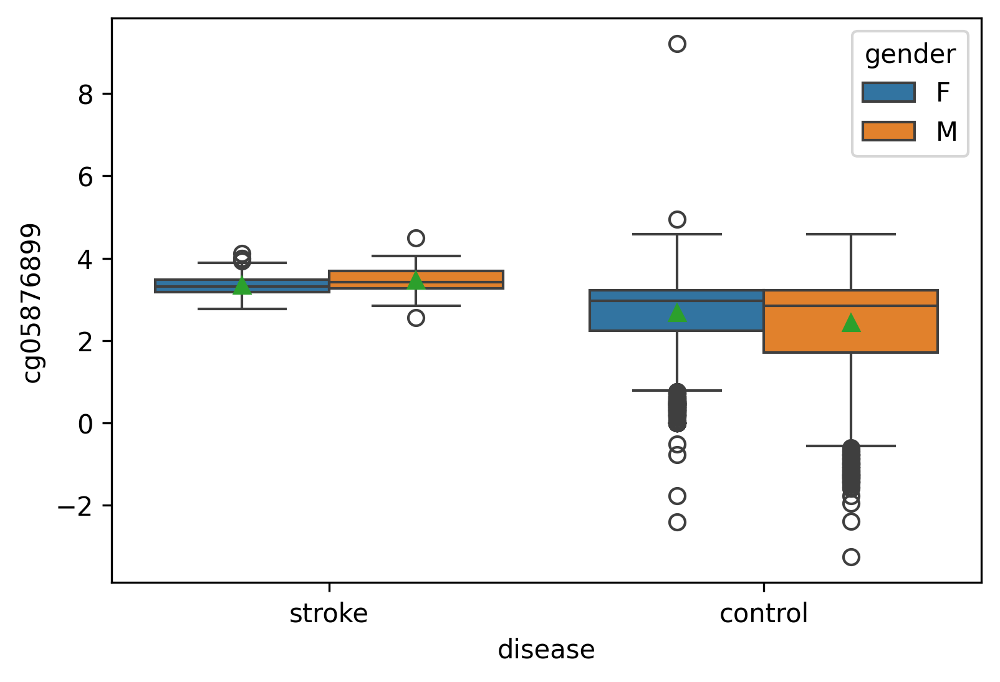

In [17]:
for cg_name in list(Get_DiffCG)+['cg23429746','cg05876899']:
    box=plt.figure(dpi=300)
    sns.boxplot(StatData,x='disease',y=cg_name,hue='gender',showmeans=True)
    plt.show()

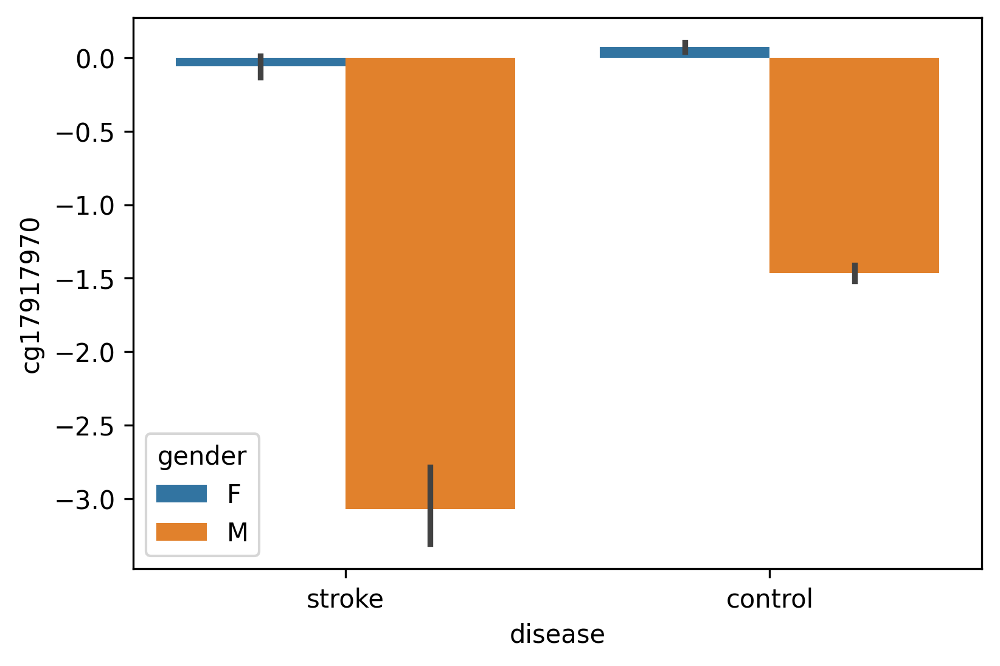

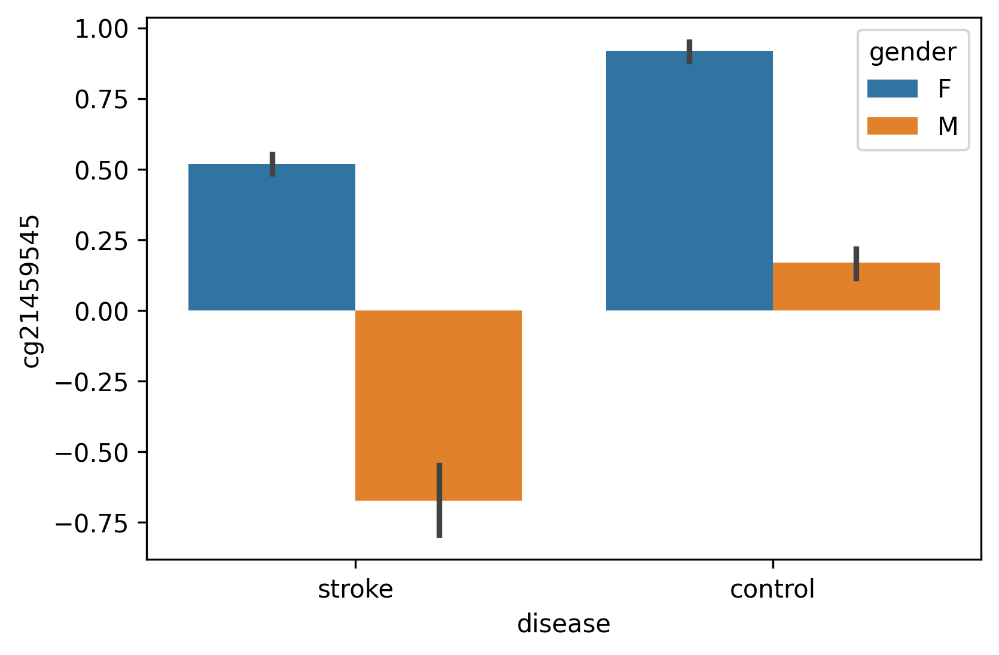

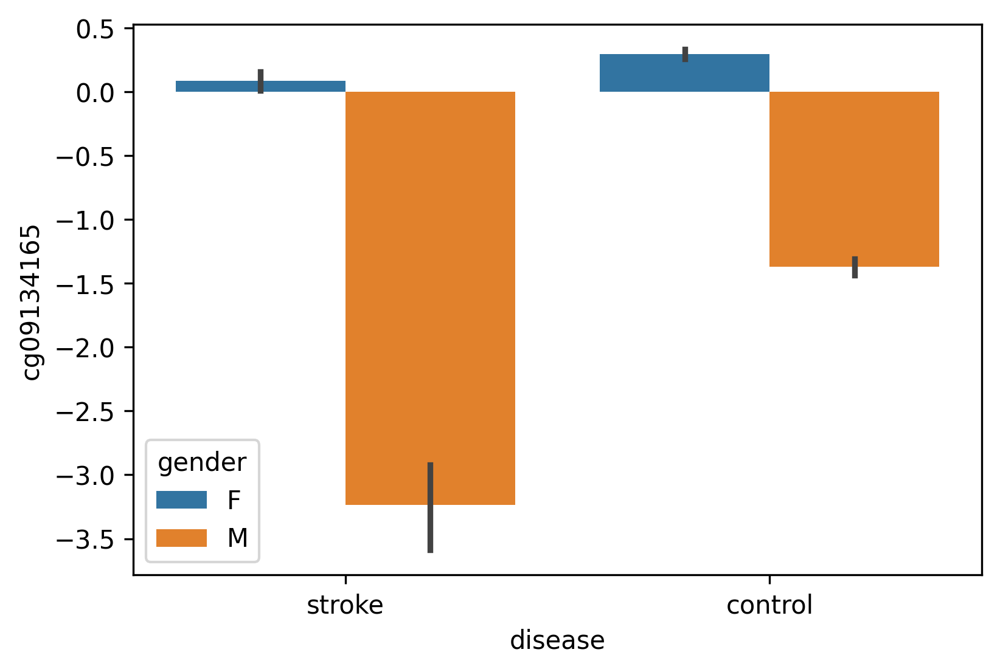

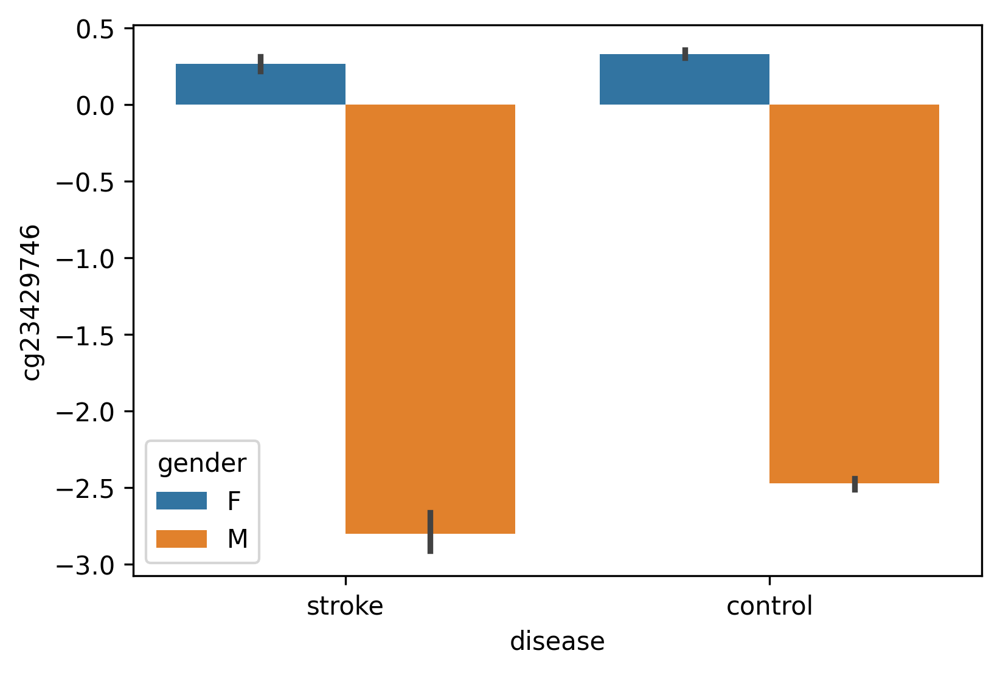

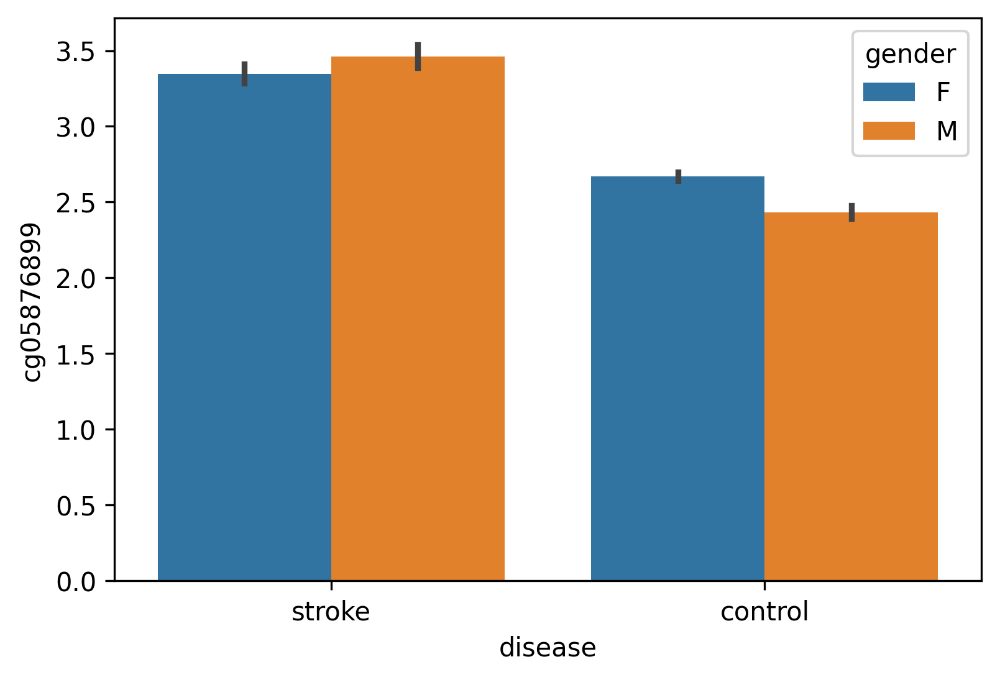

In [207]:
#绘制条形图
for cg_name in list(Get_DiffCG)+['cg23429746','cg05876899']:
    box=plt.figure(dpi=300)
    sns.barplot(StatData,x='disease',y=cg_name,hue='gender',errorbar="ci") #95%CI
    plt.show()